   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.4/7.4 MB 50.9 MB/s eta 0:00:00
Reading /content/drive/MyDrive/Design_Project/dataset/43Abby_Resting.fdt
Reading 0 ... 81920  =      0.000 ...   160.000 secs...
<RawEEGLAB | 43Abby_Resting.fdt, 63 x 81921 (160.0 s), ~39.4 MiB, data loaded>
Channels: ['A3', 'A5', 'A7', 'A10', 'A12', 'A15', 'A17', 'A19', 'A21', 'A23', 'A25', 'A28', 'A30', 'A32', 'B2', 'B4', 'B7', 'B9', 'B11', 'B12', 'B14', 'B16', 'B18', 'B20', 'B22', 'B24', 'B26', 'B27', 'B29', 'B31', 'C2', 'C4', 'C5', 'C7', 'C8', 'C12', 'C14', 'C16', 'C17', 'C19', 'C21', 'C23', 'C25', 'C27', 'C29', 'C30', 'D2', 'D4', 'D5', 'D7', 'D8', 'D10', 'D12', 'D14', 'D16', 'D19', 'D21', 'D23', 'D24', 'D26', 'D28', 'D30', 'D31']
Sampling frequency: 512.0


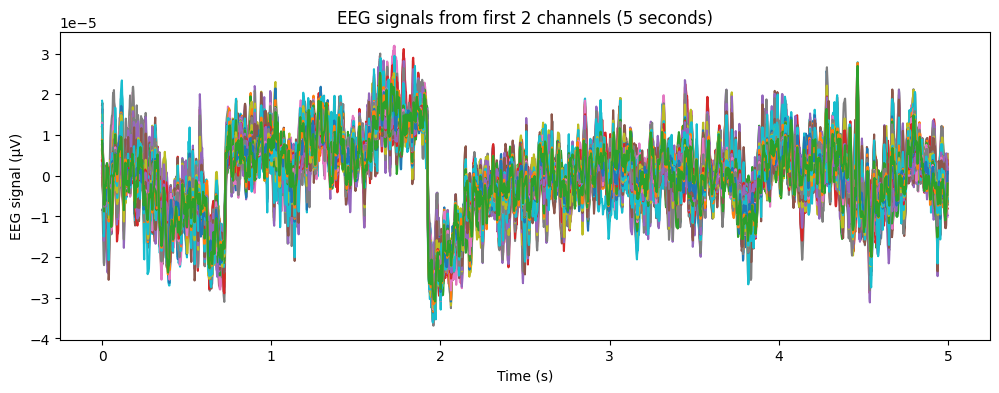

Using matplotlib as 2D backend.


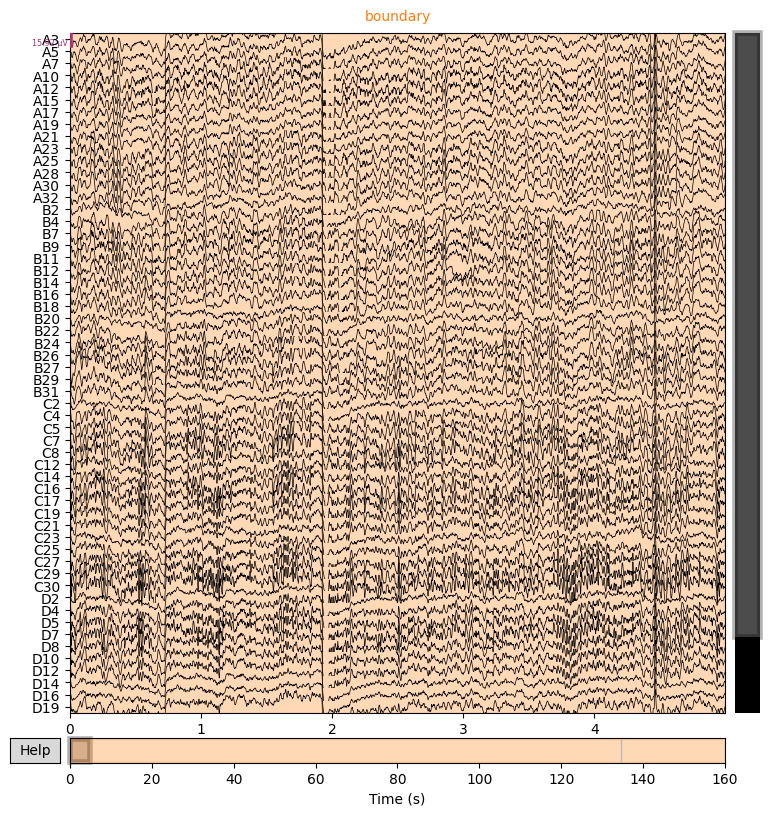

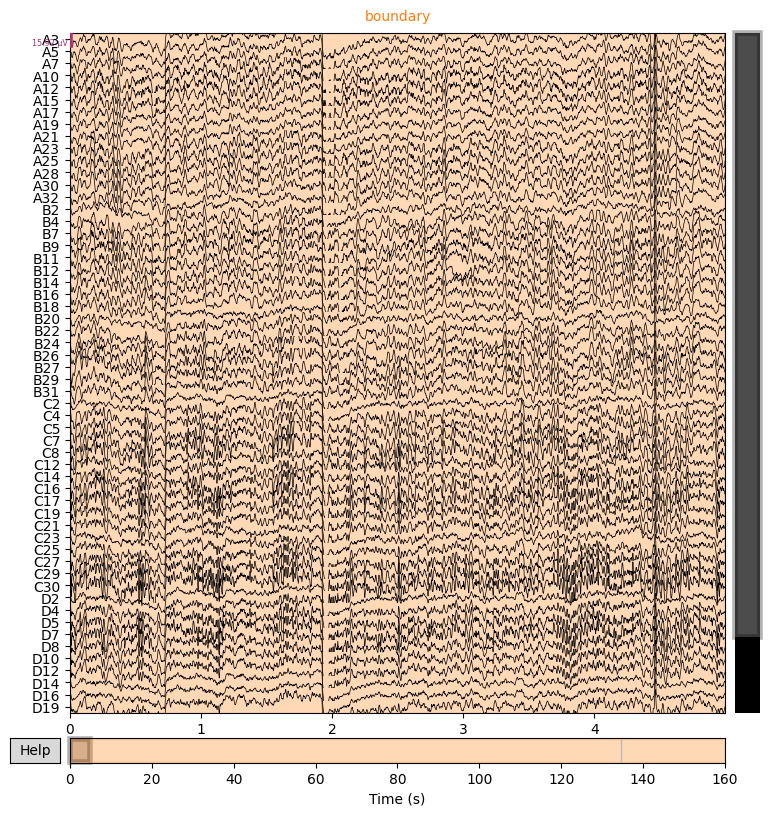

In [ ]:
# Install MNE (if not already installed)
!pip install mne

import mne
import matplotlib.pyplot as plt

# Load your EEG dataset (replace with your actual file name)
# Make sure both `1.set` and `1.fdt` are in the same folder in Colab
raw = mne.io.read_raw_eeglab('/content/drive/MyDrive/Design_Project/dataset/43Abby_Resting.set', preload=True)

# Print basic info
print(raw)
print("Channels:", raw.info['ch_names'])
print("Sampling frequency:", raw.info['sfreq'])

# Plot first 5 seconds of EEG from the first 2 channels
data, times = raw[:, 0:int(5 * raw.info['sfreq'])]  # first 5 sec
plt.figure(figsize=(
  12, 4))
plt.plot(times, data.T)
plt.xlabel("Time (s)")
plt.ylabel("EEG signal (µV)")
plt.title("EEG signals from first 2 channels (5 seconds)")
plt.show()

# You can also use MNE's built-in interactive plot
raw.plot(n_channels=56, duration=5, scalings='auto')

<RawEEGLAB | 8Abby_Resting_cleaned.set, 60 x 81921 (160.0 s), ~37.6 MiB, data loaded>
Channels: ['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCz', 'C2', 'C4', 'C6', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2']
Sampling frequency: 512.0


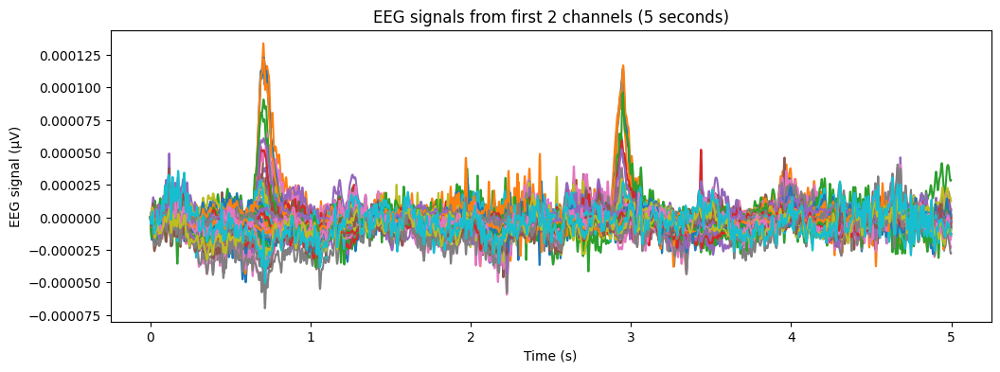

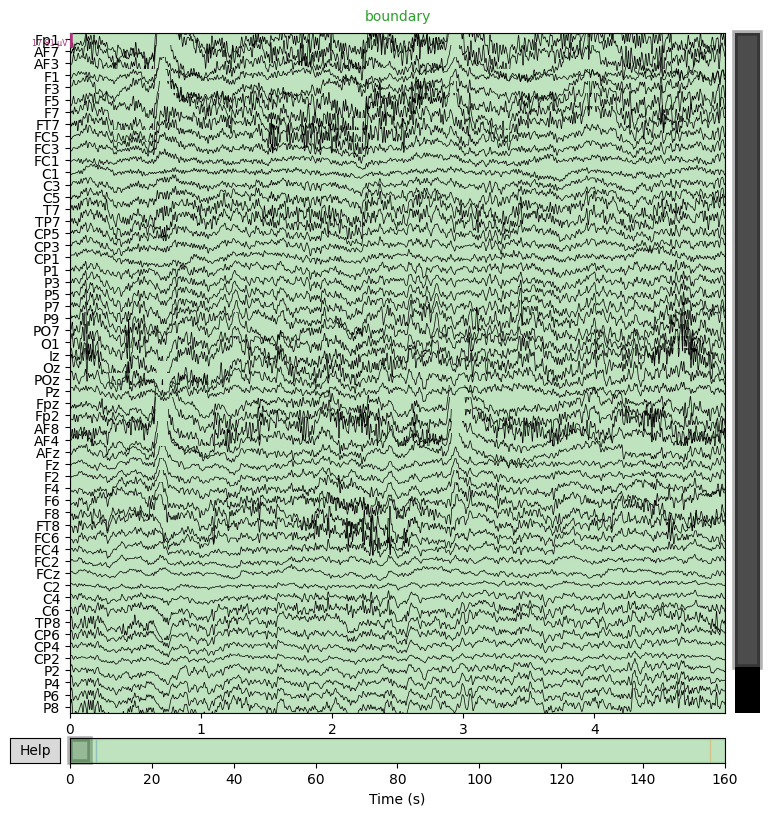

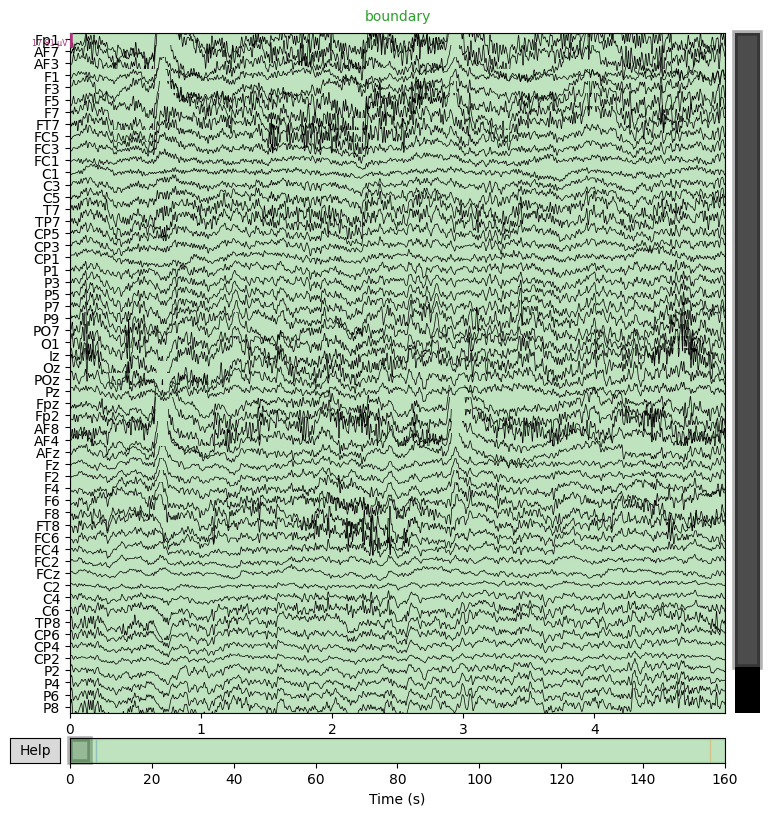

In [ ]:
# @title
# Install MNE (if not already installed)
!pip install mne

import mne
import matplotlib.pyplot as plt

# Load your EEG dataset (replace with your actual file name)
# Make sure both `1.set` and `1.fdt` are in the same folder in Colab
raw = mne.io.read_raw_eeglab('/content/drive/MyDrive/Design_Project/clean_data/8Abby_Resting_cleaned.set', preload=True)

# Print basic info
print(raw)
print("Channels:", raw.info['ch_names'])
print("Sampling frequency:", raw.info['sfreq'])

# Plot first 5 seconds of EEG from the first 2 channels
data, times = raw[:, 0:int(5 * raw.info['sfreq'])]  # first 5 sec
plt.figure(figsize=(
  12, 4))
plt.plot(times, data.T)
plt.xlabel("Time (s)")
plt.ylabel("EEG signal (µV)")
plt.title("EEG signals from first 2 channels (5 seconds)")
plt.show()

# You can also use MNE's built-in interactive plot
raw.plot(n_channels=56, duration=5, scalings='auto')

Reading /content/1Abby_Resting.fdt
Reading 0 ... 81920  =      0.000 ...   160.000 secs...
Effective window size : 4.000 (s)


/tmp/ipython-input-1032128625.py:17: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_eeglab("1Abby_Resting.set", preload=True)



--- Peak Alpha Frequency (PAF) ---
The Peak Alpha Frequency is: 11.00 Hz


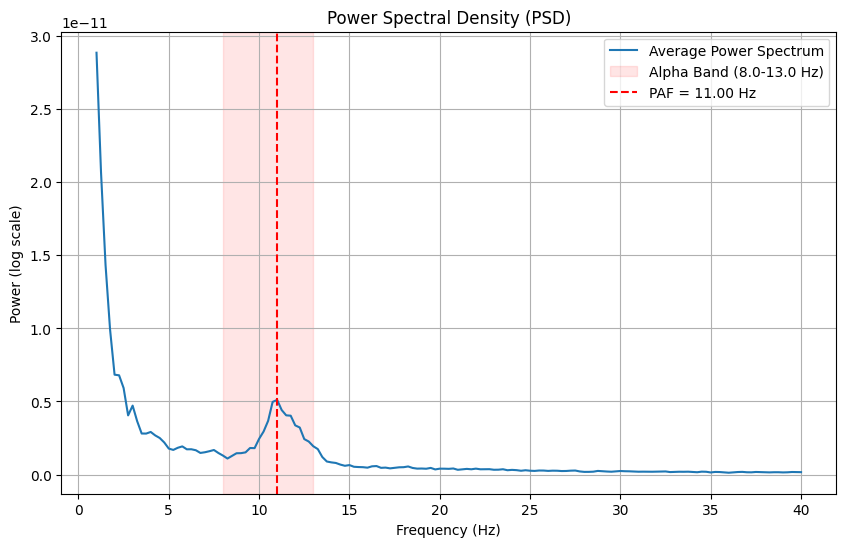

In [ ]:
# @title
import mne
import numpy as np
import matplotlib.pyplot as plt
import warnings

# Suppress common MNE warnings
warnings.filterwarnings("ignore", message="Limited 1 annotation(s) that were expanding outside the data range.")
warnings.filterwarnings("ignore", message="The data contains 'boundary' events, indicating data discontinuities.")

# --- Define the Alpha Band ---
ALPHA_FMIN = 8.0  # 8 Hz
ALPHA_FMAX = 13.0 # 13 Hz

try:
    # --- Step 1: Load the Data ---
    # We must use preload=True to load the actual signal from the .fdt file
    raw = mne.io.read_raw_eeglab("1Abby_Resting.set", preload=True)

    # --- Step 2: Calculate the Power Spectral Density (PSD) ---
    # This computes the "power" (loudness) at each frequency.
    # We'll look from 1 Hz to 40 Hz.
    # 'welch' is a standard method for calculating this.
    spectrum = raw.compute_psd(method='welch', fmin=1.0, fmax=40.0)

    # get_data() gives us the power values (psds) and their frequencies (freqs)
    psds, freqs = spectrum.get_data(return_freqs=True)

    # Average the power across all 56 electrodes to get one 'global' power spectrum
    mean_psd = psds.mean(axis=0)

    # --- Step 3: "Zoom In" to the Alpha Band ---

    # Find the positions (indices) in the 'freqs' array that are between 8 and 13 Hz
    alpha_indices = np.where((freqs >= ALPHA_FMIN) & (freqs <= ALPHA_FMAX))[0]

    # Use these indices to get only the alpha-band frequencies and their power
    alpha_freqs = freqs[alpha_indices]
    alpha_psd = mean_psd[alpha_indices]

    # --- Step 4: Find the Peak ---

    # Find the position (index) of the *highest* power value in the alpha band
    peak_index = np.argmax(alpha_psd)

    # The PAF is the frequency at that highest point
    paf = alpha_freqs[peak_index]

    print(f"\n--- Peak Alpha Frequency (PAF) ---")
    print(f"The Peak Alpha Frequency is: {paf:.2f} Hz")


    # --- Step 5: Plot the Results (Very Important!) ---
    # This plot is your "sanity check" to make sure the number is correct.

    plt.figure(figsize=(10, 6))

    # Plot the full spectrum (1-40 Hz)
    plt.plot(freqs, mean_psd, label='Average Power Spectrum')

    # Shade the alpha band in light red
    plt.axvspan(ALPHA_FMIN, ALPHA_FMAX, color='red', alpha=0.1, label=f'Alpha Band ({ALPHA_FMIN}-{ALPHA_FMAX} Hz)')

    # Draw a vertical line at our calculated PAF
    plt.axvline(x=paf, color='red', linestyle='--', label=f'PAF = {paf:.2f} Hz')

    plt.title('Power Spectral Density (PSD)')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Power (log scale)')
    plt.legend()
    plt.grid(True)
    plt.show()


except FileNotFoundError:
    print("Error: The file '1Abby_Resting.set' (or its .fdt) was not found.")
except Exception as e:
    print(f"An error occurred: {e}")

Reading /content/2Abby_Resting.fdt
Reading 0 ... 81920  =      0.000 ...   160.000 secs...
Effective window size : 4.000 (s)

--- Peak Alpha Frequency (PAF) ---
The Peak Alpha Frequency is: 8.00 Hz


/tmp/ipython-input-1146982764.py:17: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_eeglab("2Abby_Resting.set", preload=True)


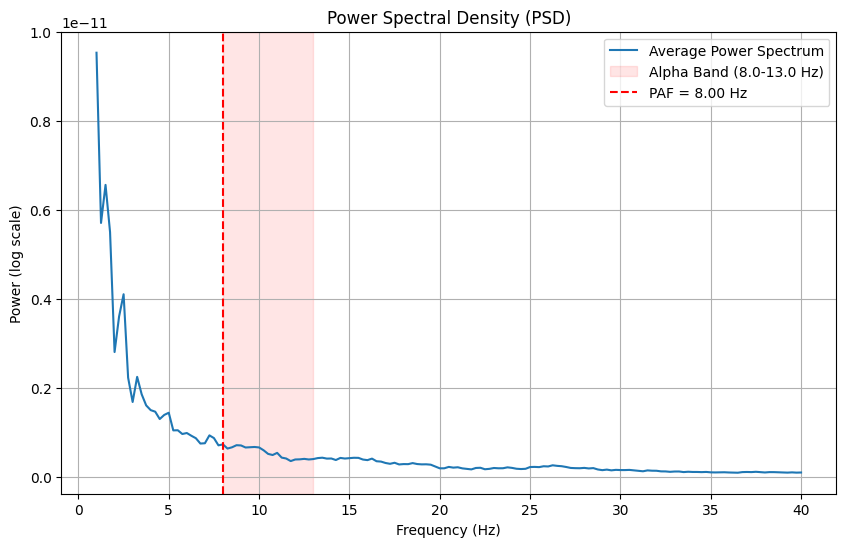

In [ ]:
# @title
import mne
import numpy as np
import matplotlib.pyplot as plt
import warnings

# Suppress common MNE warnings
warnings.filterwarnings("ignore", message="Limited 1 annotation(s) that were expanding outside the data range.")
warnings.filterwarnings("ignore", message="The data contains 'boundary' events, indicating data discontinuities.")

# --- Define the Alpha Band ---
ALPHA_FMIN = 8.0  # 8 Hz
ALPHA_FMAX = 13.0 # 13 Hz

try:
    # --- Step 1: Load the Data ---
    # We must use preload=True to load the actual signal from the .fdt file
    raw = mne.io.read_raw_eeglab("2Abby_Resting.set", preload=True)

    # --- Step 2: Calculate the Power Spectral Density (PSD) ---
    # This computes the "power" (loudness) at each frequency.
    # We'll look from 1 Hz to 40 Hz.
    # 'welch' is a standard method for calculating this.
    spectrum = raw.compute_psd(method='welch', fmin=1.0, fmax=40.0)

    # get_data() gives us the power values (psds) and their frequencies (freqs)
    psds, freqs = spectrum.get_data(return_freqs=True)

    # Average the power across all 56 electrodes to get one 'global' power spectrum
    mean_psd = psds.mean(axis=0)

    # --- Step 3: "Zoom In" to the Alpha Band ---

    # Find the positions (indices) in the 'freqs' array that are between 8 and 13 Hz
    alpha_indices = np.where((freqs >= ALPHA_FMIN) & (freqs <= ALPHA_FMAX))[0]

    # Use these indices to get only the alpha-band frequencies and their power
    alpha_freqs = freqs[alpha_indices]
    alpha_psd = mean_psd[alpha_indices]

    # --- Step 4: Find the Peak ---

    # Find the position (index) of the *highest* power value in the alpha band
    peak_index = np.argmax(alpha_psd)

    # The PAF is the frequency at that highest point
    paf = alpha_freqs[peak_index]

    print(f"\n--- Peak Alpha Frequency (PAF) ---")
    print(f"The Peak Alpha Frequency is: {paf:.2f} Hz")


    # --- Step 5: Plot the Results (Very Important!) ---
    # This plot is your "sanity check" to make sure the number is correct.

    plt.figure(figsize=(10, 6))

    # Plot the full spectrum (1-40 Hz)
    plt.plot(freqs, mean_psd, label='Average Power Spectrum')

    # Shade the alpha band in light red
    plt.axvspan(ALPHA_FMIN, ALPHA_FMAX, color='red', alpha=0.1, label=f'Alpha Band ({ALPHA_FMIN}-{ALPHA_FMAX} Hz)')

    # Draw a vertical line at our calculated PAF
    plt.axvline(x=paf, color='red', linestyle='--', label=f'PAF = {paf:.2f} Hz')

    plt.title('Power Spectral Density (PSD)')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Power (log scale)')
    plt.legend()
    plt.grid(True)
    plt.show()


except FileNotFoundError:
    print("Error: The file '1Abby_Resting.set' (or its .fdt) was not found.")
except Exception as e:
    print(f"An error occurred: {e}")

Processing File 1/56: 1Abby_Resting.set... 

/tmp/ipython-input-3379863673.py:35: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_eeglab(filepath, preload=True, verbose=False)


PAF: 11.00 Hz ✓
Processing File 2/56: 2Abby_Resting.set... 

/tmp/ipython-input-3379863673.py:35: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_eeglab(filepath, preload=True, verbose=False)


PAF: 8.00 Hz ✓
Processing File 3/56: 3Abby_Resting.set... 

/tmp/ipython-input-3379863673.py:35: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_eeglab(filepath, preload=True, verbose=False)


PAF: 11.25 Hz ✓
Processing File 4/56: 4Abby_Resting.set... 

/tmp/ipython-input-3379863673.py:35: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_eeglab(filepath, preload=True, verbose=False)


PAF: 8.50 Hz ✓
Processing File 5/56: 5Abby_Resting.set... 

/tmp/ipython-input-3379863673.py:35: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_eeglab(filepath, preload=True, verbose=False)


PAF: 8.25 Hz ✓
Processing File 6/56: 6Abby_Resting.set... 

/tmp/ipython-input-3379863673.py:35: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_eeglab(filepath, preload=True, verbose=False)


PAF: 10.00 Hz ✓
Processing File 7/56: 7Abby_Resting.set... 

/tmp/ipython-input-3379863673.py:35: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_eeglab(filepath, preload=True, verbose=False)


PAF: 8.50 Hz ✓
Processing File 8/56: 8Abby_Resting.set... 

/tmp/ipython-input-3379863673.py:35: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_eeglab(filepath, preload=True, verbose=False)


PAF: 10.00 Hz ✓
Processing File 9/56: 9Abby_Resting.set... 

/tmp/ipython-input-3379863673.py:35: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_eeglab(filepath, preload=True, verbose=False)


PAF: 11.75 Hz ✓
Processing File 10/56: 10Abby_Resting.set... 

/tmp/ipython-input-3379863673.py:35: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_eeglab(filepath, preload=True, verbose=False)


PAF: 8.75 Hz ✓
Processing File 11/56: 11Abby_Resting.set... 

/tmp/ipython-input-3379863673.py:35: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_eeglab(filepath, preload=True, verbose=False)


PAF: 10.00 Hz ✓
Processing File 12/56: 12Abby_Resting.set... 

/tmp/ipython-input-3379863673.py:35: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_eeglab(filepath, preload=True, verbose=False)


PAF: 8.75 Hz ✓
Processing File 13/56: 13Abby_Resting.set... 

/tmp/ipython-input-3379863673.py:35: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_eeglab(filepath, preload=True, verbose=False)


PAF: 8.00 Hz ✓
Processing File 14/56: 14Abby_Resting.set... 

/tmp/ipython-input-3379863673.py:35: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_eeglab(filepath, preload=True, verbose=False)


PAF: 8.00 Hz ✓
Processing File 15/56: 15Abby_Resting.set... 

/tmp/ipython-input-3379863673.py:35: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_eeglab(filepath, preload=True, verbose=False)


PAF: 9.50 Hz ✓
Processing File 16/56: 16Abby_Resting.set... 

/tmp/ipython-input-3379863673.py:35: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_eeglab(filepath, preload=True, verbose=False)


PAF: 10.00 Hz ✓
Processing File 17/56: 17Abby_Resting.set... 

/tmp/ipython-input-3379863673.py:35: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_eeglab(filepath, preload=True, verbose=False)


PAF: 9.25 Hz ✓
Processing File 18/56: 18Abby_Resting.set... 

/tmp/ipython-input-3379863673.py:35: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_eeglab(filepath, preload=True, verbose=False)


PAF: 9.00 Hz ✓
Processing File 19/56: 19Abby_Resting.set... 

/tmp/ipython-input-3379863673.py:35: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_eeglab(filepath, preload=True, verbose=False)


PAF: 8.50 Hz ✓
Processing File 20/56: 20Abby_Resting.set... 

/tmp/ipython-input-3379863673.py:35: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_eeglab(filepath, preload=True, verbose=False)


PAF: 11.75 Hz ✓
Processing File 21/56: 21Abby_Resting.set... 

/tmp/ipython-input-3379863673.py:35: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_eeglab(filepath, preload=True, verbose=False)


PAF: 10.50 Hz ✓
Processing File 22/56: 22Abby_Resting.set... PAF: 9.75 Hz ✓
Processing File 23/56: 23Abby_Resting.set... 

/tmp/ipython-input-3379863673.py:35: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_eeglab(filepath, preload=True, verbose=False)


PAF: 9.00 Hz ✓
Processing File 24/56: 24Abby_Resting.set... PAF: 9.50 Hz ✓
Processing File 25/56: 25Abby_Resting.set... PAF: 10.50 Hz ✓
Processing File 26/56: 26Abby_Resting.set... PAF: 10.25 Hz ✓
Processing File 27/56: 27Abby_Resting.set... PAF: 11.00 Hz ✓
Processing File 28/56: 28Abby_Resting.set... PAF: 10.00 Hz ✓
Processing File 29/56: 29Abby_Resting.set... PAF: 8.50 Hz ✓
Processing File 30/56: 30Abby_Resting.set... 

/tmp/ipython-input-3379863673.py:35: RuntimeWarning: Limited 2 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_eeglab(filepath, preload=True, verbose=False)


PAF: 10.25 Hz ✓
Processing File 31/56: 31Abby_Resting.set... 

/tmp/ipython-input-3379863673.py:35: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_eeglab(filepath, preload=True, verbose=False)


PAF: 11.25 Hz ✓
Processing File 32/56: 32Abby_Resting.set... 

/tmp/ipython-input-3379863673.py:35: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_eeglab(filepath, preload=True, verbose=False)


PAF: 10.50 Hz ✓
Processing File 33/56: 33Abby_Resting.set... 

/tmp/ipython-input-3379863673.py:35: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_eeglab(filepath, preload=True, verbose=False)


PAF: 8.00 Hz ✓
Processing File 34/56: 34Abby_Resting.set... 

/tmp/ipython-input-3379863673.py:35: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_eeglab(filepath, preload=True, verbose=False)


PAF: 10.25 Hz ✓
Processing File 35/56: 35Abby_Resting.set... 

/tmp/ipython-input-3379863673.py:35: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_eeglab(filepath, preload=True, verbose=False)


PAF: 8.00 Hz ✓
Processing File 36/56: 36Abby_Resting.set... 

/tmp/ipython-input-3379863673.py:35: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_eeglab(filepath, preload=True, verbose=False)


PAF: 10.00 Hz ✓
Processing File 37/56: 37Abby_Resting.set... 

/tmp/ipython-input-3379863673.py:35: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_eeglab(filepath, preload=True, verbose=False)


PAF: 8.25 Hz ✓
Processing File 38/56: 38Abby_Resting.set... 

/tmp/ipython-input-3379863673.py:35: RuntimeWarning: Limited 6 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_eeglab(filepath, preload=True, verbose=False)


PAF: 10.00 Hz ✓
Processing File 39/56: 39Abby_Resting.set... 

/tmp/ipython-input-3379863673.py:35: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_eeglab(filepath, preload=True, verbose=False)


PAF: 9.25 Hz ✓
Processing File 40/56: 40Abby_Resting.set... 

/tmp/ipython-input-3379863673.py:35: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_eeglab(filepath, preload=True, verbose=False)


PAF: 9.50 Hz ✓
Processing File 41/56: 41Abby_Resting.set... 

/tmp/ipython-input-3379863673.py:35: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_eeglab(filepath, preload=True, verbose=False)


PAF: 9.25 Hz ✓
Processing File 42/56: 42Abby_Resting.set... 

/tmp/ipython-input-3379863673.py:35: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_eeglab(filepath, preload=True, verbose=False)


PAF: 10.25 Hz ✓
Processing File 43/56: 43Abby_Resting.set... 

/tmp/ipython-input-3379863673.py:35: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_eeglab(filepath, preload=True, verbose=False)


PAF: 9.00 Hz ✓
Processing File 44/56: 44Abby_Resting.set... 

/tmp/ipython-input-3379863673.py:35: RuntimeWarning: Limited 2 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_eeglab(filepath, preload=True, verbose=False)


PAF: 8.25 Hz ✓
Processing File 45/56: 45Abby_Resting.set... 

/tmp/ipython-input-3379863673.py:35: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_eeglab(filepath, preload=True, verbose=False)


PAF: 8.75 Hz ✓
Processing File 46/56: 46Abby_Resting.set... 

/tmp/ipython-input-3379863673.py:35: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_eeglab(filepath, preload=True, verbose=False)


PAF: 8.00 Hz ✓
Processing File 47/56: 47Abby_Resting.set... 

/tmp/ipython-input-3379863673.py:35: RuntimeWarning: Limited 2 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_eeglab(filepath, preload=True, verbose=False)


PAF: 11.25 Hz ✓
Processing File 48/56: 48Abby_Resting.set... 

/tmp/ipython-input-3379863673.py:35: RuntimeWarning: Limited 2 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_eeglab(filepath, preload=True, verbose=False)


PAF: 10.50 Hz ✓
Processing File 49/56: 49Abby_Resting.set... 

/tmp/ipython-input-3379863673.py:35: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_eeglab(filepath, preload=True, verbose=False)


PAF: 9.75 Hz ✓
Processing File 50/56: 50Abby_Resting.set... 

/tmp/ipython-input-3379863673.py:35: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_eeglab(filepath, preload=True, verbose=False)


PAF: 10.00 Hz ✓
Processing File 51/56: 51Abby_Resting.set... 

/tmp/ipython-input-3379863673.py:35: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_eeglab(filepath, preload=True, verbose=False)


PAF: 9.50 Hz ✓
Processing File 52/56: 52Abby_Resting.set... 

/tmp/ipython-input-3379863673.py:35: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_eeglab(filepath, preload=True, verbose=False)


PAF: 10.25 Hz ✓
Processing File 53/56: 53Abby_Resting.set... 

/tmp/ipython-input-3379863673.py:35: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_eeglab(filepath, preload=True, verbose=False)


PAF: 10.00 Hz ✓
Processing File 54/56: 54Abby_Resting.set... 

/tmp/ipython-input-3379863673.py:35: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_eeglab(filepath, preload=True, verbose=False)


PAF: 9.75 Hz ✓
Processing File 55/56: 55Abby_Resting.set... 

/tmp/ipython-input-3379863673.py:35: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_eeglab(filepath, preload=True, verbose=False)


PAF: 10.25 Hz ✓
Processing File 56/56: 56Abby_Resting.set... 

/tmp/ipython-input-3379863673.py:35: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_eeglab(filepath, preload=True, verbose=False)


PAF: 8.25 Hz ✓


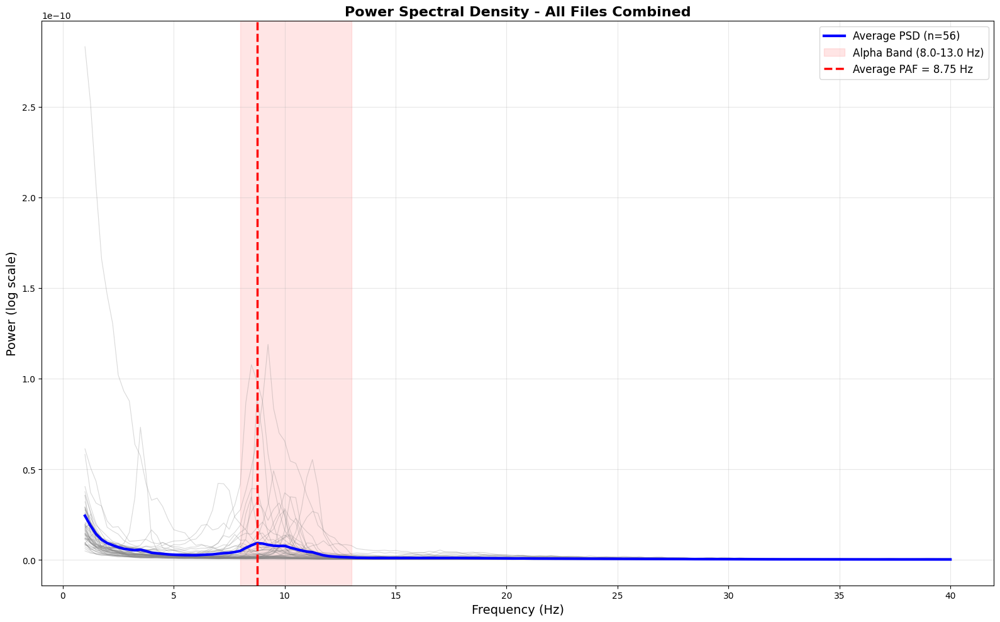


SUMMARY STATISTICS

Total files processed: 56

--- Individual PAF Statistics ---
Mean PAF: 9.57 Hz
Median PAF: 9.75 Hz
Std Dev: 1.03 Hz
Min PAF: 8.00 Hz (File 2)
Max PAF: 11.75 Hz (File 9)

--- Average PSD PAF ---
PAF from averaged PSD: 8.75 Hz


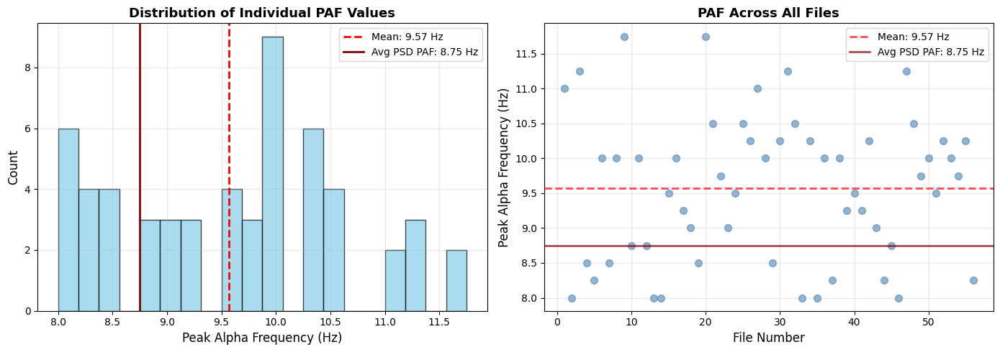


File #   PAF (Hz)  
--------------------
1        11.00     
2        8.00      
3        11.25     
4        8.50      
5        8.25      
6        10.00     
7        8.50      
8        10.00     
9        11.75     
10       8.75      
11       10.00     
12       8.75      
13       8.00      
14       8.00      
15       9.50      
16       10.00     
17       9.25      
18       9.00      
19       8.50      
20       11.75     
21       10.50     
22       9.75      
23       9.00      
24       9.50      
25       10.50     
26       10.25     
27       11.00     
28       10.00     
29       8.50      
30       10.25     
31       11.25     
32       10.50     
33       8.00      
34       10.25     
35       8.00      
36       10.00     
37       8.25      
38       10.00     
39       9.25      
40       9.50      
41       9.25      
42       10.25     
43       9.00      
44       8.25      
45       8.75      
46       8.00      
47       11.25     
48       10.50    

In [ ]:
# @title
import mne
import numpy as np
import matplotlib.pyplot as plt
import warnings
import os

# Suppress common MNE warnings
warnings.filterwarnings("ignore", message="Limited 1 annotation(s) that were expanding outside the data range.")
warnings.filterwarnings("ignore", message="The data contains 'boundary' events, indicating data discontinuities.")

# --- Define the Alpha Band ---
ALPHA_FMIN = 8.0  # 8 Hz
ALPHA_FMAX = 13.0 # 13 Hz

# Base path to your data
base_path = "/content/drive/MyDrive/Design_Project/dataset/"

# Lists to store results
paf_results = []
all_psds = []
all_freqs = None

# Create the main figure
plt.figure(figsize=(16, 10))

# Process files 1 through 56
for file_num in range(1, 57):
    filename = f"{file_num}Abby_Resting.set"
    filepath = os.path.join(base_path, filename)

    try:
        print(f"Processing File {file_num}/56: {filename}...", end=" ")

        # Load the data
        raw = mne.io.read_raw_eeglab(filepath, preload=True, verbose=False)

        # Calculate the Power Spectral Density
        spectrum = raw.compute_psd(method='welch', fmin=1.0, fmax=40.0, verbose=False)
        psds, freqs = spectrum.get_data(return_freqs=True)

        # Store frequencies (same for all files)
        if all_freqs is None:
            all_freqs = freqs

        # Average the power across all electrodes
        mean_psd = psds.mean(axis=0)
        all_psds.append(mean_psd)

        # Find PAF in the Alpha Band
        alpha_indices = np.where((freqs >= ALPHA_FMIN) & (freqs <= ALPHA_FMAX))[0]
        alpha_freqs = freqs[alpha_indices]
        alpha_psd = mean_psd[alpha_indices]
        peak_index = np.argmax(alpha_psd)
        paf = alpha_freqs[peak_index]

        # Store result
        paf_results.append({'file': filename, 'file_num': file_num, 'paf': paf})

        # Plot this file's spectrum with low alpha (transparency)
        plt.plot(freqs, mean_psd, alpha=0.3, linewidth=0.8, color='gray')

        print(f"PAF: {paf:.2f} Hz ✓")

    except FileNotFoundError:
        print(f"⚠️ Not found. Skipping...")
    except Exception as e:
        print(f"❌ Error: {e}")

# Calculate average PSD across all files
if all_psds:
    avg_psd = np.mean(all_psds, axis=0)

    # Calculate average PAF
    alpha_indices = np.where((all_freqs >= ALPHA_FMIN) & (all_freqs <= ALPHA_FMAX))[0]
    alpha_freqs = all_freqs[alpha_indices]
    alpha_psd_avg = avg_psd[alpha_indices]
    peak_index_avg = np.argmax(alpha_psd_avg)
    avg_paf = alpha_freqs[peak_index_avg]

    # Plot the average PSD with thick line
    plt.plot(all_freqs, avg_psd, color='blue', linewidth=3,
             label=f'Average PSD (n={len(all_psds)})', zorder=10)

    # Shade the alpha band
    plt.axvspan(ALPHA_FMIN, ALPHA_FMAX, color='red', alpha=0.1,
               label=f'Alpha Band ({ALPHA_FMIN}-{ALPHA_FMAX} Hz)')

    # Draw vertical line at average PAF
    plt.axvline(x=avg_paf, color='red', linestyle='--', linewidth=2.5,
               label=f'Average PAF = {avg_paf:.2f} Hz', zorder=11)

    plt.title('Power Spectral Density - All Files Combined', fontsize=16, fontweight='bold')
    plt.xlabel('Frequency (Hz)', fontsize=14)
    plt.ylabel('Power (log scale)', fontsize=14)
    plt.legend(fontsize=12, loc='upper right')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

    # --- Summary Statistics ---
    print(f"\n{'='*60}")
    print("SUMMARY STATISTICS")
    print(f"{'='*60}")

    paf_values = [result['paf'] for result in paf_results]

    print(f"\nTotal files processed: {len(paf_results)}")
    print(f"\n--- Individual PAF Statistics ---")
    print(f"Mean PAF: {np.mean(paf_values):.2f} Hz")
    print(f"Median PAF: {np.median(paf_values):.2f} Hz")
    print(f"Std Dev: {np.std(paf_values):.2f} Hz")
    print(f"Min PAF: {np.min(paf_values):.2f} Hz (File {paf_results[np.argmin(paf_values)]['file_num']})")
    print(f"Max PAF: {np.max(paf_values):.2f} Hz (File {paf_results[np.argmax(paf_values)]['file_num']})")
    print(f"\n--- Average PSD PAF ---")
    print(f"PAF from averaged PSD: {avg_paf:.2f} Hz")

    # Create additional summary plots
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    # Plot 1: PAF distribution histogram
    axes[0].hist(paf_values, bins=20, color='skyblue', edgecolor='black', alpha=0.7)
    axes[0].axvline(np.mean(paf_values), color='red', linestyle='--', linewidth=2,
                    label=f'Mean: {np.mean(paf_values):.2f} Hz')
    axes[0].axvline(avg_paf, color='darkred', linestyle='-', linewidth=2,
                    label=f'Avg PSD PAF: {avg_paf:.2f} Hz')
    axes[0].set_xlabel('Peak Alpha Frequency (Hz)', fontsize=12)
    axes[0].set_ylabel('Count', fontsize=12)
    axes[0].set_title('Distribution of Individual PAF Values', fontsize=13, fontweight='bold')
    axes[0].legend()
    axes[0].grid(True, alpha=0.3)

    # Plot 2: PAF across file numbers
    file_nums = [result['file_num'] for result in paf_results]
    axes[1].scatter(file_nums, paf_values, alpha=0.6, s=50, color='steelblue')
    axes[1].axhline(np.mean(paf_values), color='red', linestyle='--', linewidth=2,
                    alpha=0.7, label=f'Mean: {np.mean(paf_values):.2f} Hz')
    axes[1].axhline(avg_paf, color='darkred', linestyle='-', linewidth=2,
                    alpha=0.7, label=f'Avg PSD PAF: {avg_paf:.2f} Hz')
    axes[1].set_xlabel('File Number', fontsize=12)
    axes[1].set_ylabel('Peak Alpha Frequency (Hz)', fontsize=12)
    axes[1].set_title('PAF Across All Files', fontsize=13, fontweight='bold')
    axes[1].legend()
    axes[1].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    # Print detailed results table (optional - can comment out if too long)
    print(f"\n{'File #':<8} {'PAF (Hz)':<10}")
    print("-" * 20)
    for result in paf_results:
        print(f"{result['file_num']:<8} {result['paf']:<10.2f}")

else:
    print("\n❌ No files were successfully processed.")

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 1691 samples (3.303 s)

Fitting ICA... this may take a moment.
Fitting ICA to data using 60 channels (please be patient, this may take a while)
Selecting by number: 20 components
Fitting ICA took 17.6s.

ICA is fit. Now, let's find the artifacts.
Creating RawArray with float64 data, n_channels=20, n_times=81921
    Range : 0 ... 81920 =      0.000 ...   160.000 secs
Ready.


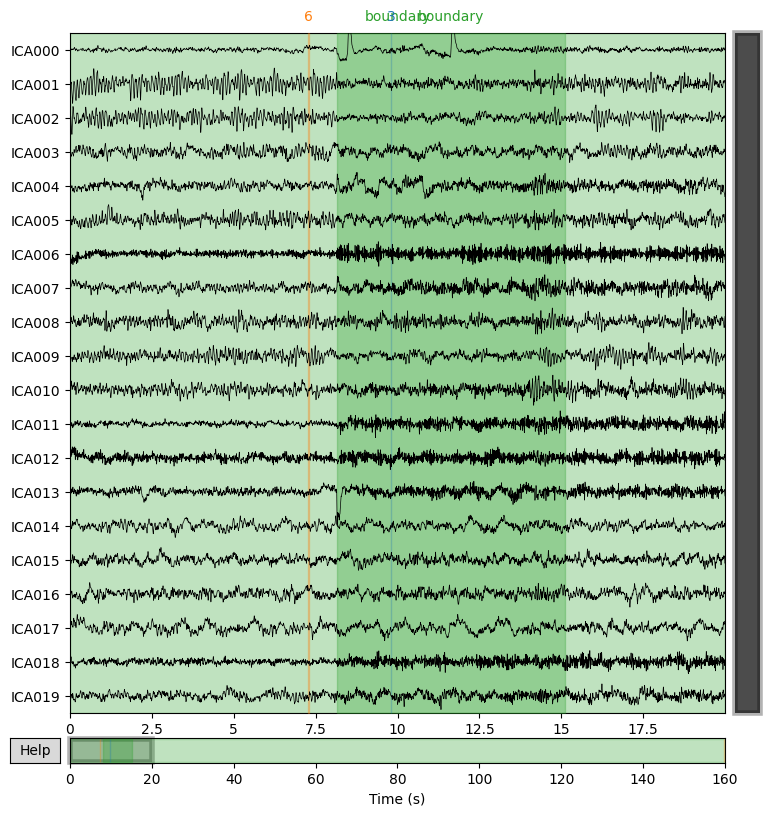


Components marked as bad: []


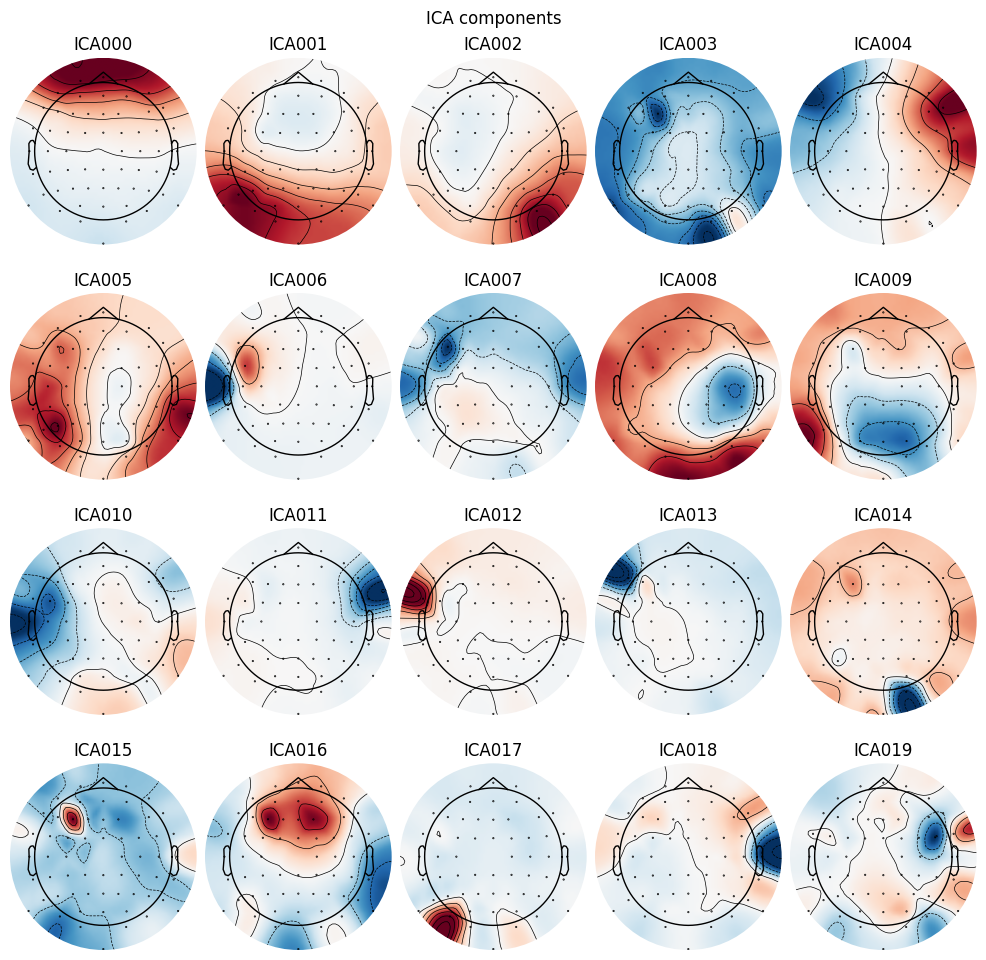

Applying ICA to Raw instance
    Transforming to ICA space (20 components)
    Zeroing out 0 ICA components
    Projecting back using 60 PCA components

Artifact removal complete. Showing 'before' and 'after' plots.


In [ ]:
# @title
import mne
import numpy as np
import matplotlib.pyplot as plt
import warnings

# Suppress common MNE warnings
warnings.filterwarnings("ignore", message="Limited 1 annotation(s) that were expanding outside the data range.")
warnings.filterwarnings("ignore", message="The data contains 'boundary' events, indicating data discontinuities.")

try:
    # --- Step 1: Load and High-Pass Filter the Data ---

    # Load the raw data (preload=True is needed for filtering and ICA)
    raw = mne.io.read_raw_eeglab("/content/drive/MyDrive/Design_Project/clean_data/11Abby_Resting_cleaned.set", preload=True)

    # ICA works much better on high-pass filtered data (e.g., above 1 Hz)
    # This removes slow drifts that can confuse the algorithm.
    # We make a copy so we don't change our original 'raw' object yet.
    raw_filtered = raw.copy().filter(l_freq=1.0, h_freq=40.0)

    # --- Step 2: Set up and "Fit" the ICA Model ---

    # Initialize the ICA object
    # n_components: How many independent "sources" to look for.
    #               A good rule of thumb is 15-20.
    # random_state: A number to ensure you get the same result every time you run it.
    ica = mne.preprocessing.ICA(n_components=20, random_state=97)

    # "Fit" the model. This is where MNE does the heavy math
    # to "un-mix" the signals.
    print("Fitting ICA... this may take a moment.")
    ica.fit(raw_filtered)

    # --- Step 3: Find the Bad Components (VISUAL INSPECTION) ---

    print("\nICA is fit. Now, let's find the artifacts.")

    # Plot the time series of all 20 components.
    # This will open an INTERACTIVE PLOT window.
    #
    # WHAT TO DO IN THE PLOT:
    # 1. Look for components that match artifacts:
    #    - EYE BLINKS: Look like big, spiky, repeating "jumps."
    #    - HEARTBEATS (ECG): Look like a regular "blip...blip...blip..."
    # 2. CLICK the component's name (e.g., "ICA001") on the left side of the plot.
    # 3. This marks it as "bad." The name will turn RED.
    # 4. You can click multiple components.
    # 5. When you are done, CLOSE the plot window.

    ica.plot_sources(raw_filtered, title="Click on artifact components to mark them as bad")

    # MNE automatically stores your clicks in 'ica.exclude'
    print(f"\nComponents marked as bad: {ica.exclude}")

    # (Optional but helpful)
    # Plot the "scalp maps" (topography) of the components.
    # - BLINKS will be a strong red spot right at the front (over the eyes).
    # - HEARTBEATS often look like a red/blue spot on opposite sides.
    # This helps confirm your choices from plot_sources().
    ica.plot_components()


    # --- Step 4: Apply the ICA and Remove Artifacts ---

    # We create a new, clean version of the *original* raw data.
    # It's important to apply this to the *unfiltered* 'raw' object
    # if you want to keep your low-frequency data.
    raw_clean = raw.copy()

    # This is the magic step. MNE subtracts the components
    # you marked as "bad" (those in ica.exclude) from the data.
    ica.apply(raw_clean)


    # --- Step 5: Compare the Results ---

    print("\nArtifact removal complete. Showing 'before' and 'after' plots.")

    # Plot the original data (you will see blinks)
    #raw.plot(title="Original Data (Before ICA)", n_channels=20, duration=10)

    # Plot the cleaned data (blinks should be gone or much smaller)
   # raw_clean.plot(title="Cleaned Data (After ICA)", n_channels=20, duration=10)


except FileNotFoundError:
    print("Error: The file '1Abby_Resting.set' (or its .fdt) was not found.")
except Exception as e:
    print(f"An error occurred: {e}")

Reading /content/drive/MyDrive/Design_Project/cleaned_output_data/11Abby_Resting_cleanedICACLEAN_subject.fdt
Reading 0 ... 81920  =      0.000 ...   160.000 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 1691 samples (3.303 s)

Fitting ICA... this may take a moment.
Fitting ICA to data using 60 channels (please be patient, this may take a while)
Selecting by number: 20 components
Fitting ICA took 22.6s.

ICA is fit. Now, let's find the artifacts.
Creating RawArray with float64 data, n_channels=20

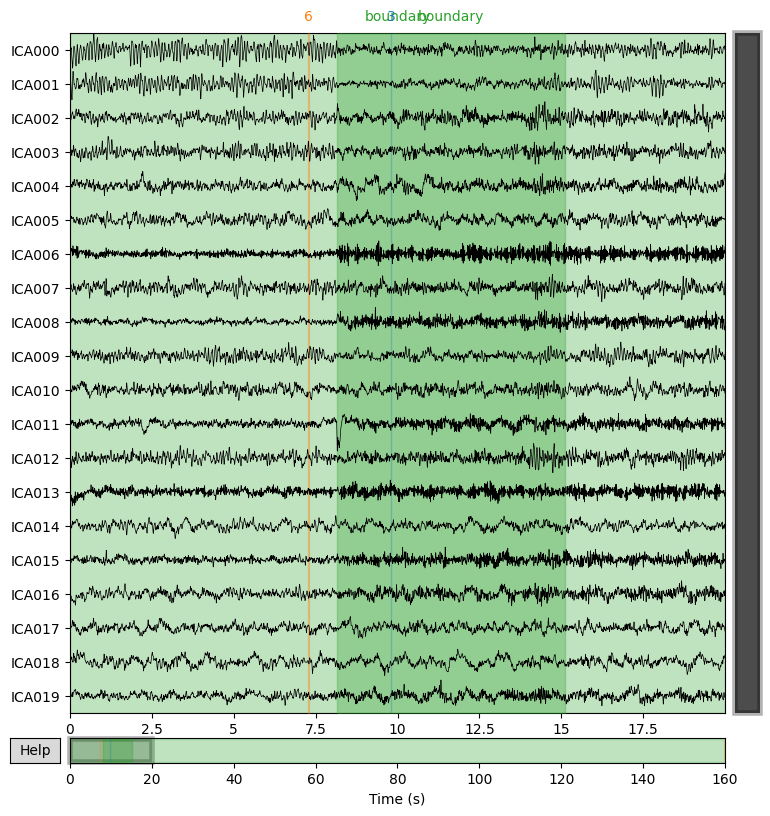


Components marked as bad: []


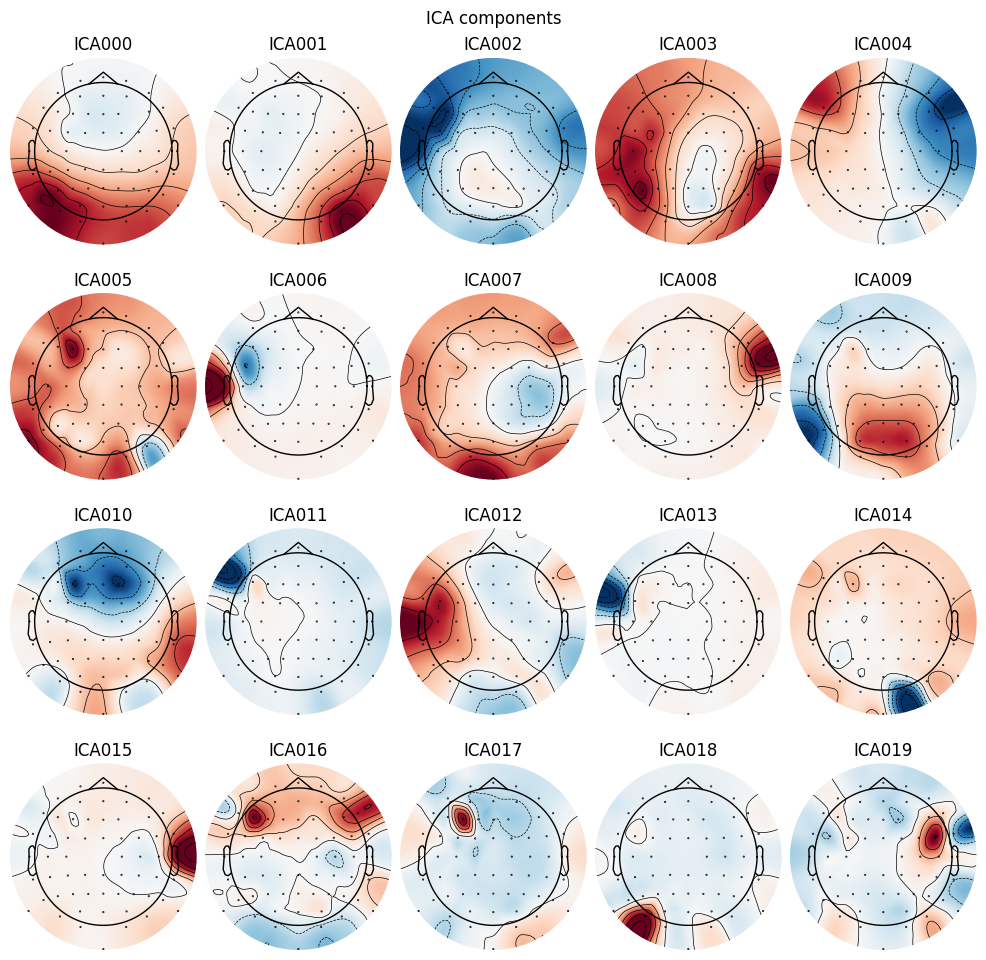

Applying ICA to Raw instance
    Transforming to ICA space (20 components)
    Zeroing out 0 ICA components
    Projecting back using 60 PCA components

Artifact removal complete. Showing 'before' and 'after' plots.


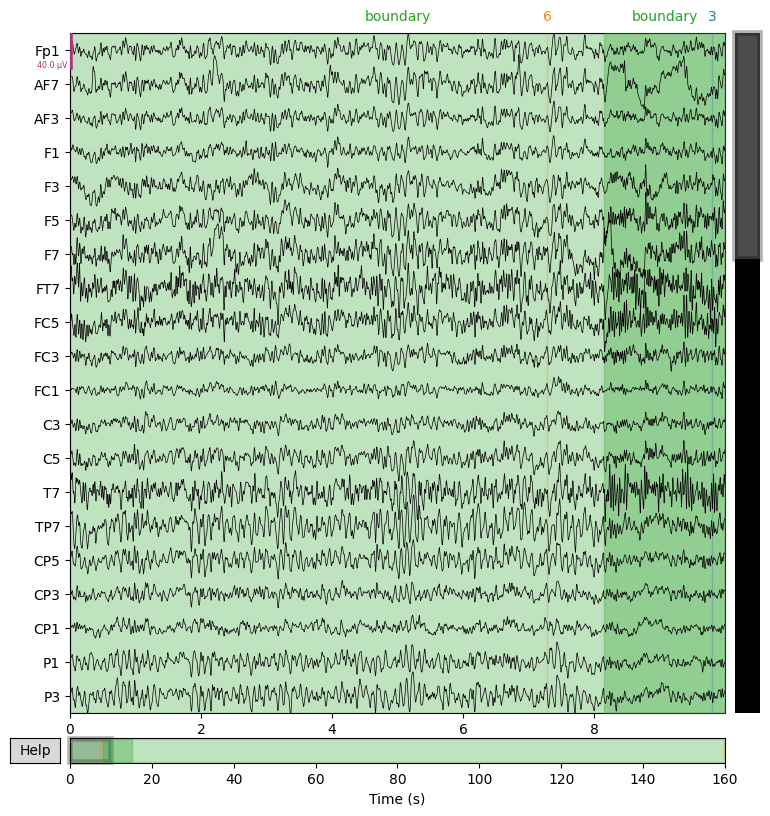

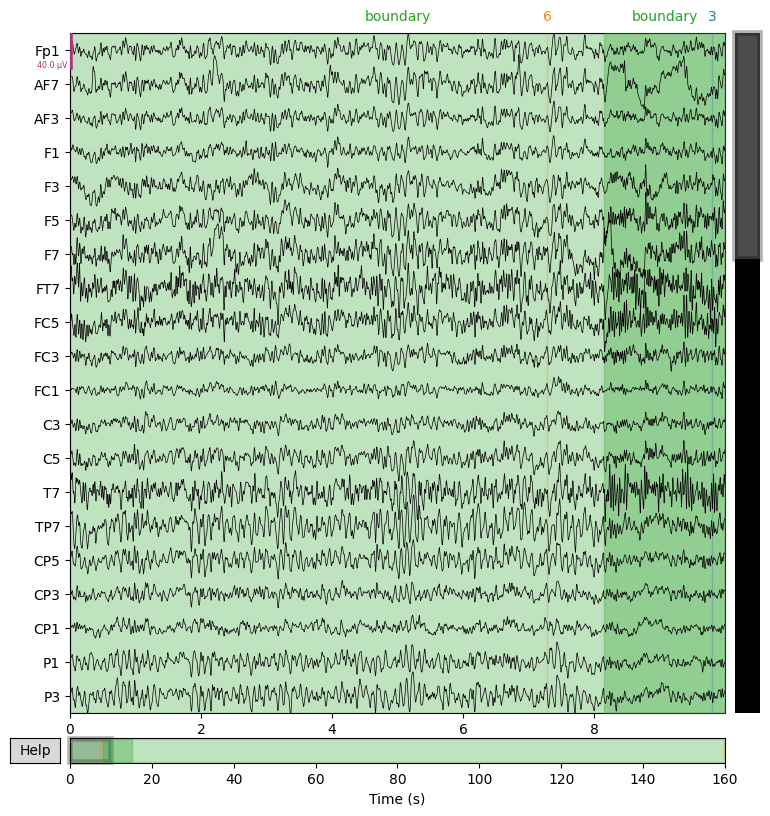

In [ ]:
# @title
import mne
import numpy as np
import matplotlib.pyplot as plt
import warnings

warnings.filterwarnings("ignore", message="Limited 1 annotation(s) that were expanding outside the data range.")
warnings.filterwarnings("ignore", message="The data contains 'boundary' events, indicating data discontinuities.")

try:
    raw = mne.io.read_raw_eeglab("/content/drive/MyDrive/Design_Project/cleaned_output_data/11Abby_Resting_cleanedICACLEAN_subject.set", preload=True)


    raw_filtered = raw.copy().filter(l_freq=1.0, h_freq=40.0)
    ica = mne.preprocessing.ICA(n_components=20, random_state=97)

    print("Fitting ICA... this may take a moment.")
    ica.fit(raw_filtered)

    print("\nICA is fit. Now, let's find the artifacts.")

    ica.plot_sources(raw_filtered, title="Click on artifact components to mark them as bad")
    print(f"\nComponents marked as bad: {ica.exclude}")

    ica.plot_components()

    raw_clean = raw.copy()

    ica.apply(raw_clean)
    print("\nArtifact removal complete. Showing 'before' and 'after' plots.")
    raw.plot(title="Original Data (Before ICA)", n_channels=20, duration=10)

    raw_clean.plot(title="Cleaned Data (After ICA)", n_channels=20, duration=10)


except FileNotFoundError:
    print("Error: The file '1Abby_Resting.set' (or its .fdt) was not found.")
except Exception as e:
    print(f"An error occurred: {e}")

# **REAL-WORK**

In [ ]:
import mne
import os

# Path to raw dataset folder
data_path = "/content/drive/MyDrive/Design_Project/dataset"

# Path for saving cleaned data
save_path = "" #remomved path to prevent misclick and duplicate this shit ass things

# Create output directory if missing
os.makedirs(save_path, exist_ok=True)

# Loop over all .set files (each has a .fdt partner automatically)
for file in os.listdir(data_path):
    if file.endswith(".set"):
        full_path = os.path.join(data_path, file)
        print("Processing:", file)

        # Load EEG in EEGLAB format
        raw = mne.io.read_raw_eeglab(full_path, preload=True)

        # 1) Band-pass (0.1–60 Hz)
        raw.filter(l_freq=0.1, h_freq=60)

        # 2) Notch filter @ 60 Hz
        raw.notch_filter(freqs=60)

        # Save cleaned EEG
        out_file = os.path.join(save_path, file.replace(".set", "_cleaned.set"))
        mne.export.export_raw(out_file, raw, fmt="eeglab")

        print("Saved:", out_file)

print("\n✅ Finished cleaning all patients!")


**Segmentation and DWT hope**

In [ ]:
raw_clean = mne.io.read_raw_eeglab(
    "/content/drive/MyDrive/Design_Project/cleaned_output_data/10Abby_Resting_cleanedICACLEAN_subject.set",
    preload=True
)


Reading /content/drive/MyDrive/Design_Project/cleaned_output_data/10Abby_Resting_cleanedICACLEAN_subject.fdt
Reading 0 ... 81920  =      0.000 ...   160.000 secs...


/tmp/ipython-input-4221562662.py:1: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw_clean = mne.io.read_raw_eeglab(


In [ ]:
# @title
import numpy as np
import pandas as pd
import pywt
from scipy.stats import entropy as shannon_entropy
import warnings
import mne
import glob
import os

# ========= CONFIGURATION =========

input_folder = "/content/drive/MyDrive/Design_Project/cleaned_output_data"
output_folder = "/content/drive/MyDrive/Design_Project/Seg_DWT_data2"

SEGMENT_DURATION_SEC = 20.0
OVERLAP_DURATION_SEC = 14.0

wavelet = 'db4'
dwt_level = 4
band_names = ['Delta_Theta', 'Alpha', 'Beta', 'Gamma_1', 'Gamma_2']

# =================================

def calculate_shannon_entropy(data, n_bins=10):
    counts, _ = np.histogram(data, bins=n_bins)
    probabilities = counts / len(data)
    probabilities = probabilities[probabilities > 0]
    return shannon_entropy(probabilities, base=2)

def calculate_energy(data):
    return np.sum(np.square(data))

warnings.filterwarnings("ignore")

# --- IMPROVEMENT 1: Create the output folder if it doesn't exist ---
os.makedirs(output_folder, exist_ok=True)
# -----------------------------------------------------------------

# Get list of *.set files
files = sorted(glob.glob(os.path.join(input_folder, "*.set")))
print(f"Found {len(files)} EEG files to process.")

# Loop through every file
for file_path in files:

    # --- IMPROVEMENT 2: Add error handling for each file ---
    try:
        print(f"\n===============================")
        print(f"Processing: {os.path.basename(file_path)}")
        print(f"===============================")

        # Load EEG
        raw_clean = mne.io.read_raw_eeglab(file_path, preload=True)
        ch_names = raw_clean.info['ch_names']

        # Downsample
        raw_clean.resample(256)

        # Segment
        epochs = mne.make_fixed_length_epochs(
            raw_clean,
            duration=SEGMENT_DURATION_SEC,
            overlap=OVERLAP_DURATION_SEC,
            preload=True
        )

        all_rows = []

        for i, segment_data in enumerate(epochs):
            row_features = {}
            for ch_index, ch_name in enumerate(ch_names):
                ch_data = segment_data[ch_index]
                coeffs = pywt.wavedec(ch_data, wavelet, level=dwt_level)

                for band_index, band_name in enumerate(band_names):
                    band_coeffs = coeffs[band_index]
                    row_features[f"{ch_name}_{band_name}_Entropy"] = calculate_shannon_entropy(band_coeffs)
                    row_features[f"{ch_name}_{band_name}_Energy"] = calculate_energy(band_coeffs)

            all_rows.append(row_features)
            print(f"  Segment {i+1}/{len(epochs)} done")

        # Create DataFrame
        df = pd.DataFrame(all_rows)

        # Output filename uses subject name automatically
        subject_name = os.path.basename(file_path).replace(".set", "")
        output_file = os.path.join(output_folder, f"{subject_name}_features.csv")

        df.to_csv(output_file, index=False)
        print(f"\nSaved → {output_file}")
        print(f"Shape: {df.shape}")

    except Exception as e:
        print(f"\n--- ❗ ERROR ❗ ---")
        print(f"Could not process file: {os.path.basename(file_path)}")
        print(f"Error message: {e}")
        print(f"Skipping to next file.")
        print(f"-------------------\n")
    # ----------------------------------------------------

print("\nALL FILES DONE ✅")

Found 56 EEG files to process.

Processing: 10Abby_Resting_cleanedICACLEAN_subject.set
Reading /content/drive/MyDrive/Design_Project/cleaned_output_data/10Abby_Resting_cleanedICACLEAN_subject.fdt
Reading 0 ... 81920  =      0.000 ...   160.000 secs...
Not setting metadata
31 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 31 events and 2560 original time points ...
0 bad epochs dropped
  Segment 1/31 done
  Segment 2/31 done
  Segment 3/31 done
  Segment 4/31 done
  Segment 5/31 done
  Segment 6/31 done
  Segment 7/31 done
  Segment 8/31 done
  Segment 9/31 done
  Segment 10/31 done
  Segment 11/31 done
  Segment 12/31 done
  Segment 13/31 done
  Segment 14/31 done
  Segment 15/31 done
  Segment 16/31 done
  Segment 17/31 done
  Segment 18/31 done
  Segment 19/31 done
  Segment 20/31 done
  Segment 21/31 done
  Segment 22/31 done
  Segment 23/31 done
  Segment 24/31 done
  Segment 25/31 done
  Segment 26/31 done
  Segm

**New try** **Main segmentation and DWT thing**

In [ ]:
# @title
import numpy as np
import pandas as pd
import pywt
from scipy.stats import entropy as shannon_entropy
import warnings
import mne
import glob
import os

# ========= CONFIGURATION =========

input_folder = "/content/drive/MyDrive/Design_Project/cleaned_output_data"
output_folder = "/content/drive/MyDrive/Design_Project/Seg_DWT_data2"

SEGMENT_DURATION_SEC = 5
OVERLAP_DURATION_SEC = 3

wavelet = 'db4'
dwt_level = 4
band_names = ['Delta_Theta', 'Alpha', 'Beta', 'Gamma_1', 'Gamma_2']

# =================================

def calculate_shannon_entropy(data, n_bins=10):
    counts, _ = np.histogram(data, bins=n_bins)
    probabilities = counts / len(data)
    probabilities = probabilities[probabilities > 0]
    return shannon_entropy(probabilities, base=2)

# --- REMOVED calculate_energy function ---

warnings.filterwarnings("ignore")

# --- IMPROVEMENT 1: Create the output folder if it doesn't exist ---
os.makedirs(output_folder, exist_ok=True)
# -----------------------------------------------------------------

# Get list of *.set files
files = sorted(glob.glob(os.path.join(input_folder, "*.set")))
print(f"Found {len(files)} EEG files to process.")

# Loop through every file
for file_path in files:

    # --- IMPROVEMENT 2: Add error handling for each file ---
    try:
        print(f"\n===============================")
        print(f"Processing: {os.path.basename(file_path)}")
        print(f"===============================")

        # Load EEG
        raw_clean = mne.io.read_raw_eeglab(file_path, preload=True)
        ch_names = raw_clean.info['ch_names']

        # Downsample
        raw_clean.resample(256)

        # Segment
        epochs = mne.make_fixed_length_epochs(
            raw_clean,
            duration=SEGMENT_DURATION_SEC,
            overlap=OVERLAP_DURATION_SEC,
            preload=True
        )

        all_rows = []

        for i, segment_data in enumerate(epochs):
            row_features = {}
            for ch_index, ch_name in enumerate(ch_names):
                ch_data = segment_data[ch_index]
                coeffs = pywt.wavedec(ch_data, wavelet, level=dwt_level)

                for band_index, band_name in enumerate(band_names):
                    band_coeffs = coeffs[band_index]
                    # --- MODIFIED: Only calculate and save Entropy ---
                    row_features[f"{ch_name}_{band_name}_Entropy"] = calculate_shannon_entropy(band_coeffs)
                    # --- REMOVED Energy calculation line ---

            all_rows.append(row_features)
            print(f"  Segment {i+1}/{len(epochs)} done")

        # Create DataFrame
        df = pd.DataFrame(all_rows)

        # Output filename uses subject name automatically
        subject_name = os.path.basename(file_path).replace(".set", "")
        output_file = os.path.join(output_folder, f"{subject_name}_features.csv")

        df.to_csv(output_file, index=False)
        print(f"\nSaved → {output_file}")
        print(f"Shape: {df.shape}")

    except Exception as e:
        print(f"\n--- ❗ ERROR ❗ ---")
        print(f"Could not process file: {os.path.basename(file_path)}")
        print(f"Error message: {e}")
        print(f"Skipping to next file.")
        print(f"-------------------\n")
    # ----------------------------------------------------

print("\nALL FILES DONE ✅")


Found 56 EEG files to process.

Processing: 10Abby_Resting_cleanedICACLEAN_subject.set
Reading /content/drive/MyDrive/Design_Project/cleaned_output_data/10Abby_Resting_cleanedICACLEAN_subject.fdt
Reading 0 ... 81920  =      0.000 ...   160.000 secs...
Not setting metadata
47 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 47 events and 5120 original time points ...
0 bad epochs dropped
  Segment 1/47 done
  Segment 2/47 done
  Segment 3/47 done
  Segment 4/47 done
  Segment 5/47 done
  Segment 6/47 done
  Segment 7/47 done
  Segment 8/47 done
  Segment 9/47 done
  Segment 10/47 done
  Segment 11/47 done
  Segment 12/47 done
  Segment 13/47 done
  Segment 14/47 done
  Segment 15/47 done
  Segment 16/47 done
  Segment 17/47 done
  Segment 18/47 done
  Segment 19/47 done
  Segment 20/47 done
  Segment 21/47 done
  Segment 22/47 done
  Segment 23/47 done
  Segment 24/47 done
  Segment 25/47 done
  Segment 26/47 done
  Segm

In [ ]:
# WHole EEG data

In [ ]:
# @title
import numpy as np
import pandas as pd
import pywt
from scipy.stats import entropy as shannon_entropy
import warnings
import mne
import glob
import os

# ========= CONFIGURATION =========

input_folder = "/content/drive/MyDrive/Design_Project/cleaned_output_data"
output_folder = "/content/drive/MyDrive/Design_Project/Whole_eeg"

wavelet = 'db4'
dwt_level = 4
band_names = ['Delta_Theta', 'Alpha', 'Beta', 'Gamma_1', 'Gamma_2']

# =================================

def calculate_shannon_entropy(data, n_bins=10):
    counts, _ = np.histogram(data, bins=n_bins)
    probabilities = counts / len(data)
    probabilities = probabilities[probabilities > 0]
    return shannon_entropy(probabilities, base=2)

warnings.filterwarnings("ignore")

# --- Create output folder ---
os.makedirs(output_folder, exist_ok=True)

# List of .set files
files = sorted(glob.glob(os.path.join(input_folder, "*.set")))
print(f"Found {len(files)} EEG files to process.")

for file_path in files:

    try:
        print("\n===============================")
        print(f"Processing: {os.path.basename(file_path)}")
        print("===============================")

        # Load EEG
        raw_clean = mne.io.read_raw_eeglab(file_path, preload=True)
        ch_names = raw_clean.info['ch_names']

        # Downsample
        raw_clean.resample(256)

        # Get entire EEG signal
        eeg_data = raw_clean.get_data()

        row_features = {}

        # Feature extraction
        for ch_index, ch_name in enumerate(ch_names):
            ch_data = eeg_data[ch_index]
            coeffs = pywt.wavedec(ch_data, wavelet, level=dwt_level)

            for band_index, band_name in enumerate(band_names):
                band_coeffs = coeffs[band_index]
                row_features[f"{ch_name}_{band_name}_Entropy"] = calculate_shannon_entropy(band_coeffs)

        # Subject name
        subject_name = os.path.basename(file_path).replace(".set", "")

        # Convert to DataFrame (1 row)
        df = pd.DataFrame([row_features])

        # Output CSV path
        output_file = os.path.join(output_folder, f"{subject_name}_whole.csv")

        # Save
        df.to_csv(output_file, index=False)

        print(f"✔ Saved: {output_file}")
        print("Shape:", df.shape)

    except Exception as e:
        print("\n--- ❗ ERROR ❗ ---")
        print(f"Could not process: {os.path.basename(file_path)}")
        print(f"MSG: {e}")
        print("-------------------\n")

print("\n✅ All patients processed.")


Found 56 EEG files to process.

Processing: 10Abby_Resting_cleanedICACLEAN_subject.set
Reading /content/drive/MyDrive/Design_Project/cleaned_output_data/10Abby_Resting_cleanedICACLEAN_subject.fdt
Reading 0 ... 81920  =      0.000 ...   160.000 secs...
✔ Saved: /content/drive/MyDrive/Design_Project/Whole_eeg/10Abby_Resting_cleanedICACLEAN_subject_whole.csv
Shape: (1, 295)

Processing: 11Abby_Resting_cleanedICACLEAN_subject.set
Reading /content/drive/MyDrive/Design_Project/cleaned_output_data/11Abby_Resting_cleanedICACLEAN_subject.fdt
Reading 0 ... 81920  =      0.000 ...   160.000 secs...
✔ Saved: /content/drive/MyDrive/Design_Project/Whole_eeg/11Abby_Resting_cleanedICACLEAN_subject_whole.csv
Shape: (1, 300)

Processing: 12Abby_Resting_cleanedICACLEAN_subject.set
Reading /content/drive/MyDrive/Design_Project/cleaned_output_data/12Abby_Resting_cleanedICACLEAN_subject.fdt
Reading 0 ... 81920  =      0.000 ...   160.000 secs...
✔ Saved: /content/drive/MyDrive/Design_Project/Whole_eeg/12Abb

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


**To Label**

In [ ]:
# @title
import pandas as pd
import re
import glob
import os
import warnings

# --- CONFIGURATION ---

# 1. Folder with your 56 feature files (CSVs)
input_folder = "/content/drive/MyDrive/Design_Project/Seg_DWT_data2"

# 2. Your single metadata file
metadata_file = "/content/drive/MyDrive/Design_Project/metadata.csv"

# 3. Folder where the new, labeled files will be saved
output_folder = "/content/drive/MyDrive/Design_Project/Final_label2"

# 4. Metadata columns you want to add.
#    *** IMPORTANT: Check that these names exactly match your metadata.csv! ***
METADATA_COLS = ['AgeMonths', 'Group', 'Gender', 'SRS_Total']
# (You can add or remove items from this list, e.g., 'SRS_Score')

# =================================================================

def label_all_files():
    """
    Loops through all feature CSVs, matches them with metadata,
    and saves new, labeled CSVs to the output folder.
    """

    warnings.filterwarnings("ignore")

    # --- 1. SETUP ---
    # Create the output folder if it doesn't exist
    os.makedirs(output_folder, exist_ok=True)
    print(f"Output folder is ready at: {output_folder}")

    # --- 2. LOAD METADATA ONCE ---
    try:
        meta = pd.read_csv(metadata_file)
        # Ensure 'ParticipantID' is an integer for matching
        meta['ParticipantID'] = meta['ParticipantID'].astype(int)
        print(f"Successfully loaded metadata for {len(meta)} participants.")
    except FileNotFoundError:
        print(f"❌ ERROR: Metadata file not found at: {metadata_file}")
        print("Please check the path and filename.")
        return
    except KeyError:
        print(f"❌ ERROR: 'ParticipantID' column not found in {metadata_file}.")
        print("Please check your column names.")
        return

    # --- 3. GET LIST OF FEATURE FILES ---
    feature_files = sorted(glob.glob(os.path.join(input_folder, "*.csv")))
    if not feature_files:
        print(f"❌ ERROR: No .csv files found in: {input_folder}")
        return

    print(f"Found {len(feature_files)} feature files to label.")

    success_count = 0
    fail_count = 0

    # --- 4. LOOP AND PROCESS EACH FILE ---
    for file_path in feature_files:
        base_name = os.path.basename(file_path)
        print(f"\n--- Processing: {base_name} ---")

        try:
            # --- A. Extract Patient ID from filename ---
            # This regex looks for the number(s) at the very start of the filename
            match = re.match(r"(\d+)", base_name)

            if not match:
                print(f"  SKIPPING: Cannot extract patient ID from filename: {base_name}")
                fail_count += 1
                continue

            patient_id = int(match.group(1))

            # --- B. Load Feature Data ---
            df = pd.read_csv(file_path)

            # --- C. Find Metadata Row ---
            row = meta[meta['ParticipantID'] == patient_id]

            if row.empty:
                print(f"  SKIPPING: No metadata found in {metadata_file} for ID: {patient_id}")
                fail_count += 1
                continue

            # This is the single row of metadata for this patient
            patient_metadata = row.iloc[0]

            # --- D. Add All Metadata Columns ---
            print(f"  Found metadata for ID {patient_id}. Adding columns...")
            for col in METADATA_COLS:
                if col in patient_metadata:
                    # Add the value (e.g., 78) to every single segment (row)
                    df[col] = patient_metadata[col]
                    print(f"    + Added column: {col} (Value: {patient_metadata[col]})")
                else:
                    print(f"  WARNING: Metadata column '{col}' not found. Skipping this column.")

            # --- E. Save to New Location ---
            # Create the new filename, e.g., "10Abby..._features_LABELED.csv"
            new_base_name = base_name.replace(".csv", "_LABELED.csv")
            output_path = os.path.join(output_folder, new_base_name)

            df.to_csv(output_path, index=False)
            print(f"  ✅ Saved labeled file!")
            success_count += 1

        except Exception as e:
            print(f"  ❌ UNEXPECTED ERROR processing file {base_name}: {e}")
            fail_count += 1

    print("\n--- All Done! ---")
    print(f"Successfully labeled: {success_count} files.")
    print(f"Failed or skipped:    {fail_count} files.")
    print(f"Check your output folder: {output_folder}")

# --- Run the main function ---
if __name__ == "__main__":
    label_all_files()


Output folder is ready at: /content/drive/MyDrive/Design_Project/Final_label2
Successfully loaded metadata for 56 participants.
Found 56 feature files to label.

--- Processing: 10Abby_Resting_cleanedICACLEAN_subject_features.csv ---
  Found metadata for ID 10. Adding columns...
    + Added column: AgeMonths (Value: 649)
    + Added column: Group (Value: asd)
  ✅ Saved labeled file!

--- Processing: 11Abby_Resting_cleanedICACLEAN_subject_features.csv ---
  Found metadata for ID 11. Adding columns...
    + Added column: AgeMonths (Value: 630)
    + Added column: Group (Value: asd)
  ✅ Saved labeled file!

--- Processing: 12Abby_Resting_cleanedICACLEAN_subject_features.csv ---
  Found metadata for ID 12. Adding columns...
    + Added column: AgeMonths (Value: 400)
    + Added column: Group (Value: asd)
  ✅ Saved labeled file!

--- Processing: 13Abby_Resting_cleanedICACLEAN_subject_features.csv ---
  Found metadata for ID 13. Adding columns...
    + Added column: AgeMonths (Value: 707)
  

**To label whole**

In [ ]:
# @title
import pandas as pd
import re
import glob
import os
import warnings

# --- CONFIGURATION ---

input_folder = "/content/drive/MyDrive/Design_Project/Whole_eeg"
metadata_file = "/content/drive/MyDrive/Design_Project/metadata.csv"
output_folder = "/content/drive/MyDrive/Design_Project/Whole_eeg/Whole_label"

# Metadata columns to add
METADATA_COLS = ['AgeMonths', 'Group', 'Gender', 'SRS_Total']

# =================================================================

def label_whole_eeg_files():
    warnings.filterwarnings("ignore")

    # Create output folder
    os.makedirs(output_folder, exist_ok=True)
    print(f"Output folder is ready at: {output_folder}")

    # Load metadata
    try:
        meta = pd.read_csv(metadata_file)
        meta['ParticipantID'] = meta['ParticipantID'].astype(int)
        print(f"Successfully loaded metadata for {len(meta)} participants.")
    except Exception as e:
        print(f"❌ ERROR loading metadata: {e}")
        return

    # Get list of whole-EEG CSV files
    eeg_files = sorted(glob.glob(os.path.join(input_folder, "*.csv")))
    if not eeg_files:
        print(f"❌ ERROR: No CSV files found in {input_folder}")
        return
    print(f"Found {len(eeg_files)} whole-EEG CSV files.")

    success_count = 0
    fail_count = 0

    for file_path in eeg_files:
        base_name = os.path.basename(file_path)
        print(f"\n--- Processing: {base_name} ---")

        try:
            # Extract patient ID from filename (assumes numbers at start)
            match = re.match(r"(\d+)", base_name)
            if not match:
                print(f"  SKIPPING: Cannot extract patient ID from filename: {base_name}")
                fail_count += 1
                continue
            patient_id = int(match.group(1))

            # Load CSV
            df = pd.read_csv(file_path)

            # Find metadata
            row = meta[meta['ParticipantID'] == patient_id]
            if row.empty:
                print(f"  SKIPPING: No metadata found for ID: {patient_id}")
                fail_count += 1
                continue

            patient_metadata = row.iloc[0]

            # Add metadata columns
            for col in METADATA_COLS:
                if col in patient_metadata:
                    df[col] = patient_metadata[col]
                    print(f"    + Added column: {col} (Value: {patient_metadata[col]})")
                else:
                    print(f"  WARNING: Metadata column '{col}' not found. Skipping.")

            # Save labeled CSV
            new_name = base_name.replace(".csv", "_LABELED.csv")
            output_path = os.path.join(output_folder, new_name)
            df.to_csv(output_path, index=False)
            print(f"  ✅ Saved labeled file: {output_path}")
            success_count += 1

        except Exception as e:
            print(f"  ❌ UNEXPECTED ERROR processing {base_name}: {e}")
            fail_count += 1

    print("\n--- Done Labeling ---")
    print(f"Successfully labeled: {success_count} files.")
    print(f"Failed/skipped:       {fail_count}")
    print(f"Check output folder: {output_folder}")

# Run the labeling function
label_whole_eeg_files()


Output folder is ready at: /content/drive/MyDrive/Design_Project/Whole_eeg/Whole_label
Successfully loaded metadata for 56 participants.
Found 56 whole-EEG CSV files.

--- Processing: 10Abby_Resting_cleanedICACLEAN_subject_whole.csv ---
    + Added column: AgeMonths (Value: 649)
    + Added column: Group (Value: asd)
  ✅ Saved labeled file: /content/drive/MyDrive/Design_Project/Whole_eeg/Whole_label/10Abby_Resting_cleanedICACLEAN_subject_whole_LABELED.csv

--- Processing: 11Abby_Resting_cleanedICACLEAN_subject_whole.csv ---
    + Added column: AgeMonths (Value: 630)
    + Added column: Group (Value: asd)
  ✅ Saved labeled file: /content/drive/MyDrive/Design_Project/Whole_eeg/Whole_label/11Abby_Resting_cleanedICACLEAN_subject_whole_LABELED.csv

--- Processing: 12Abby_Resting_cleanedICACLEAN_subject_whole.csv ---
    + Added column: AgeMonths (Value: 400)
    + Added column: Group (Value: asd)
  ✅ Saved labeled file: /content/drive/MyDrive/Design_Project/Whole_eeg/Whole_label/12Abby_Rest

**Whole eeg without DWT**

In [ ]:
# @title
import numpy as np
import pandas as pd
from scipy.stats import entropy as shannon_entropy
import warnings
import mne
import glob
import os

# ========= CONFIGURATION =========
input_folder = "/content/drive/MyDrive/Design_Project/cleaned_output_data"
output_folder = "/content/drive/MyDrive/Design_Project/Whole_eeg/Whole_without_DWT"
# =================================

def calc_shannon(data, n_bins=20):
    counts, _ = np.histogram(data, bins=n_bins)
    probabilities = counts / len(data)
    probabilities = probabilities[probabilities > 0]
    return shannon_entropy(probabilities, base=2)

warnings.filterwarnings("ignore")

# Create output folder
os.makedirs(output_folder, exist_ok=True)

# Get .set files
files = sorted(glob.glob(os.path.join(input_folder, "*.set")))
print(f"Found {len(files)} EEG files to process.")

for file_path in files:
    try:
        print("\n===============================")
        print(f"Processing: {os.path.basename(file_path)}")
        print("===============================")

        # Load EEG
        raw = mne.io.read_raw_eeglab(file_path, preload=True)
        raw.resample(256)

        ch_names = raw.info['ch_names']
        data = raw.get_data()

        features = {}

        # compute entropy per channel
        for i, ch_name in enumerate(ch_names):
            ch_data = data[i]
            features[f"{ch_name}_Entropy"] = calc_shannon(ch_data)

        # save CSV
        subject_name = os.path.basename(file_path).replace(".set", "")
        df = pd.DataFrame([features])

        out = os.path.join(output_folder, f"{subject_name}_whole_entropy.csv")
        df.to_csv(out, index=False)

        print(f"✔ Saved: {out}")
        print("Shape:", df.shape)

    except Exception as e:
        print("\n--- ❗ ERROR ❗ ---")
        print(f"Could not process: {os.path.basename(file_path)}")
        print(f"MSG: {e}")
        print("-------------------\n")

print("\n✅ All done.")


**To make bins**

In [ ]:
# @title
import pandas as pd
import numpy as np
import re
import glob
import os
import shutil
from sklearn.model_selection import StratifiedKFold
import warnings

# --- CONFIGURATION ---

# 1. Folder with your 56 LABELED feature files (the ones we just made)
labeled_folder = "/content/drive/MyDrive/Design_Project/Final_label2"

# 2. Your single metadata file (we need this to get all labels at once)
metadata_file = "/content/drive/MyDrive/Design_Project/metadata.csv"

# 3. List of your 4 output "Round" folders
#    (This script will create them if they don't exist)
fold_folders = [
    "/content/drive/MyDrive/Design_Project/Final_label2/Round-1",
    "/content/drive/MyDrive/Design_Project/Final_label2/Round-2",
    "/content/drive/MyDrive/Design_Project/Final_label2/Round-3",
    "/content/drive/MyDrive/Design_Project/Final_label2/Round-4"
]
N_SPLITS = 4 # This must match the number of folders

# =================================================================

def create_folds():
    """
    Splits the 56 patients into 4 stratified folds and copies
    their feature files into the correct "Round" folder.
    """

    warnings.filterwarnings("ignore")

    # --- 1. Load Metadata ---
    try:
        meta = pd.read_csv(metadata_file)
        meta['ParticipantID'] = meta['ParticipantID'].astype(int)
    except FileNotFoundError:
        print(f"❌ ERROR: Metadata file not found at: {metadata_file}")
        return
    except KeyError:
        print(f"❌ ERROR: 'ParticipantID' column not found in {metadata_file}.")
        return

    print(f"Loaded metadata for {len(meta)} patients.")

    # --- 2. Create Stratification Bins ---

    # A. Create the Age Bins
    #    We are using the *exact bin edges* from your screenshot!
    #    (pd.cut needs the lowest edge, so we add 216)
    age_bins = [216, 399.75, 498.5, 588.5, 820.0]
    bin_labels = [0, 1, 2, 3] # Names for the 4 bins

    meta['Age_binned'] = pd.cut(
        meta['AgeMonths'],
        bins=age_bins,
        labels=bin_labels,
        right=True,      # (216, 399.75]
        include_lowest=True # Make sure 216 is included
    )

    # B. Create the final stratification key
    #    This combines "Group" and "Age_binned" into one label, e.g., "Autism_2"
    #    This ensures each fold has a mix of *both* age and group.
    meta['stratify_key'] = meta['Group'].astype(str) + "_" + meta['Age_binned'].astype(str)

    print("Created stratification key (Age + Group). Bin counts:")
    print(meta['stratify_key'].value_counts())

    # --- 3. Define the Splitter ---
    # StratifiedKFold will split our 56 patients into 4 folds (n_splits=4)
    # It will use 'stratify_key' to make sure each fold is balanced.
    skf = StratifiedKFold(n_splits=N_SPLITS, shuffle=True, random_state=42) # random_state=42 makes the split reproducible

    # We split the *metadata rows* (which represent patients)
    # 'X' is just the data, 'y' is what we stratify by.
    X = meta
    y = meta['stratify_key']

    # --- 4. Get All Labeled Feature Files ---
    # We look *only* for files ending in _LABELED.csv
    glob_pattern = os.path.join(labeled_folder, "*_LABELED.csv")
    all_labeled_files = glob.glob(glob_pattern)

    if not all_labeled_files:
        print(f"❌ ERROR: No '*_LABELED.csv' files found in {labeled_folder}")
        print(f"Searched using pattern: {glob_pattern}")
        return

    # --- 5. Loop, Split, and Copy Files ---

    print("\nSplitting patients and copying files into folds...")

    # This loop runs 4 times (once for each "Round")
    # 'test_indices' is the list of *row numbers* from the metadata for this fold
    for fold_index, (train_indices, test_indices) in enumerate(skf.split(X, y)):

        output_folder = fold_folders[fold_index]
        os.makedirs(output_folder, exist_ok=True) # Create folder just in case

        print(f"\n--- Creating Fold {fold_index+1} ({os.path.basename(output_folder)}) ---")

        # Get the patient IDs for this fold
        fold_patient_ids = meta.iloc[test_indices]['ParticipantID'].tolist()
        print(f"  Will contain {len(fold_patient_ids)} patients: {fold_patient_ids}")

        # Now, find the CSV file for each patient in this fold
        for patient_id in fold_patient_ids:

            # Find the file that *starts* with this patient's ID
            # e.g., "10_" or "10Abby..." for patient_id 10
            file_found = False
            for file_path in all_labeled_files:
                base_name = os.path.basename(file_path)
                match = re.match(r"(\d+)", base_name)

                if match and int(match.group(1)) == patient_id:
                    # This is the file for our patient. Copy it.
                    source_path = file_path
                    dest_path = os.path.join(output_folder, base_name)

                    shutil.copy(source_path, dest_path)
                    print(f"    Copied: {base_name}")
                    file_found = True
                    break # Stop searching for this patient_id

            if not file_found:
                print(f"  WARNING: No file found for patient ID {patient_id} in {labeled_folder}")

    print("\nALL FILES SORTED INTO FOLDS ✅")

# --- Run the main function ---
if __name__ == "__main__":
    create_folds()


Loaded metadata for 56 patients.
Created stratification key (Age + Group). Bin counts:
stratify_key
asd_3    10
td_1     10
td_0      8
asd_2     8
td_2      6
asd_0     6
asd_1     4
td_3      4
Name: count, dtype: int64

Splitting patients and copying files into folds...

--- Creating Fold 1 (Round-1) ---
  Will contain 14 patients: [1, 3, 4, 11, 12, 16, 22, 30, 32, 42, 49, 51, 53, 56]
    Copied: 1Abby_Resting_cleanedICACLEAN_subject_features_LABELED.csv
    Copied: 3Abby_Resting_cleanedICACLEAN_subject_features_LABELED.csv
    Copied: 4Abby_Resting_cleanedICACLEAN_subject_features_LABELED.csv
    Copied: 11Abby_Resting_cleanedICACLEAN_subject_features_LABELED.csv
    Copied: 12Abby_Resting_cleanedICACLEAN_subject_features_LABELED.csv
    Copied: 16Abby_Resting_cleanedICACLEAN_subject_features_LABELED.csv
    Copied: 22Abby_Resting_cleanedICACLEAN_subject_features_LABELED.csv
    Copied: 30Abby_Resting_cleanedICACLEAN_subject_features_LABELED.csv
    Copied: 32Abby_Resting_cleanedIC

Starting 4-Fold Cross-Validation...

--- FOLD 1 / 4 ---
TESTING on: Round-1
TRAINING on: ['Round-2', 'Round-3', 'Round-4']
Loading data...
Training data shape (segments, features): (1970, 617)
Test data shape (segments, features): (658, 607)
Scaling features...
Training Random Forest model...
Evaluating model...

--- Fold 1 Results ---
Accuracy: 52.89%
Classification Report:
              precision    recall  f1-score   support

          td       0.54      0.43      0.48       329
         asd       0.52      0.63      0.57       329

    accuracy                           0.53       658
   macro avg       0.53      0.53      0.52       658
weighted avg       0.53      0.53      0.52       658



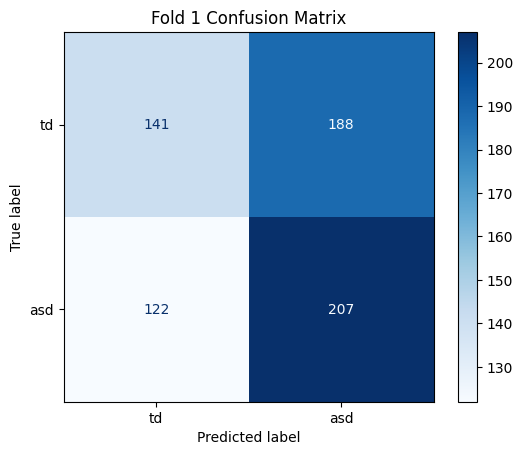


--- FOLD 2 / 4 ---
TESTING on: Round-2
TRAINING on: ['Round-1', 'Round-3', 'Round-4']
Loading data...
Training data shape (segments, features): (1970, 617)
Test data shape (segments, features): (658, 597)
Scaling features...
Training Random Forest model...
Evaluating model...

--- Fold 2 Results ---
Accuracy: 89.36%
Classification Report:
              precision    recall  f1-score   support

          td       0.91      0.87      0.89       329
         asd       0.88      0.91      0.90       329

    accuracy                           0.89       658
   macro avg       0.89      0.89      0.89       658
weighted avg       0.89      0.89      0.89       658



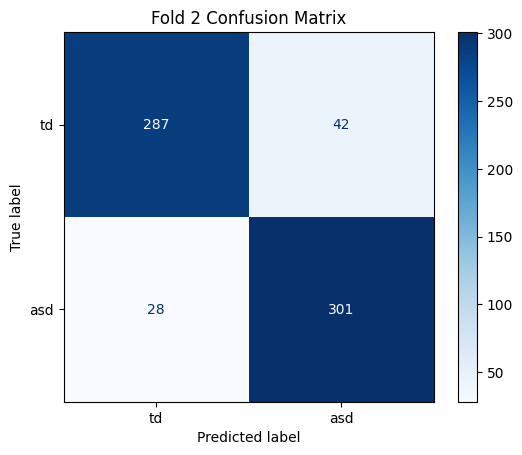


--- FOLD 3 / 4 ---
TESTING on: Round-3
TRAINING on: ['Round-1', 'Round-2', 'Round-4']
Loading data...
Training data shape (segments, features): (1974, 617)
Test data shape (segments, features): (654, 617)
Scaling features...
Training Random Forest model...
Evaluating model...

--- Fold 3 Results ---
Accuracy: 63.00%
Classification Report:
              precision    recall  f1-score   support

          td       0.65      0.57      0.61       329
         asd       0.61      0.69      0.65       325

    accuracy                           0.63       654
   macro avg       0.63      0.63      0.63       654
weighted avg       0.63      0.63      0.63       654



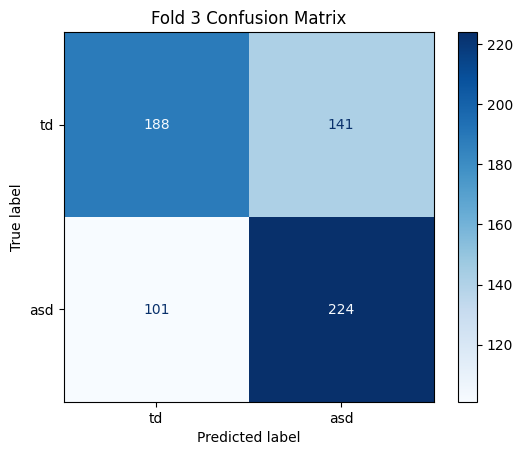


--- FOLD 4 / 4 ---
TESTING on: Round-4
TRAINING on: ['Round-1', 'Round-2', 'Round-3']
Loading data...
Training data shape (segments, features): (1970, 617)
Test data shape (segments, features): (658, 617)
Scaling features...
Training Random Forest model...
Evaluating model...

--- Fold 4 Results ---
Accuracy: 72.34%
Classification Report:
              precision    recall  f1-score   support

          td       0.67      0.87      0.76       329
         asd       0.81      0.58      0.68       329

    accuracy                           0.72       658
   macro avg       0.74      0.72      0.72       658
weighted avg       0.74      0.72      0.72       658



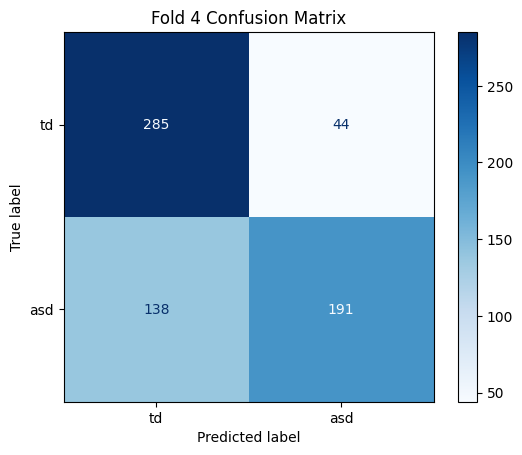


--- Cross-Validation Complete ---
All Fold Accuracies: ['52.89%', '89.36%', '63.00%', '72.34%']

Final Average Accuracy: 69.40% (± 13.42%)

Average Classification Report (across all folds):
              precision  recall  f1-score  support
0                  0.69    0.68      0.68   329.00
1                  0.71    0.70      0.70   328.00
accuracy           0.69    0.69      0.69     0.69
macro avg          0.70    0.69      0.69   657.00
weighted avg       0.70    0.69      0.69   657.00


In [ ]:
# @title
import pandas as pd
import numpy as np
import glob
import os
import matplotlib.pyplot as plt
import warnings

# --- scikit-learn (ML) Imports ---
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import (
    accuracy_score,
    classification_report,
    ConfusionMatrixDisplay
)
from sklearn.impute import SimpleImputer # Handles any potential missing values

# ========= CONFIGURATION =========

# 1. The main folder containing your 4 "Round" subfolders
base_folder = "/content/drive/MyDrive/Design_Project/Final_label2"

# 2. The names of your 4 fold (Round) folders
#    We will loop through these.
fold_folders = [
    os.path.join(base_folder, "Round-1"),
    os.path.join(base_folder, "Round-2"),
    os.path.join(base_folder, "Round-3"),
    os.path.join(base_folder, "Round-4")
]
N_SPLITS = 4 # Must match the number of folders

# 3. The name of your "label" column in the CSVs
TARGET_COLUMN = 'Group'

# 4. How to map your text labels to numbers (1 = Autism, 0 = Control)
#    (Based on your 'asd'/'td' keys, this is our assumption)
LABEL_MAP = {
    'asd': 1,
    'td': 0
}
# =================================

def load_data_from_folders(list_of_folder_paths):
    """
    Loads all '*_LABELED.csv' files from a list of folders
    and stacks them into one big DataFrame.
    """
    all_dfs = []
    for folder_path in list_of_folder_paths:
        # Find all labeled CSV files in this folder
        glob_pattern = os.path.join(folder_path, "*_LABELED.csv")
        csv_files = glob.glob(glob_pattern)

        if not csv_files:
            print(f"Warning: No '_LABELED.csv' files found in {folder_path}")
            continue

        for file_path in csv_files:
            try:
                df = pd.read_csv(file_path)
                all_dfs.append(df)
            except Exception as e:
                print(f"Error loading {file_path}: {e}")

    if not all_dfs:
        return pd.DataFrame() # Return empty df if no files were loaded

    # Stack all the individual DataFrames into one
    return pd.concat(all_dfs, ignore_index=True)

def run_cross_validation():
    """
    Main function to run the 4-fold cross-validation.
    """
    warnings.filterwarnings("ignore")

    # This list will store the final accuracy from each of the 4 runs
    all_fold_accuracies = []
    # --- FIX 1: Change what we store ---
    # We will store the actual y_test and y_pred values, not the report string
    all_fold_predictions = []

    # --- FIX: Corrected typo N_SPIITS -> N_SPLITS and removed duplicate line ---
    print(f"Starting {N_SPLITS}-Fold Cross-Validation...")

    # --- STEP 1: The Main Loop ---
    # This loop runs 4 times, once for each "Round"
    for i in range(N_SPLITS):

        print(f"\n=================================================")
        print(f"--- FOLD {i+1} / {N_SPLITS} ---")

        # --- STEP 2: Assign Train/Test Folders ---

        # The test folder is the current one in the loop (e.g., "Round-1")
        test_folder = [fold_folders[i]]

        # The train folders are *all other* folders
        train_folders = [fold_folders[j] for j in range(N_SPLITS) if j != i]

        print(f"TESTING on: {os.path.basename(test_folder[0])}")
        print(f"TRAINING on: {[os.path.basename(f) for f in train_folders]}")

        # --- STEP 3: Load Data ---
        print("Loading data...")
        train_df = load_data_from_folders(train_folders)
        test_df = load_data_from_folders(test_folder)

        if train_df.empty or test_df.empty:
            print("Error: No data loaded for this fold. Skipping.")
            continue

        print(f"Training data shape (segments, features): {train_df.shape}")
        print(f"Test data shape (segments, features): {test_df.shape}")

        # --- STEP 4: Prepare Data (X and y) ---

        # --- Handle Labels (y) ---
        # 1. Map text labels ('asd'/'td') to numbers (1/0)
        y_train = train_df[TARGET_COLUMN].map(LABEL_MAP)
        y_test = test_df[TARGET_COLUMN].map(LABEL_MAP)

        # 2. Drop the label column from the features
        X_train = train_df.drop(columns=[TARGET_COLUMN])
        X_test = test_df.drop(columns=[TARGET_COLUMN])

        # --- Handle Features (X) ---
        # 3. Convert any text columns (like 'Gender') to numbers
        #    This makes 'Gender_M' (0 or 1) etc.
        X_train = pd.get_dummies(X_train, drop_first=True)
        X_test = pd.get_dummies(X_test, drop_first=True)

        # 4. Align columns: This is a *critical* safety check.
        #    It ensures X_test has the exact same columns in the same order
        #    as X_train. Fills any missing with 0.
        X_train, X_test = X_train.align(X_test, join='left', axis=1, fill_value=0)

        # 5. Handle any potential missing (NaN) values from the align step
        #    We'll just fill them with 0.
        imputer = SimpleImputer(strategy='constant', fill_value=0)
        X_train = imputer.fit_transform(X_train)
        X_test = imputer.transform(X_test)

        # --- STEP 5: Feature Scaling (CRITICAL!) ---
        # This prevents data leakage.
        print("Scaling features...")
        scaler = StandardScaler()

        # 1. FIT the scaler *ONLY* on the training data
        scaler.fit(X_train)

        # 2. TRANSFORM both training and test data
        X_train_scaled = scaler.transform(X_train)
        X_test_scaled = scaler.transform(X_test)

        # --- STEP 6: Train the Model ---
        print("Training Random Forest model...")

        # We use class_weight='balanced' to help with any imbalance
        # between the number of 'asd' and 'td' segments.
        model = RandomForestClassifier(
            n_estimators=100,      # 100 "decision trees"
            random_state=42,       # For reproducible results
            class_weight='balanced'
        )

        model.fit(X_train_scaled, y_train)

        # --- STEP 7: Test (Evaluate) ---
        print("Evaluating model...")
        y_pred = model.predict(X_test_scaled)

        # Calculate metrics
        acc = accuracy_score(y_test, y_pred)
        report_string = classification_report( # Renamed to 'report_string'
            y_test,
            y_pred,
            target_names=[key for key, val in LABEL_MAP.items() if val == 0] +
                         [key for key, val in LABEL_MAP.items() if val == 1]
        )

        all_fold_accuracies.append(acc)
        # --- FIX 2: Store the data, not the string ---
        # Instead of appending the report string, we append the raw data
        all_fold_predictions.append({'y_true': y_test, 'y_pred': y_pred})

        print(f"\n--- Fold {i+1} Results ---")
        print(f"Accuracy: {acc * 100:.2f}%")
        print("Classification Report:")
        print(report_string) # Print the string report for this fold

        # Plot and show the confusion matrix for this fold
        ConfusionMatrixDisplay.from_predictions(
            y_test,
            y_pred,
            display_labels=[key for key, val in LABEL_MAP.items() if val == 0] +
                             [key for key, val in LABEL_MAP.items() if val == 1],
            cmap='Blues'
        )
        plt.title(f"Fold {i+1} Confusion Matrix")
        plt.show()

    # --- STEP 8: Show Final Average Results ---
    print("\n=================================================")
    print("--- Cross-Validation Complete ---")

    mean_accuracy = np.mean(all_fold_accuracies)
    std_accuracy = np.std(all_fold_accuracies)

    print(f"All Fold Accuracies: {[f'{acc*100:.2f}%' for acc in all_fold_accuracies]}")
    print(f"\nFinal Average Accuracy: {mean_accuracy * 100:.2f}% (± {std_accuracy * 100:.2f}%)")

    print("\nAverage Classification Report (across all folds):")
    # A simple way to average the reports
    # --- FIX 3: Use the correct data structure ---
    avg_report_dfs = [
        pd.DataFrame.from_dict(
            classification_report(
                all_fold_predictions[i]['y_true'], # Use the stored y_true
                all_fold_predictions[i]['y_pred'], # Use the stored y_pred
                output_dict=True,
                zero_division=0
            )
        ).transpose()
        for i in range(N_SPLITS)
    ]
    avg_report = pd.concat(avg_report_dfs).groupby(level=0).mean()

    print(avg_report.to_string(float_format="%.2f"))

# --- Run the main training function ---
if __name__ == "__main__":
    run_cross_validation()



Test with Whole..

Starting 4-Fold Cross-Validation...

--- FOLD 1 / 4 ---
TESTING on: Round-1
TRAINING on: ['Round-2', 'Round-3', 'Round-4']
Loading and merging segmented + whole EEG data...
Training data shape (segments, features): (1970, 1232)
Test data shape (segments, features): (658, 1212)
Preparing data for model...
Scaling features...
Training Random Forest model...
Evaluating model...

--- Fold 1 Results ---
Accuracy: 71.43%
Classification Report:
              precision    recall  f1-score   support

          td       1.00      0.43      0.60       329
         asd       0.64      1.00      0.78       329

    accuracy                           0.71       658
   macro avg       0.82      0.71      0.69       658
weighted avg       0.82      0.71      0.69       658



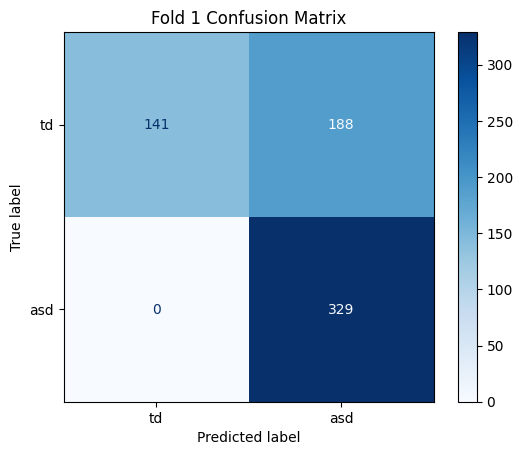


--- FOLD 2 / 4 ---
TESTING on: Round-2
TRAINING on: ['Round-1', 'Round-3', 'Round-4']
Loading and merging segmented + whole EEG data...
Training data shape (segments, features): (1970, 1232)
Test data shape (segments, features): (658, 1192)
Preparing data for model...
Scaling features...
Training Random Forest model...
Evaluating model...

--- Fold 2 Results ---
Accuracy: 78.57%
Classification Report:
              precision    recall  f1-score   support

          td       0.75      0.86      0.80       329
         asd       0.83      0.71      0.77       329

    accuracy                           0.79       658
   macro avg       0.79      0.79      0.78       658
weighted avg       0.79      0.79      0.78       658



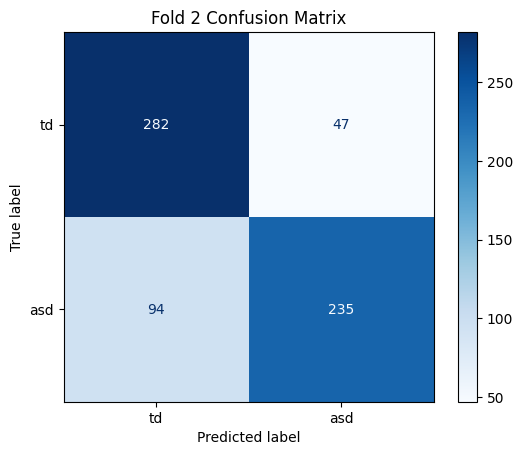


--- FOLD 3 / 4 ---
TESTING on: Round-3
TRAINING on: ['Round-1', 'Round-2', 'Round-4']
Loading and merging segmented + whole EEG data...
Training data shape (segments, features): (1974, 1232)
Test data shape (segments, features): (654, 1232)
Preparing data for model...
Scaling features...
Training Random Forest model...
Evaluating model...

--- Fold 3 Results ---
Accuracy: 64.07%
Classification Report:
              precision    recall  f1-score   support

          td       0.67      0.57      0.62       329
         asd       0.62      0.71      0.66       325

    accuracy                           0.64       654
   macro avg       0.64      0.64      0.64       654
weighted avg       0.64      0.64      0.64       654



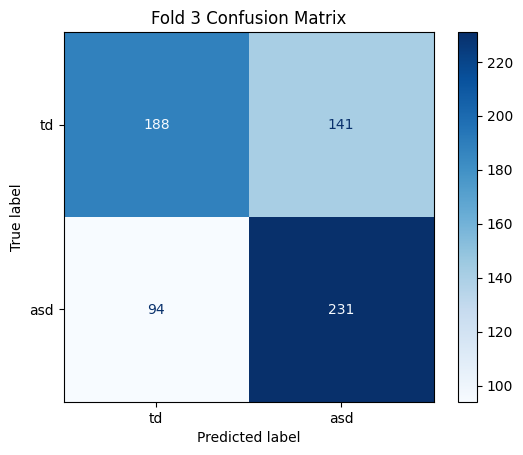


--- FOLD 4 / 4 ---
TESTING on: Round-4
TRAINING on: ['Round-1', 'Round-2', 'Round-3']
Loading and merging segmented + whole EEG data...
Training data shape (segments, features): (1970, 1232)
Test data shape (segments, features): (658, 1232)
Preparing data for model...
Scaling features...
Training Random Forest model...
Evaluating model...

--- Fold 4 Results ---
Accuracy: 64.29%
Classification Report:
              precision    recall  f1-score   support

          td       0.62      0.71      0.67       329
         asd       0.67      0.57      0.62       329

    accuracy                           0.64       658
   macro avg       0.65      0.64      0.64       658
weighted avg       0.65      0.64      0.64       658



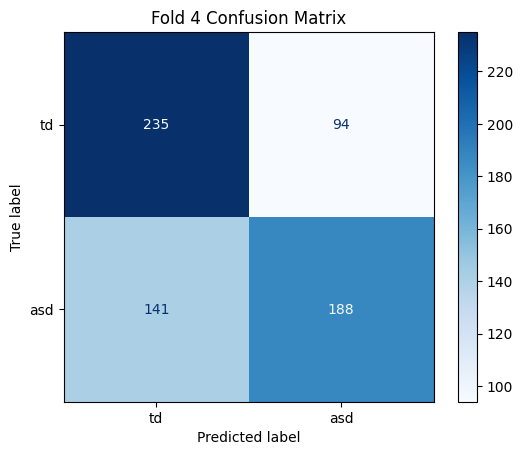


--- Cross-Validation Complete ---
All Fold Accuracies: ['71.43%', '78.57%', '64.07%', '64.29%']

Final Average Accuracy: 69.59% (± 5.97%)

Average Classification Report (across all folds):
              precision  recall  f1-score  support
0                  0.76    0.64      0.67   329.00
1                  0.69    0.75      0.71   328.00
accuracy           0.70    0.70      0.70     0.70
macro avg          0.72    0.70      0.69   657.00
weighted avg       0.72    0.70      0.69   657.00


In [ ]:
# @title
import pandas as pd
import numpy as np
import glob
import os
import matplotlib.pyplot as plt
import warnings

# --- scikit-learn (ML) Imports ---
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import (
    accuracy_score,
    classification_report,
    ConfusionMatrixDisplay
)
from sklearn.impute import SimpleImputer # Handles any potential missing values

# ========= CONFIGURATION =========

# 1. The folder containing your "Round-" folders (SEGMENTED data)
SEGMENT_FOLDER = "/content/drive/MyDrive/Design_Project/Final_label2"

# 2. The folder containing your "1-row-per-patient" files (WHOLE EEG data)
WHOLE_EEG_FOLDER = "/content/drive/MyDrive/Design_Project/Whole_eeg/Whole_label"

# 3. The names of your 4 fold (Round) folders
#    We will loop through these.
fold_folders = [
    os.path.join(SEGMENT_FOLDER, "Round-1"),
    os.path.join(SEGMENT_FOLDER, "Round-2"),
    os.path.join(SEGMENT_FOLDER, "Round-3"),
    os.path.join(SEGMENT_FOLDER, "Round-4")
]
N_SPLITS = 4 # Must match the number of folders

# 4. The name of your "label" column in the CSVs
TARGET_COLUMN = 'Group'

# 5. How to map your text labels to numbers (1 = Autism, 0 = Control)
LABEL_MAP = {
    'asd': 1,
    'td': 0
}
# =================================

def load_data_from_folders(list_of_folder_paths, whole_eeg_folder_path):
    """
    Loads all '*_LABELED.csv' files from a list of folders
    (segmented data) and *merges* them with the matching
    1-row "whole EEG" feature file.
    """
    all_dfs = []
    for folder_path in list_of_folder_paths:
        glob_pattern = os.path.join(folder_path, "*_LABELED.csv")
        csv_files = glob.glob(glob_pattern)

        if not csv_files:
            print(f"Warning: No '_LABELED.csv' files found in {folder_path}")
            continue

        for file_path in csv_files:
            try:
                # 1. Load the segmented data (e.g., 31 rows)
                segment_df = pd.read_csv(file_path)

                # --- NEW MERGE LOGIC ---
                # 2. Find the matching "whole EEG" file
                file_name = os.path.basename(file_path)

                # --- FIX: Replace "_features_" with "_whole_" ---
                # This constructs the correct filename to look for
                if "_features_LABELED.csv" not in file_name:
                    print(f"Warning: Unexpected filename format {file_name}. Skipping file.")
                    continue

                whole_file_name = file_name.replace(
                    "_features_LABELED.csv",
                    "_whole_LABELED.csv"
                )
                # -----------------------------------------------

                whole_eeg_file_path = os.path.join(whole_eeg_folder_path, whole_file_name)

                if not os.path.exists(whole_eeg_file_path):
                    print(f"Warning: No matching 'whole EEG' file found for {file_name}. Skipping file.")
                    continue

                # 3. Load the 1-row "whole EEG" data
                whole_eeg_df = pd.read_csv(whole_eeg_file_path)

                # 4. Identify metadata cols (no '_') and feature cols (with '_')
                #    We only want to add the FEATURES from the whole file.
                whole_feature_cols = [col for col in whole_eeg_df.columns if '_' in col]

                # 5. Create a rename dict to avoid conflicts
                #    e.g., {'Fp1_Alpha_Entropy': 'WHOLE_Fp1_Alpha_Entropy'}
                rename_dict = {col: f"WHOLE_{col}" for col in whole_feature_cols}
                whole_eeg_df = whole_eeg_df.rename(columns=rename_dict)

                # 6. Get the 1 row of renamed "whole" features
                #    We select only the newly renamed columns
                renamed_whole_features = whole_eeg_df.filter(like='WHOLE_')

                if renamed_whole_features.empty:
                    print(f"Warning: No 'whole' features found in {file_name}.")
                    continue

                # Get the first (and only) row of data
                features_to_add = renamed_whole_features.iloc[0]

                # 7. Add these "whole" features to *every segment row*
                #    This copies the "macro" features onto all "micro" snapshots
                for col_name, value in features_to_add.items():
                    segment_df[col_name] = value

                # 8. Add the merged DataFrame to our list
                all_dfs.append(segment_df)

            except Exception as e:
                print(f"Error processing {file_path}: {e}")

    if not all_dfs:
        return pd.DataFrame() # Return empty df if no files were loaded

    # Stack all the individual DataFrames into one
    return pd.concat(all_dfs, ignore_index=True)

def run_cross_validation():
    """
    Main function to run the 4-fold cross-validation.
    """
    warnings.filterwarnings("ignore")

    all_fold_accuracies = []
    all_fold_predictions = []

    print(f"Starting {N_SPLITS}-Fold Cross-Validation...")

    # --- STEP 1: The Main Loop ---
    for i in range(N_SPLITS):
        print(f"\n=================================================")
        print(f"--- FOLD {i+1} / {N_SPLITS} ---")

        # --- STEP 2: Assign Train/Test Folders ---
        test_folder = [fold_folders[i]]
        train_folders = [fold_folders[j] for j in range(N_SPLITS) if j != i]

        print(f"TESTING on: {os.path.basename(test_folder[0])}")
        print(f"TRAINING on: {[os.path.basename(f) for f in train_folders]}")

        # --- STEP 3: Load and Merge Data ---
        print("Loading and merging segmented + whole EEG data...")
        train_df = load_data_from_folders(train_folders, WHOLE_EEG_FOLDER)
        test_df = load_data_from_folders(test_folder, WHOLE_EEG_FOLDER)

        if train_df.empty or test_df.empty:
            print("Error: No data loaded for this fold. Skipping.")
            continue

        print(f"Training data shape (segments, features): {train_df.shape}")
        print(f"Test data shape (segments, features): {test_df.shape}")

        # --- STEP 4: Prepare Data (X and y) ---
        print("Preparing data for model...")

        # --- Handle Labels (y) ---
        y_train = train_df[TARGET_COLUMN].map(LABEL_MAP)
        y_test = test_df[TARGET_COLUMN].map(LABEL_MAP)

        # --- Handle Features (X) ---
        X_train = train_df.drop(columns=[TARGET_COLUMN])
        X_test = test_df.drop(columns=[TARGET_COLUMN])

        X_train = pd.get_dummies(X_train, drop_first=True)
        X_test = pd.get_dummies(X_test, drop_first=True)

        X_train, X_test = X_train.align(X_test, join='left', axis=1, fill_value=0)

        imputer = SimpleImputer(strategy='constant', fill_value=0)
        X_train = imputer.fit_transform(X_train)
        X_test = imputer.transform(X_test)

        # --- STEP 5: Feature Scaling (CRITICAL!) ---
        print("Scaling features...")
        scaler = StandardScaler()
        scaler.fit(X_train)
        X_train_scaled = scaler.transform(X_train)
        X_test_scaled = scaler.transform(X_test)

        # --- STEP 6: Train the Model ---
        print("Training Random Forest model...")
        model = RandomForestClassifier(
            n_estimators=100,
            random_state=42,
            class_weight='balanced'
        )
        model.fit(X_train_scaled, y_train)

        # --- STEP 7: Test (Evaluate) ---
        print("Evaluating model...")
        y_pred = model.predict(X_test_scaled)

        acc = accuracy_score(y_test, y_pred)
        report_string = classification_report(
            y_test,
            y_pred,
            target_names=[key for key, val in LABEL_MAP.items() if val == 0] +
                         [key for key, val in LABEL_MAP.items() if val == 1]
        )

        all_fold_accuracies.append(acc)
        all_fold_predictions.append({'y_true': y_test, 'y_pred': y_pred})

        print(f"\n--- Fold {i+1} Results ---")
        print(f"Accuracy: {acc * 100:.2f}%")
        print("Classification Report:")
        print(report_string)

        ConfusionMatrixDisplay.from_predictions(
            y_test,
            y_pred,
            display_labels=[key for key, val in LABEL_MAP.items() if val == 0] +
                             [key for key, val in LABEL_MAP.items() if val == 1],
            cmap='Blues'
        )
        plt.title(f"Fold {i+1} Confusion Matrix")
        plt.show()

    # --- STEP 8: Show Final Average Results ---
    print("\n=================================================")
    print("--- Cross-Validation Complete ---")

    if not all_fold_accuracies:
        print("No folds completed successfully. Cannot calculate final accuracy.")
        return

    mean_accuracy = np.mean(all_fold_accuracies)
    std_accuracy = np.std(all_fold_accuracies)

    print(f"All Fold Accuracies: {[f'{acc*100:.2f}%' for acc in all_fold_accuracies]}")
    print(f"\nFinal Average Accuracy: {mean_accuracy * 100:.2f}% (± {std_accuracy * 100:.2f}%)")

    print("\nAverage Classification Report (across all folds):")
    avg_report_dfs = [
        pd.DataFrame.from_dict(
            classification_report(
                all_fold_predictions[i]['y_true'],
                all_fold_predictions[i]['y_pred'],
                output_dict=True,
                zero_division=0
            )
        ).transpose()
        for i in range(N_SPLITS)
    ]
    avg_report = pd.concat(avg_report_dfs).groupby(level=0).mean()

    print(avg_report.to_string(float_format="%.2f"))

# --- Run the main training function ---
if __name__ == "__main__":
    run_cross_validation()



Starting 4-Fold Cross-Validation...

--- FOLD 1 / 4 ---
TESTING on: Round-1
TRAINING on: ['Round-2', 'Round-3', 'Round-4']
Loading data...
Training data shape (segments, features): (1970, 617)
Test data shape (segments, features): (658, 607)
Scaling features...
Training Random Forest model...
Evaluating model...

--- Fold 1 Results ---
Accuracy: 52.89%
Classification Report:
              precision    recall  f1-score   support

          td       0.54      0.43      0.48       329
         asd       0.52      0.63      0.57       329

    accuracy                           0.53       658
   macro avg       0.53      0.53      0.52       658
weighted avg       0.53      0.53      0.52       658



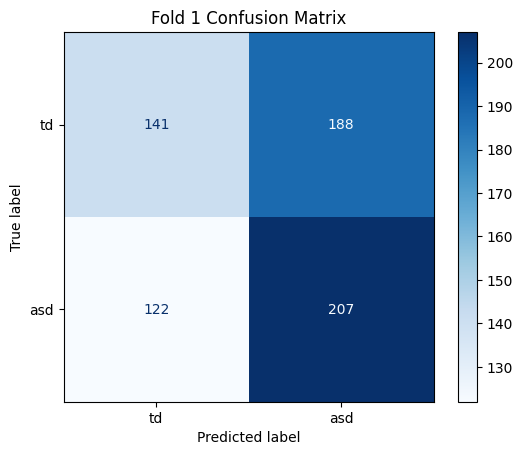


--- FOLD 2 / 4 ---
TESTING on: Round-2
TRAINING on: ['Round-1', 'Round-3', 'Round-4']
Loading data...
Training data shape (segments, features): (1970, 617)
Test data shape (segments, features): (658, 597)
Scaling features...
Training Random Forest model...
Evaluating model...

--- Fold 2 Results ---
Accuracy: 89.36%
Classification Report:
              precision    recall  f1-score   support

          td       0.91      0.87      0.89       329
         asd       0.88      0.91      0.90       329

    accuracy                           0.89       658
   macro avg       0.89      0.89      0.89       658
weighted avg       0.89      0.89      0.89       658



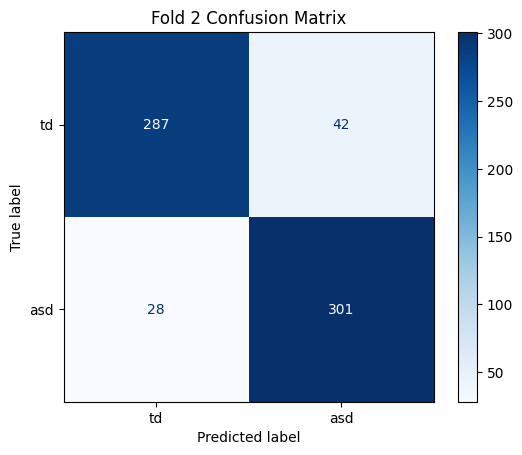


--- FOLD 3 / 4 ---
TESTING on: Round-3
TRAINING on: ['Round-1', 'Round-2', 'Round-4']
Loading data...
Training data shape (segments, features): (1974, 617)
Test data shape (segments, features): (654, 617)
Scaling features...
Training Random Forest model...
Evaluating model...

--- Fold 3 Results ---
Accuracy: 63.00%
Classification Report:
              precision    recall  f1-score   support

          td       0.65      0.57      0.61       329
         asd       0.61      0.69      0.65       325

    accuracy                           0.63       654
   macro avg       0.63      0.63      0.63       654
weighted avg       0.63      0.63      0.63       654



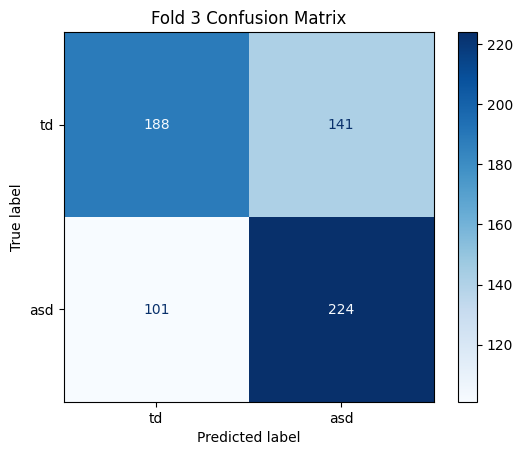


--- FOLD 4 / 4 ---
TESTING on: Round-4
TRAINING on: ['Round-1', 'Round-2', 'Round-3']
Loading data...
Training data shape (segments, features): (1970, 617)
Test data shape (segments, features): (658, 617)
Scaling features...
Training Random Forest model...
Evaluating model...

--- Fold 4 Results ---
Accuracy: 72.34%
Classification Report:
              precision    recall  f1-score   support

          td       0.67      0.87      0.76       329
         asd       0.81      0.58      0.68       329

    accuracy                           0.72       658
   macro avg       0.74      0.72      0.72       658
weighted avg       0.74      0.72      0.72       658



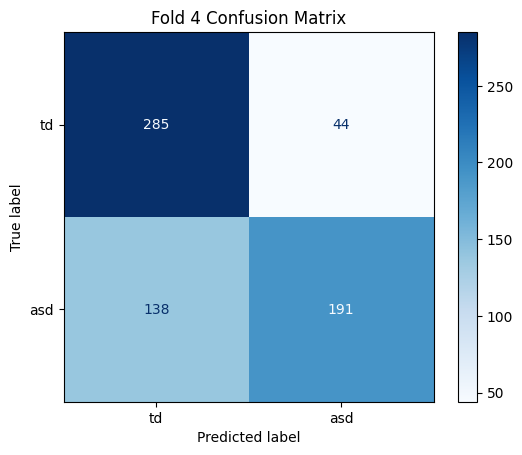


--- Cross-Validation Complete ---
All Fold Accuracies: ['52.89%', '89.36%', '63.00%', '72.34%']

Final Average Accuracy: 69.40% (± 13.42%)

Average Classification Report (across all folds):
              precision  recall  f1-score  support
0                  0.69    0.68      0.68   329.00
1                  0.71    0.70      0.70   328.00
accuracy           0.69    0.69      0.69     0.69
macro avg          0.70    0.69      0.69   657.00
weighted avg       0.70    0.69      0.69   657.00


In [ ]:
# @title
import pandas as pd
import numpy as np
import glob
import os
import matplotlib.pyplot as plt
import warnings

# --- scikit-learn (ML) Imports ---
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import (
    accuracy_score,
    classification_report,
    ConfusionMatrixDisplay
)
from sklearn.impute import SimpleImputer # Handles any potential missing values

# ========= CONFIGURATION =========

# 1. The main folder containing your 4 "Round" subfolders
base_folder = "/content/drive/MyDrive/Design_Project/Final_label2"

# 2. The names of your 4 fold (Round) folders
#    We will loop through these.
fold_folders = [
    os.path.join(base_folder, "Round-1"),
    os.path.join(base_folder, "Round-2"),
    os.path.join(base_folder, "Round-3"),
    os.path.join(base_folder, "Round-4")
]
N_SPLITS = 4 # Must match the number of folders

# 3. The name of your "label" column in the CSVs
TARGET_COLUMN = 'Group'

# 4. How to map your text labels to numbers (1 = Autism, 0 = Control)
#    (Based on your 'asd'/'td' keys, this is our assumption)
LABEL_MAP = {
    'asd': 1,
    'td': 0
}
# =================================

def load_data_from_folders(list_of_folder_paths):
    """
    Loads all '*_LABELED.csv' files from a list of folders
    and stacks them into one big DataFrame.
    """
    all_dfs = []
    for folder_path in list_of_folder_paths:
        # Find all labeled CSV files in this folder
        glob_pattern = os.path.join(folder_path, "*_LABELED.csv")
        csv_files = glob.glob(glob_pattern)

        if not csv_files:
            print(f"Warning: No '_LABELED.csv' files found in {folder_path}")
            continue

        for file_path in csv_files:
            try:
                df = pd.read_csv(file_path)
                all_dfs.append(df)
            except Exception as e:
                print(f"Error loading {file_path}: {e}")

    if not all_dfs:
        return pd.DataFrame() # Return empty df if no files were loaded

    # Stack all the individual DataFrames into one
    return pd.concat(all_dfs, ignore_index=True)

def run_cross_validation():
    """
    Main function to run the 4-fold cross-validation.
    """
    warnings.filterwarnings("ignore")

    # This list will store the final accuracy from each of the 4 runs
    all_fold_accuracies = []
    # --- FIX 1: Change what we store ---
    # We will store the actual y_test and y_pred values, not the report string
    all_fold_predictions = []

    # --- FIX: Corrected typo N_SPIITS -> N_SPLITS and removed duplicate line ---
    print(f"Starting {N_SPLITS}-Fold Cross-Validation...")

    # --- STEP 1: The Main Loop ---
    # This loop runs 4 times, once for each "Round"
    for i in range(N_SPLITS):

        print(f"\n=================================================")
        print(f"--- FOLD {i+1} / {N_SPLITS} ---")

        # --- STEP 2: Assign Train/Test Folders ---

        # The test folder is the current one in the loop (e.g., "Round-1")
        test_folder = [fold_folders[i]]

        # The train folders are *all other* folders
        train_folders = [fold_folders[j] for j in range(N_SPLITS) if j != i]

        print(f"TESTING on: {os.path.basename(test_folder[0])}")
        print(f"TRAINING on: {[os.path.basename(f) for f in train_folders]}")

        # --- STEP 3: Load Data ---
        print("Loading data...")
        train_df = load_data_from_folders(train_folders)
        test_df = load_data_from_folders(test_folder)

        if train_df.empty or test_df.empty:
            print("Error: No data loaded for this fold. Skipping.")
            continue

        print(f"Training data shape (segments, features): {train_df.shape}")
        print(f"Test data shape (segments, features): {test_df.shape}")

        # --- STEP 4: Prepare Data (X and y) ---

        # --- Handle Labels (y) ---
        # 1. Map text labels ('asd'/'td') to numbers (1/0)
        y_train = train_df[TARGET_COLUMN].map(LABEL_MAP)
        y_test = test_df[TARGET_COLUMN].map(LABEL_MAP)

        # 2. Drop the label column from the features
        X_train = train_df.drop(columns=[TARGET_COLUMN])
        X_test = test_df.drop(columns=[TARGET_COLUMN])

        # --- Handle Features (X) ---
        # 3. Convert any text columns (like 'Gender') to numbers
        #    This makes 'Gender_M' (0 or 1) etc.
        X_train = pd.get_dummies(X_train, drop_first=True)
        X_test = pd.get_dummies(X_test, drop_first=True)

        # 4. Align columns: This is a *critical* safety check.
        #    It ensures X_test has the exact same columns in the same order
        #    as X_train. Fills any missing with 0.
        X_train, X_test = X_train.align(X_test, join='left', axis=1, fill_value=0)

        # 5. Handle any potential missing (NaN) values from the align step
        #    We'll just fill them with 0.
        imputer = SimpleImputer(strategy='constant', fill_value=0)
        X_train = imputer.fit_transform(X_train)
        X_test = imputer.transform(X_test)

        # --- STEP 5: Feature Scaling (CRITICAL!) ---
        # This prevents data leakage.
        print("Scaling features...")
        scaler = StandardScaler()

        # 1. FIT the scaler *ONLY* on the training data
        scaler.fit(X_train)

        # 2. TRANSFORM both training and test data
        X_train_scaled = scaler.transform(X_train)
        X_test_scaled = scaler.transform(X_test)

        # --- STEP 6: Train the Model ---
        print("Training Random Forest model...")

        # We use class_weight='balanced' to help with any imbalance
        # between the number of 'asd' and 'td' segments.
        model = RandomForestClassifier(
            n_estimators=100,      # 100 "decision trees"
            random_state=42,       # For reproducible results
            class_weight='balanced'
        )

        model.fit(X_train_scaled, y_train)

        # --- STEP 7: Test (Evaluate) ---
        print("Evaluating model...")
        y_pred = model.predict(X_test_scaled)

        # Calculate metrics
        acc = accuracy_score(y_test, y_pred)
        report_string = classification_report( # Renamed to 'report_string'
            y_test,
            y_pred,
            target_names=[key for key, val in LABEL_MAP.items() if val == 0] +
                         [key for key, val in LABEL_MAP.items() if val == 1]
        )

        all_fold_accuracies.append(acc)
        # --- FIX 2: Store the data, not the string ---
        # Instead of appending the report string, we append the raw data
        all_fold_predictions.append({'y_true': y_test, 'y_pred': y_pred})

        print(f"\n--- Fold {i+1} Results ---")
        print(f"Accuracy: {acc * 100:.2f}%")
        print("Classification Report:")
        print(report_string) # Print the string report for this fold

        # Plot and show the confusion matrix for this fold
        ConfusionMatrixDisplay.from_predictions(
            y_test,
            y_pred,
            display_labels=[key for key, val in LABEL_MAP.items() if val == 0] +
                             [key for key, val in LABEL_MAP.items() if val == 1],
            cmap='Blues'
        )
        plt.title(f"Fold {i+1} Confusion Matrix")
        plt.show()

    # --- STEP 8: Show Final Average Results ---
    print("\n=================================================")
    print("--- Cross-Validation Complete ---")

    mean_accuracy = np.mean(all_fold_accuracies)
    std_accuracy = np.std(all_fold_accuracies)

    print(f"All Fold Accuracies: {[f'{acc*100:.2f}%' for acc in all_fold_accuracies]}")
    print(f"\nFinal Average Accuracy: {mean_accuracy * 100:.2f}% (± {std_accuracy * 100:.2f}%)")

    print("\nAverage Classification Report (across all folds):")
    # A simple way to average the reports
    # --- FIX 3: Use the correct data structure ---
    avg_report_dfs = [
        pd.DataFrame.from_dict(
            classification_report(
                all_fold_predictions[i]['y_true'], # Use the stored y_true
                all_fold_predictions[i]['y_pred'], # Use the stored y_pred
                output_dict=True,
                zero_division=0
            )
        ).transpose()
        for i in range(N_SPLITS)
    ]
    avg_report = pd.concat(avg_report_dfs).groupby(level=0).mean()

    print(avg_report.to_string(float_format="%.2f"))

# --- Run the main training function ---
if __name__ == "__main__":
    run_cross_validation()

**SEG+LABEL for 5+3**

In [ ]:
# @title
import numpy as np
import pandas as pd
import pywt
from scipy.stats import entropy as shannon_entropy
import warnings
import mne
import glob
import os
import re

# ========= CONFIGURATION =========

# 1. Source of the clean .set files
input_folder = "/content/drive/MyDrive/Design_Project/cleaned_output_data"

# 2. The metadata file with patient info
metadata_file = "/content/drive/MyDrive/Design_Project/metadata.csv"

# 3. The FINAL output folder for the labeled CSVs
output_folder = "/content/drive/MyDrive/Design_Project/Seg_DWT_data5sec"

# 4. Metadata columns to add from the .csv
METADATA_COLS = ['AgeMonths', 'Group', 'Gender', 'SRS_Total']

# 5. Segmentation Settings (from your last script)
SEGMENT_DURATION_SEC = 5.0
OVERLAP_DURATION_SEC = 3.0

# 6. DWT Settings
wavelet = 'db4'
dwt_level = 4
band_names = ['Delta_Theta', 'Alpha', 'Beta', 'Gamma_1', 'Gamma_2']

# =================================

def calculate_shannon_entropy(data, n_bins=10):
    counts, _ = np.histogram(data, bins=n_bins)
    probabilities = counts / len(data)
    probabilities = probabilities[probabilities > 0]
    return shannon_entropy(probabilities, base=2)

def run_feature_extraction_and_labeling():
    """
    Main function to run the combined process.
    """
    warnings.filterwarnings("ignore")

    # --- 1. SETUP ---
    # Create the final output folder if it doesn't exist
    os.makedirs(output_folder, exist_ok=True)
    print(f"Output folder is ready at: {output_folder}")

    # --- 2. LOAD METADATA ONCE ---
    try:
        meta = pd.read_csv(metadata_file)
        meta['ParticipantID'] = meta['ParticipantID'].astype(int)
        print(f"Successfully loaded metadata for {len(meta)} participants.")
    except FileNotFoundError:
        print(f"❌ ERROR: Metadata file not found at: {metadata_file}")
        return
    except KeyError:
        print(f"❌ ERROR: 'ParticipantID' column not found in {metadata_file}.")
        return

    # --- 3. GET LIST OF EEG FILES ---
    files = sorted(glob.glob(os.path.join(input_folder, "*.set")))
    print(f"Found {len(files)} EEG files to process.")

    success_count = 0
    fail_count = 0

    # --- 4. LOOP AND PROCESS EACH FILE ---
    for file_path in files:
        base_name = os.path.basename(file_path)
        print(f"\n===============================")
        print(f"Processing: {base_name}")
        print(f"===============================")

        try:
            # --- A. Extract Patient ID & Get Metadata ---
            match = re.match(r"(\d+)", base_name)
            if not match:
                print(f"  SKIPPING: Cannot extract patient ID from filename: {base_name}")
                fail_count += 1
                continue

            patient_id = int(match.group(1))

            row = meta[meta['ParticipantID'] == patient_id]
            if row.empty:
                print(f"  SKIPPING: No metadata found in {metadata_file} for ID: {patient_id}")
                fail_count += 1
                continue

            patient_metadata = row.iloc[0]

            # --- B. Load EEG ---
            raw_clean = mne.io.read_raw_eeglab(file_path, preload=True)
            ch_names = raw_clean.info['ch_names']
            print(f"  Loaded EEG data, {len(ch_names)} channels.")

            # --- C. Downsample & Segment ---
            raw_clean.resample(256)
            epochs = mne.make_fixed_length_epochs(
                raw_clean,
                duration=SEGMENT_DURATION_SEC,
                overlap=OVERLAP_DURATION_SEC,
                preload=True
            )
            print(f"  Created {len(epochs)} segments.")

            # --- D. DWT & Feature Extraction ---
            all_rows = []
            for i, segment_data in enumerate(epochs):
                row_features = {}
                for ch_index, ch_name in enumerate(ch_names):
                    ch_data = segment_data[ch_index]
                    coeffs = pywt.wavedec(ch_data, wavelet, level=dwt_level)

                    for band_index, band_name in enumerate(band_names):
                        band_coeffs = coeffs[band_index]
                        row_features[f"{ch_name}_{band_name}_Entropy"] = calculate_shannon_entropy(band_coeffs)

                all_rows.append(row_features)

            print(f"  Feature extraction complete for {len(all_rows)} segments.")

            # --- E. Create DataFrame and ADD METADATA ---
            df = pd.DataFrame(all_rows)

            print(f"  Adding metadata columns...")
            for col in METADATA_COLS:
                if col in patient_metadata:
                    df[col] = patient_metadata[col]
                else:
                    print(f"  WARNING: Metadata column '{col}' not found. Skipping this column.")

            # --- F. Save FINAL Labeled File ---
            subject_name = base_name.replace(".set", "")
            output_filename = f"{subject_name}_features_LABELED.csv"
            output_path = os.path.join(output_folder, output_filename)

            df.to_csv(output_path, index=False)
            print(f"  ✅ Saved labeled file to {output_folder}")
            print(f"  Shape: {df.shape}")
            success_count += 1

        except Exception as e:
            print(f"  ❌ UNEXPECTED ERROR processing file {base_name}: {e}")
            fail_count += 1

    print("\n--- All Done! ---")
    print(f"Successfully processed and labeled: {success_count} files.")
    print(f"Failed or skipped: {fail_count} files.")

# --- Run the main function ---
if __name__ == "__main__":
    run_feature_extraction_and_labeling()

Output folder is ready at: /content/drive/MyDrive/Design_Project/Seg_DWT_data5sec
Successfully loaded metadata for 56 participants.
Found 56 EEG files to process.

Processing: 10Abby_Resting_cleanedICACLEAN_subject.set
Reading /content/drive/MyDrive/Design_Project/cleaned_output_data/10Abby_Resting_cleanedICACLEAN_subject.fdt
Reading 0 ... 81920  =      0.000 ...   160.000 secs...
  Loaded EEG data, 59 channels.
Not setting metadata
78 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 78 events and 1280 original time points ...
0 bad epochs dropped
  Created 78 segments.
  Feature extraction complete for 78 segments.
  Adding metadata columns...
  ✅ Saved labeled file to /content/drive/MyDrive/Design_Project/Seg_DWT_data5sec
  Shape: (78, 297)

Processing: 11Abby_Resting_cleanedICACLEAN_subject.set
Reading /content/drive/MyDrive/Design_Project/cleaned_output_data/11Abby_Resting_cleanedICACLEAN_subject.fdt
Reading 0 ... 8

**Small seg try**

Finding all '*_LABELED.csv' files in: /content/drive/MyDrive/Design_Project/Seg_DWT_data5sec
Found 56 total files.
Splitting file list 80/20...
Using 44 files for TRAINING.
Using 12 files for TESTING.
Loading training data...
Loading testing data...
Total training data shape (segments, features): (3432, 617)
Total testing data shape (segments, features): (929, 617)
Preparing data...
Preprocessing and scaling...
Final training features shape: (3432, 616)
Final testing features shape: (929, 616)
Number of features: 616
Creating and training ANN model...
Model Architecture:


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 512)            │       315,904 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 128)            │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 64)             │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 494,337 (1.89 MB)

 Trainable params: 492,417 (1.88 MB)

 Non-trainable params: 1,920 (7.50 KB)


Training ANN for 100 epochs...
Epoch 1/100
97/97 ━━━━━━━━━━━━━━━━━━━━ 5s 17ms/step - accuracy: 0.8193 - loss: 1.5391 - precision: 0.7645 - recall: 0.9574 - val_accuracy: 0.8517 - val_loss: 1.2810 - val_precision: 1.0000 - val_recall: 0.3462 - learning_rate: 0.0010
Epoch 2/100
97/97 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.9919 - loss: 1.0513 - precision: 0.9928 - recall: 0.9909 - val_accuracy: 0.7733 - val_loss: 2.0118 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - learning_rate: 0.0010
Epoch 3/100
97/97 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.9837 - loss: 0.9215 - precision: 0.9901 - recall: 0.9784 - val_accuracy: 0.6686 - val_loss: 2.5982 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - learning_rate: 0.0010
Epoch 4/100
97/97 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.9954 - loss: 0.7758 - precision: 0.9969 - recall: 0.9941 - val_accuracy: 0.7733 - val_loss: 2.1181 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - learning_rate: 0.0010
Epoch 5/100

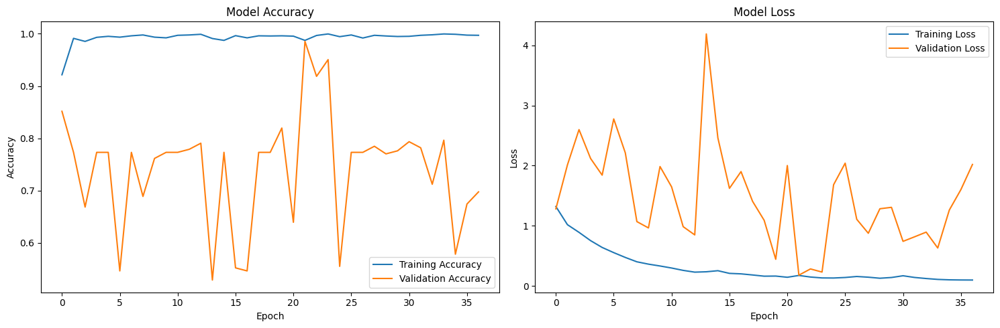

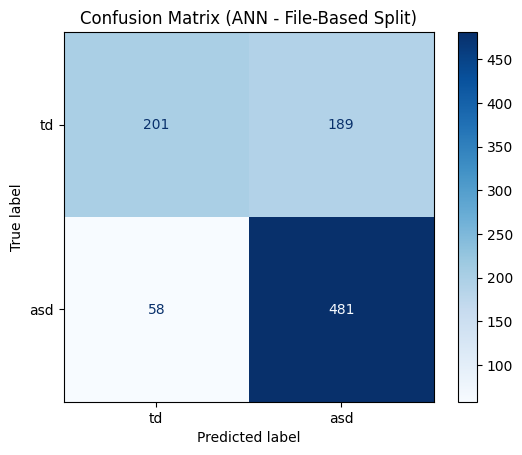


Additional Test Metrics:
Test Loss: 1.9155
Test Accuracy: 0.7341
Test Precision: 0.7179
Test Recall: 0.8924


In [ ]:
# @title
import pandas as pd
import numpy as np
import glob
import os
import matplotlib.pyplot as plt
import warnings

# --- scikit-learn Imports ---
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import (
    accuracy_score,
    classification_report,
    ConfusionMatrixDisplay
)
from sklearn.impute import SimpleImputer

# --- Keras/TensorFlow for ANN ---
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.regularizers import l2

# ========= CONFIGURATION =========

# 1. The main folder containing your 56 CSV files
base_folder = "/content/drive/MyDrive/Design_Project/Seg_DWT_data5sec"

# 2. The name of your "label" column in the CSVs
TARGET_COLUMN = 'Group'

# 3. How to map your text labels to numbers (1 = Autism, 0 = Control)
LABEL_MAP = {
    'asd': 1,
    'td': 0
}

# 4. ANN Training Parameters
EPOCHS = 100
BATCH_SIZE = 32
VALIDATION_SPLIT = 0.1  # Use 10% of training data for validation during training
# =================================

def load_data_from_file_list(list_of_files):
    """Loads and concatenates a list of CSV file paths."""
    all_dfs = []
    for file_path in list_of_files:
        try:
            df = pd.read_csv(file_path)
            all_dfs.append(df)
        except Exception as e:
            print(f"Error loading {file_path}: {e}")

    if not all_dfs:
        return pd.DataFrame()

    return pd.concat(all_dfs, ignore_index=True)

def create_ann_model(input_dim):
    """
    Creates an ANN model with architecture suitable for 271 features
    and binary classification (ASD vs Control)
    """
    model = Sequential([
        # Input layer with 271 features
        Dense(512, activation='relu', input_shape=(input_dim,),
              kernel_regularizer=l2(0.001)),
        BatchNormalization(),
        Dropout(0.3),

        # Hidden layer 1
        Dense(256, activation='relu', kernel_regularizer=l2(0.001)),
        BatchNormalization(),
        Dropout(0.3),

        # Hidden layer 2
        Dense(128, activation='relu', kernel_regularizer=l2(0.001)),
        BatchNormalization(),
        Dropout(0.2),

        # Hidden layer 3
        Dense(64, activation='relu', kernel_regularizer=l2(0.001)),
        BatchNormalization(),
        Dropout(0.2),

        # Hidden layer 4
        Dense(32, activation='relu'),
        Dropout(0.1),

        # Output layer (binary classification: ASD vs Control)
        Dense(1, activation='sigmoid')
    ])

    # Compile the model
    model.compile(
        optimizer=Adam(learning_rate=0.001),
        loss='binary_crossentropy',
        metrics=['accuracy', 'precision', 'recall']
    )

    return model

def run_80_20_file_split():
    """
    Loads all CSVs from the base_folder, splits the FILE LIST 80/20,
    and runs the ANN model once.
    """
    warnings.filterwarnings("ignore")

    # --- STEP 1: Get list of all CSV files ---
    print(f"Finding all '*_LABELED.csv' files in: {base_folder}")

    glob_pattern = os.path.join(base_folder, "*_LABELED.csv")
    csv_files = glob.glob(glob_pattern)

    if not csv_files:
        print(f"Error: No '*_LABELED.csv' files found in {base_folder}")
        print("Please check the 'base_folder' path.")
        return

    print(f"Found {len(csv_files)} total files.")

    # --- STEP 2: Perform 80/20 Split on the FILE LIST ---
    print("Splitting file list 80/20...")

    train_files, test_files = train_test_split(
        csv_files,
        test_size=0.20,       # 20% of files for test
        random_state=42,      # For reproducible split
        shuffle=True
    )

    print(f"Using {len(train_files)} files for TRAINING.")
    print(f"Using {len(test_files)} files for TESTING.")

    # --- STEP 3: Load Data from the file lists ---
    print("Loading training data...")
    train_df = load_data_from_file_list(train_files)

    print("Loading testing data...")
    test_df = load_data_from_file_list(test_files)

    if train_df.empty or test_df.empty:
        print("Error: No data loaded for train or test set. Exiting.")
        return

    print(f"Total training data shape (segments, features): {train_df.shape}")
    print(f"Total testing data shape (segments, features): {test_df.shape}")

    # --- STEP 4: Prepare Data (X and y) ---
    print("Preparing data...")

    # 1. Map text labels ('asd'/'td') to numbers (1/0)
    y_train = train_df[TARGET_COLUMN].map(LABEL_MAP).values
    y_test = test_df[TARGET_COLUMN].map(LABEL_MAP).values

    # 2. Get features by dropping the label
    X_train = train_df.drop(columns=[TARGET_COLUMN])
    X_test = test_df.drop(columns=[TARGET_COLUMN])

    # --- STEP 5: Preprocessing Pipeline ---
    print("Preprocessing and scaling...")

    # 1. Convert any text columns (like 'Gender') to numbers
    X_train = pd.get_dummies(X_train, drop_first=True)
    X_test = pd.get_dummies(X_test, drop_first=True)

    # 2. Align columns: Ensures test has same columns as train
    X_train, X_test = X_train.align(X_test, join='left', axis=1, fill_value=0)

    # 3. Handle any potential missing (NaN) values
    imputer = SimpleImputer(strategy='constant', fill_value=0)
    X_train = imputer.fit_transform(X_train)
    X_test = imputer.transform(X_test)

    # 4. Feature Scaling (CRITICAL for ANN!)
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)  # Fit on training data
    X_test_scaled = scaler.transform(X_test)        # Transform test data

    print(f"Final training features shape: {X_train_scaled.shape}")
    print(f"Final testing features shape: {X_test_scaled.shape}")
    print(f"Number of features: {X_train_scaled.shape[1]}")

    # --- STEP 6: Create and Train the ANN Model ---
    print("Creating and training ANN model...")

    # Create model
    model = create_ann_model(input_dim=X_train_scaled.shape[1])

    print("Model Architecture:")
    model.summary()

    # Define callbacks for better training
    callbacks = [
        EarlyStopping(
            monitor='val_loss',
            patience=15,
            restore_best_weights=True,
            verbose=1
        ),
        ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.5,
            patience=10,
            min_lr=1e-7,
            verbose=1
        )
    ]

    # Train the model
    print(f"\nTraining ANN for {EPOCHS} epochs...")
    history = model.fit(
        X_train_scaled, y_train,
        batch_size=BATCH_SIZE,
        epochs=EPOCHS,
        validation_split=VALIDATION_SPLIT,
        callbacks=callbacks,
        verbose=1,
        class_weight={0: 1.0, 1: 1.0}  # Adjust if class imbalance exists
    )

    # --- STEP 7: Test (Evaluate) ---
    print("Evaluating model on the 20% test files...")

    # Predict probabilities
    y_pred_proba = model.predict(X_test_scaled)

    # Convert probabilities to binary predictions (threshold = 0.5)
    y_pred = (y_pred_proba > 0.5).astype(int).flatten()

    # Calculate metrics
    acc = accuracy_score(y_test, y_pred)
    report_string = classification_report(
        y_test,
        y_pred,
        target_names=[key for key, val in LABEL_MAP.items() if val == 0] +
                     [key for key, val in LABEL_MAP.items() if val == 1]
    )

    print(f"\n--- Final ANN Model Results (80/20 File-Based Split) ---")
    print(f"Accuracy: {acc * 100:.2f}%")
    print("Classification Report:")
    print(report_string)

    # Plot training history
    plt.figure(figsize=(15, 5))

    # Plot training & validation accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Training Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Model Accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend()

    # Plot training & validation loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Model Loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend()

    plt.tight_layout()
    plt.show()

    # Plot and show the confusion matrix
    ConfusionMatrixDisplay.from_predictions(
        y_test,
        y_pred,
        display_labels=[key for key, val in LABEL_MAP.items() if val == 0] +
                         [key for key, val in LABEL_MAP.items() if val == 1],
        cmap='Blues'
    )
    plt.title("Confusion Matrix (ANN - File-Based Split)")
    plt.show()

    # Print some additional metrics
    test_loss, test_accuracy, test_precision, test_recall = model.evaluate(
        X_test_scaled, y_test, verbose=0
    )
    print(f"\nAdditional Test Metrics:")
    print(f"Test Loss: {test_loss:.4f}")
    print(f"Test Accuracy: {test_accuracy:.4f}")
    print(f"Test Precision: {test_precision:.4f}")
    print(f"Test Recall: {test_recall:.4f}")

# --- Run the main training function ---
if __name__ == "__main__":
    run_80_20_file_split()

**80/20 split test**

Finding all '*_LABELED.csv' files in: /content/drive/MyDrive/Design_Project/Seg_DWT_data5sec
Found 56 total files.
Splitting file list 80/20...
Using 44 files for TRAINING.
Using 12 files for TESTING.
Loading training data...
Loading testing data...
Total training data shape (segments, features): (3432, 617)
Total testing data shape (segments, features): (929, 617)
Preparing data...
Preprocessing and scaling...
Training Random Forest model...
Evaluating model on the 20% test files...

--- Final Model Results (80/20 File-Based Split) ---
Accuracy: 78.47%
Classification Report:
              precision    recall  f1-score   support

          td       0.77      0.69      0.73       390
         asd       0.79      0.86      0.82       539

    accuracy                           0.78       929
   macro avg       0.78      0.77      0.78       929
weighted avg       0.78      0.78      0.78       929



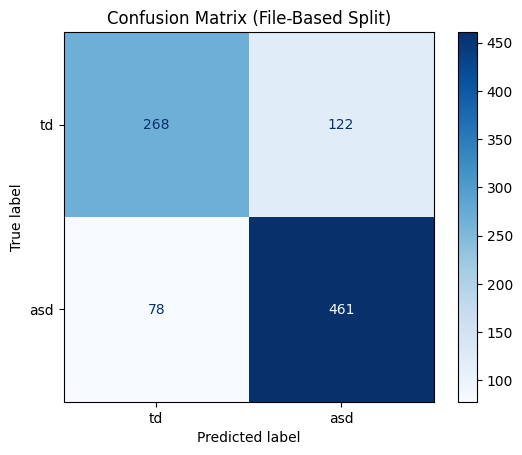

In [ ]:
# @title
import pandas as pd
import numpy as np
import glob
import os
import matplotlib.pyplot as plt
import warnings

# --- scikit-learn (ML) Imports ---
# Import train_test_split
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import (
    accuracy_score,
    classification_report,
    ConfusionMatrixDisplay
)
from sklearn.impute import SimpleImputer # Handles any potential missing values

# ========= CONFIGURATION =========

# 1. The main folder containing your 56 CSV files
base_folder = "/content/drive/MyDrive/Design_Project/Seg_DWT_data5sec"

# 3. The name of your "label" column in the CSVs
TARGET_COLUMN = 'Group'

# 4. How to map your text labels to numbers (1 = Autism, 0 = Control)
LABEL_MAP = {
    'asd': 1,
    'td': 0
}
# =================================

def load_data_from_file_list(list_of_files):
    """Loads and concatenates a list of CSV file paths."""
    all_dfs = []
    for file_path in list_of_files:
        try:
            df = pd.read_csv(file_path)
            all_dfs.append(df)
        except Exception as e:
            print(f"Error loading {file_path}: {e}")

    if not all_dfs:
        return pd.DataFrame()

    return pd.concat(all_dfs, ignore_index=True)

def run_80_20_file_split():
    """
    Loads all CSVs from the base_folder, splits the FILE LIST 80/20,
    and runs the model once.
    """
    warnings.filterwarnings("ignore")

    # --- STEP 1: Get list of all CSV files ---
    print(f"Finding all '*_LABELED.csv' files in: {base_folder}")

    glob_pattern = os.path.join(base_folder, "*_LABELED.csv")
    csv_files = glob.glob(glob_pattern)

    if not csv_files:
        print(f"Error: No '*_LABELED.csv' files found in {base_folder}")
        print("Please check the 'base_folder' path.")
        return

    print(f"Found {len(csv_files)} total files.")

    # --- STEP 2: Perform 80/20 Split on the FILE LIST ---
    print("Splitting file list 80/20...")

    train_files, test_files = train_test_split(
        csv_files,
        test_size=0.20,       # 20% of files for test
        random_state=42       # For reproducible split
    )

    print(f"Using {len(train_files)} files for TRAINING.")
    print(f"Using {len(test_files)} files for TESTING.")

    # --- STEP 3: Load Data from the file lists ---
    print("Loading training data...")
    train_df = load_data_from_file_list(train_files)

    print("Loading testing data...")
    test_df = load_data_from_file_list(test_files)

    if train_df.empty or test_df.empty:
        print("Error: No data loaded for train or test set. Exiting.")
        return

    print(f"Total training data shape (segments, features): {train_df.shape}")
    print(f"Total testing data shape (segments, features): {test_df.shape}")

    # --- STEP 4: Prepare Data (X and y) ---
    print("Preparing data...")

    # 1. Map text labels ('asd'/'td') to numbers (1/0)
    y_train = train_df[TARGET_COLUMN].map(LABEL_MAP)
    y_test = test_df[TARGET_COLUMN].map(LABEL_MAP)

    # 2. Get features by dropping the label
    X_train = train_df.drop(columns=[TARGET_COLUMN])
    X_test = test_df.drop(columns=[TARGET_COLUMN])

    # --- STEP 5: Preprocessing Pipeline ---
    print("Preprocessing and scaling...")

    # 1. Convert any text columns (like 'Gender') to numbers
    X_train = pd.get_dummies(X_train, drop_first=True)
    X_test = pd.get_dummies(X_test, drop_first=True)

    # 2. Align columns: Ensures test has same columns as train
    X_train, X_test = X_train.align(X_test, join='left', axis=1, fill_value=0)

    # 3. Handle any potential missing (NaN) values
    imputer = SimpleImputer(strategy='constant', fill_value=0)
    X_train = imputer.fit_transform(X_train)
    X_test = imputer.transform(X_test)

    # 4. Feature Scaling (CRITICAL!)
    scaler = StandardScaler()
    scaler.fit(X_train) # Fit ONLY on training data
    X_train_scaled = scaler.transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # --- STEP 6: Train the Model ---
    print("Training Random Forest model...")

    model = RandomForestClassifier(
        n_estimators=100,      # Using 100 trees for a robust model
        random_state=42,       # For reproducible results
        class_weight='balanced'
    )
    model.fit(X_train_scaled, y_train)

    # --- STEP 7: Test (Evaluate) ---
    print("Evaluating model on the 20% test files...")
    y_pred = model.predict(X_test_scaled)

    # Calculate metrics
    acc = accuracy_score(y_test, y_pred)
    report_string = classification_report(
        y_test,
        y_pred,
        target_names=[key for key, val in LABEL_MAP.items() if val == 0] +
                     [key for key, val in LABEL_MAP.items() if val == 1]
    )

    print(f"\n--- Final Model Results (80/20 File-Based Split) ---")
    print(f"Accuracy: {acc * 100:.2f}%")
    print("Classification Report:")
    print(report_string)

    # Plot and show the confusion matrix
    ConfusionMatrixDisplay.from_predictions(
        y_test,
        y_pred,
        display_labels=[key for key, val in LABEL_MAP.items() if val == 0] +
                         [key for key, val in LABEL_MAP.items() if val == 1],
        cmap='Blues'
    )
    plt.title("Confusion Matrix (File-Based Split)")
    plt.show()

# --- Run the main training function ---
if __name__ == "__main__":
    run_80_20_file_split() # Call the new function

**80/20 split with +whole**

Finding all '*_features_LABELED.csv' files in: /content/drive/MyDrive/Design_Project/Seg_DWT_data5sec
Found 56 total files.
Splitting file list 80/20...
Using 44 files for TRAINING.
Using 12 files for TESTING.
Loading training data (main + additional)...
Loading testing data (main + additional)...
Total training data shape (segments, features): (3432, 927)
Total testing data shape (segments, features): (929, 932)
Preparing data...
Preprocessing and scaling...
Training Random Forest model...
Evaluating model on the 20% test files...

--- Final Model Results (80/20 File-Based Split) ---
Accuracy: 75.46%
Classification Report:
              precision    recall  f1-score   support

          td       0.75      0.62      0.68       390
         asd       0.76      0.85      0.80       539

    accuracy                           0.75       929
   macro avg       0.75      0.74      0.74       929
weighted avg       0.75      0.75      0.75       929



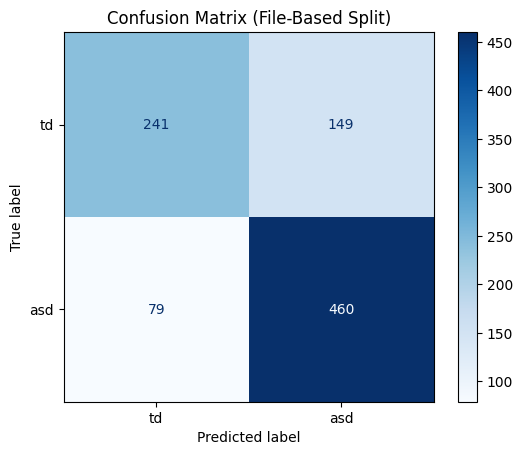

In [ ]:
# @title
import pandas as pd
import numpy as np
import glob
import os
import matplotlib.pyplot as plt
import warnings

# --- scikit-learn (ML) Imports ---
# Import train_test_split
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import (
    accuracy_score,
    classification_report,
    ConfusionMatrixDisplay
)
from sklearn.impute import SimpleImputer # Handles any potential missing values

# ========= CONFIGURATION =========

# 1. The main folder containing your 56 CSV files
base_folder = "/content/drive/MyDrive/Design_Project/Seg_DWT_data5sec"

# 2. The folder with the corresponding "whole" data files
additional_data_folder = "/content/drive/MyDrive/Design_Project/Whole_eeg"

# 3. The name of your "label" column in the CSVs
TARGET_COLUMN = 'Group'

# 4. How to map your text labels to numbers (1 = Autism, 0 = Control)
LABEL_MAP = {
    'asd': 1,
    'td': 0
}
# =================================

def load_data_from_file_list(list_of_files, additional_folder):
    """
    Loads and concatenates a list of CSV file paths.
    Also finds and merges corresponding files from 'additional_folder'.
    """
    all_dfs = []
    for file_path in list_of_files:
        try:
            # 1. Load the main features file
            df_main = pd.read_csv(file_path)

            # 2. Construct the path for the additional file
            file_name = os.path.basename(file_path)
            base_name = file_name.replace("_features_LABELED.csv", "")
            additional_file_name = f"{base_name}_whole.csv"
            additional_file_path = os.path.join(additional_folder, additional_file_name)

            # 3. Load the additional file if it exists
            if os.path.exists(additional_file_path):
                df_additional = pd.read_csv(additional_file_path)

                # 4. Prepare for join: Drop the target column from the additional file
                #    (if it exists) to avoid conflicts.
                df_additional_features = df_additional.drop(columns=[TARGET_COLUMN], errors='ignore')

                # --- FIX: Rename additional columns to guarantee uniqueness ---
                # This prevents the "InvalidIndexError"
                num_cols = len(df_additional_features.columns)
                new_cols = [f"add_feat_{i}" for i in range(num_cols)]
                df_additional_features.columns = new_cols
                # --- End Fix ---

                # 5. Combine side-by-side (axis=1).
                #    This assumes rows are in the same order in both files.
                combined_df = pd.concat([df_main, df_additional_features], axis=1)
                all_dfs.append(combined_df)

            else:
                print(f"Warning: No corresponding file found at {additional_file_path}")
                print(f"         Skipping main file: {file_path}")

        except Exception as e:
            print(f"Error loading or combining {file_path}: {e}")

    if not all_dfs:
        return pd.DataFrame()

    return pd.concat(all_dfs, ignore_index=True)

def run_80_20_file_split():
    """
    Loads all CSVs from the base_folder, splits the FILE LIST 80/20,
    loads corresponding data, and runs the model once.
    """
    warnings.filterwarnings("ignore")

    # --- STEP 1: Get list of all CSV files ---
    print(f"Finding all '*_features_LABELED.csv' files in: {base_folder}")

    # Updated glob pattern to be more specific
    glob_pattern = os.path.join(base_folder, "*_features_LABELED.csv")
    csv_files = glob.glob(glob_pattern)

    if not csv_files:
        print(f"Error: No '*_features_LABELED.csv' files found in {base_folder}")
        print("Please check the 'base_folder' path and file naming.")
        return

    print(f"Found {len(csv_files)} total files.")

    # --- STEP 2: Perform 80/20 Split on the FILE LIST ---
    print("Splitting file list 80/20...")

    train_files, test_files = train_test_split(
        csv_files,
        test_size=0.20,       # 20% of files for test
        random_state=42       # For reproducible split
    )

    print(f"Using {len(train_files)} files for TRAINING.")
    print(f"Using {len(test_files)} files for TESTING.")

    # --- STEP 3: Load Data from the file lists ---
    print("Loading training data (main + additional)...")
    train_df = load_data_from_file_list(train_files, additional_data_folder)

    print("Loading testing data (main + additional)...")
    test_df = load_data_from_file_list(test_files, additional_data_folder)

    if train_df.empty or test_df.empty:
        print("Error: No data loaded for train or test set. Exiting.")
        return

    print(f"Total training data shape (segments, features): {train_df.shape}")
    print(f"Total testing data shape (segments, features): {test_df.shape}")

    # --- STEP 4: Prepare Data (X and y) ---
    print("Preparing data...")

    # 1. Map text labels ('asd'/'td') to numbers (1/0)
    y_train = train_df[TARGET_COLUMN].map(LABEL_MAP)
    y_test = test_df[TARGET_COLUMN].map(LABEL_MAP)

    # 2. Get features by dropping the label
    X_train = train_df.drop(columns=[TARGET_COLUMN])
    X_test = test_df.drop(columns=[TARGET_COLUMN])

    # --- STEP 5: Preprocessing Pipeline ---
    print("Preprocessing and scaling...")

    # 1. Convert any text columns (like 'Gender') to numbers
    X_train = pd.get_dummies(X_train, drop_first=True)
    X_test = pd.get_dummies(X_test, drop_first=True)

    # 2. Align columns: Ensures test has same columns as train
    X_train, X_test = X_train.align(X_test, join='left', axis=1, fill_value=0)

    # 3. Handle any potential missing (NaN) values
    imputer = SimpleImputer(strategy='constant', fill_value=0)
    X_train = imputer.fit_transform(X_train)
    X_test = imputer.transform(X_test)

    # 4. Feature Scaling (CRITICAL!)
    scaler = StandardScaler()
    scaler.fit(X_train) # Fit ONLY on training data
    X_train_scaled = scaler.transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # --- STEP 6: Train the Model ---
    print("Training Random Forest model...")

    model = RandomForestClassifier(
        n_estimators=100,      # Using 100 trees for a robust model
        random_state=42,       # For reproducible results
        class_weight='balanced'
    )
    model.fit(X_train_scaled, y_train)

    # --- STEP 7: Test (Evaluate) ---
    print("Evaluating model on the 20% test files...")
    y_pred = model.predict(X_test_scaled)

    # Calculate metrics
    acc = accuracy_score(y_test, y_pred)
    report_string = classification_report(
        y_test,
        y_pred,
        target_names=[key for key, val in LABEL_MAP.items() if val == 0] +
                     [key for key, val in LABEL_MAP.items() if val == 1]
    )

    print(f"\n--- Final Model Results (80/20 File-Based Split) ---")
    print(f"Accuracy: {acc * 100:.2f}%")
    print("Classification Report:")
    print(report_string)

    # Plot and show the confusion matrix
    ConfusionMatrixDisplay.from_predictions(
        y_test,
        y_pred,
        display_labels=[key for key, val in LABEL_MAP.items() if val == 0] +
                         [key for key, val in LABEL_MAP.items() if val == 1],
        cmap='Blues'
    )
    plt.title("Confusion Matrix (File-Based Split)")
    plt.show()

# --- Run the main training function ---
if __name__ == "__main__":
    run_80_20_file_split() # Call the new function

**80/20 split with 20sec seg+whole**

Finding all '*_features_LABELED.csv' files in: /content/drive/MyDrive/Design_Project/Final_label2
Found 56 total files.
Splitting file list 80/20...
Using 44 files for TRAINING.
Using 12 files for TESTING.
Loading training data (main + additional)...
Loading testing data (main + additional)...
Total training data shape (segments, features): (2068, 927)
Total testing data shape (segments, features): (560, 932)
Preparing data...
Preprocessing and scaling...
Training Random Forest model...
Evaluating model on the 20% test files...

--- Final Model Results (80/20 File-Based Split) ---
Accuracy: 79.46%
Classification Report:
              precision    recall  f1-score   support

          td       0.75      0.76      0.76       235
         asd       0.83      0.82      0.82       325

    accuracy                           0.79       560
   macro avg       0.79      0.79      0.79       560
weighted avg       0.80      0.79      0.79       560



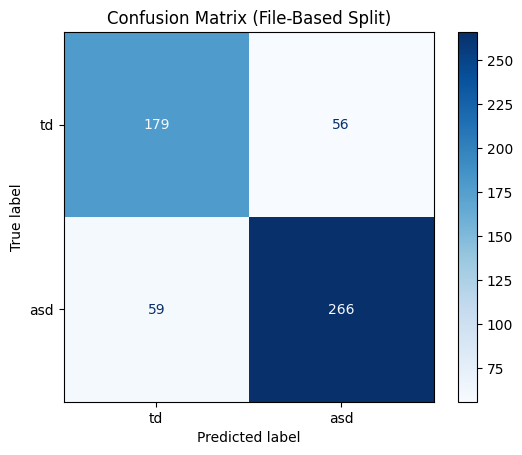

In [ ]:
# @title
import pandas as pd
import numpy as np
import glob
import os
import matplotlib.pyplot as plt
import warnings

# --- scikit-learn (ML) Imports ---
# Import train_test_split
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import (
    accuracy_score,
    classification_report,
    ConfusionMatrixDisplay
)
from sklearn.impute import SimpleImputer # Handles any potential missing values

# ========= CONFIGURATION =========

# 1. The main folder containing your 56 CSV files
base_folder = "/content/drive/MyDrive/Design_Project/Final_label2" # <-- CORRECTED FOLDER

# 2. The folder with the corresponding "whole" data files
additional_data_folder = "/content/drive/MyDrive/Design_Project/Whole_eeg"

# 3. The name of your "label" column in the CSVs
TARGET_COLUMN = 'Group' # <-- This should now be correct

# 4. How to map your text labels to numbers (1 = Autism, 0 = Control)
LABEL_MAP = {
    'asd': 1,
    'td': 0
}
# =================================

def load_data_from_file_list(list_of_files, additional_folder):
    """
    Loads and concatenates a list of CSV file paths.
    Also finds and merges corresponding files from 'additional_folder'.
    """
    all_dfs = []
    for file_path in list_of_files:
        try:
            # 1. Load the main features file
            df_main = pd.read_csv(file_path)

            # 2. Construct the path for the additional file
            file_name = os.path.basename(file_path)
            # --- CORRECTED FILE NAME LOGIC ---
            base_name = file_name.replace("_features_LABELED.csv", "")
            additional_file_name = f"{base_name}_whole.csv"
            additional_file_path = os.path.join(additional_folder, additional_file_name)

            # 3. Load the additional file if it exists
            if os.path.exists(additional_file_path):
                df_additional = pd.read_csv(additional_file_path)

                # 4. Prepare for join: Drop the target column from the additional file
                #    (if it exists) to avoid conflicts.
                df_additional_features = df_additional.drop(columns=[TARGET_COLUMN], errors='ignore')

                # --- FIX: Rename additional columns to guarantee uniqueness ---
                num_cols = len(df_additional_features.columns)
                new_cols = [f"add_feat_{i}" for i in range(num_cols)]
                df_additional_features.columns = new_cols
                # --- End Fix ---

                # 5. Combine side-by-side (axis=1).
                #    This assumes rows are in the same order in both files.
                combined_df = pd.concat([df_main, df_additional_features], axis=1)
                all_dfs.append(combined_df)

            else:
                print(f"Warning: No corresponding file found at {additional_file_path}")
                print(f"         Skipping main file: {file_path}")

        except Exception as e:
            print(f"Error loading or combining {file_path}: {e}")

    if not all_dfs:
        return pd.DataFrame()

    return pd.concat(all_dfs, ignore_index=True)

def run_80_20_file_split():
    """
    Loads all CSVs from the base_folder, splits the FILE LIST 80/20,
    loads corresponding data, and runs the model once.
    """
    warnings.filterwarnings("ignore")

    # --- STEP 1: Get list of all CSV files ---
    # --- CORRECTED FILE NAME LOGIC ---
    print(f"Finding all '*_features_LABELED.csv' files in: {base_folder}")

    # Updated glob pattern to be more specific
    glob_pattern = os.path.join(base_folder, "*_features_LABELED.csv")
    csv_files = glob.glob(glob_pattern)

    if not csv_files:
        print(f"Error: No '*_features_LABELED.csv' files found in {base_folder}")
        print("Please check the 'base_folder' path and file naming.")
        return

    print(f"Found {len(csv_files)} total files.")

    # --- STEP 2: Perform 80/20 Split on the FILE LIST ---
    print("Splitting file list 80/20...")

    train_files, test_files = train_test_split(
        csv_files,
        test_size=0.20,       # 20% of files for test
        random_state=42       # For reproducible split
    )

    print(f"Using {len(train_files)} files for TRAINING.")
    print(f"Using {len(test_files)} files for TESTING.")

    # --- STEP 3: Load Data from the file lists ---
    print("Loading training data (main + additional)...")
    train_df = load_data_from_file_list(train_files, additional_data_folder)

    print("Loading testing data (main + additional)...")
    test_df = load_data_from_file_list(test_files, additional_data_folder)

    if train_df.empty or test_df.empty:
        print("Error: No data loaded for train or test set. Exiting.")
        return

    print(f"Total training data shape (segments, features): {train_df.shape}")
    print(f"Total testing data shape (segments, features): {test_df.shape}")

    # --- STEP 4: Prepare Data (X and y) ---
    print("Preparing data...")

    # 1. Map text labels ('asd'/'td') to numbers (1/0)
    y_train = train_df[TARGET_COLUMN].map(LABEL_MAP)
    y_test = test_df[TARGET_COLUMN].map(LABEL_MAP)

    # 2. Get features by dropping the label
    X_train = train_df.drop(columns=[TARGET_COLUMN])
    X_test = test_df.drop(columns=[TARGET_COLUMN])

    # --- STEP 5: Preprocessing Pipeline ---
    print("Preprocessing and scaling...")

    # 1. Convert any text columns (like 'Gender') to numbers
    X_train = pd.get_dummies(X_train, drop_first=True)
    X_test = pd.get_dummies(X_test, drop_first=True)

    # 2. Align columns: Ensures test has same columns as train
    X_train, X_test = X_train.align(X_test, join='left', axis=1, fill_value=0)

    # 3. Handle any potential missing (NaN) values
    imputer = SimpleImputer(strategy='constant', fill_value=0)
    X_train = imputer.fit_transform(X_train)
    X_test = imputer.transform(X_test)

    # 4. Feature Scaling (CRITICAL!)
    scaler = StandardScaler()
    scaler.fit(X_train) # Fit ONLY on training data
    X_train_scaled = scaler.transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # --- STEP 6: Train the Model ---
    print("Training Random Forest model...")

    model = RandomForestClassifier(
        n_estimators=100,      # Using 100 trees for a robust model
        random_state=42,       # For reproducible results
        class_weight='balanced'
    )
    model.fit(X_train_scaled, y_train)

    # --- STEP 7: Test (Evaluate) ---
    print("Evaluating model on the 20% test files...")
    y_pred = model.predict(X_test_scaled)

    # Calculate metrics
    acc = accuracy_score(y_test, y_pred)
    report_string = classification_report(
        y_test,
        y_pred,
        target_names=[key for key, val in LABEL_MAP.items() if val == 0] +
                     [key for key, val in LABEL_MAP.items() if val == 1]
    )

    print(f"\n--- Final Model Results (80/20 File-Based Split) ---")
    print(f"Accuracy: {acc * 100:.2f}%")
    print("Classification Report:")
    print(report_string)

    # Plot and show the confusion matrix
    ConfusionMatrixDisplay.from_predictions(
        y_test,
        y_pred,
        display_labels=[key for key, val in LABEL_MAP.items() if val == 0] +
                         [key for key, val in LABEL_MAP.items() if val == 1],
        cmap='Blues'
    )
    plt.title("Confusion Matrix (File-Based Split)")
    plt.show()

# --- Run the main training function ---
if __name__ == "__main__":
    run_80_20_file_split() # Call the new function

**80/20 split with 20sec alone**

Finding all '*_LABELED.csv' files in: /content/drive/MyDrive/Design_Project/Final_label2
Found 56 total files.
Splitting file list 80/20...
Using 44 files for TRAINING.
Using 12 files for TESTING.
Loading training data...
Loading testing data...
Total training data shape (segments, features): (2068, 617)
Total testing data shape (segments, features): (560, 617)
Preparing data...
Preprocessing and scaling...
Training Random Forest model...
Evaluating model on the 20% test files...

--- Final Model Results (80/20 File-Based Split) ---
Accuracy: 77.50%
Classification Report:
              precision    recall  f1-score   support

          td       0.72      0.76      0.74       235
         asd       0.82      0.79      0.80       325

    accuracy                           0.78       560
   macro avg       0.77      0.77      0.77       560
weighted avg       0.78      0.78      0.78       560



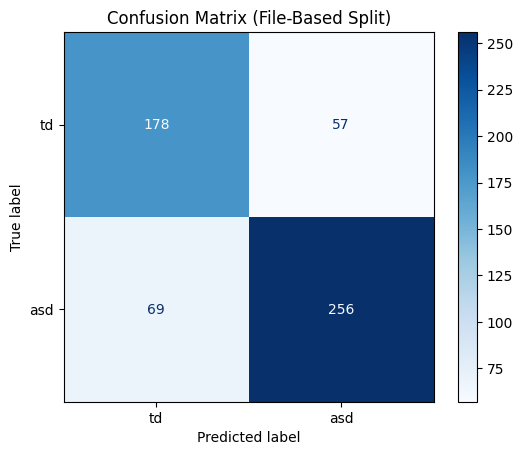

In [ ]:
# @title
import pandas as pd
import numpy as np
import glob
import os
import matplotlib.pyplot as plt
import warnings

# --- scikit-learn (ML) Imports ---
# Import train_test_split
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import (
    accuracy_score,
    classification_report,
    ConfusionMatrixDisplay
)
from sklearn.impute import SimpleImputer # Handles any potential missing values

# ========= CONFIGURATION =========

# 1. The main folder containing your 56 CSV files
# --- THIS LINE WAS CHANGED ---
base_folder = "/content/drive/MyDrive/Design_Project/Final_label2"

# 3. The name of your "label" column in the CSVs
TARGET_COLUMN = 'Group'

# 4. How to map your text labels to numbers (1 = Autism, 0 = Control)
LABEL_MAP = {
    'asd': 1,
    'td': 0
}
# =================================

def load_data_from_file_list(list_of_files):
    """Loads and concatenates a list of CSV file paths."""
    all_dfs = []
    for file_path in list_of_files:
        try:
            df = pd.read_csv(file_path)
            all_dfs.append(df)
        except Exception as e:
            print(f"Error loading {file_path}: {e}")

    if not all_dfs:
        return pd.DataFrame()

    return pd.concat(all_dfs, ignore_index=True)

def run_80_20_file_split():
    """
    Loads all CSVs from the base_folder, splits the FILE LIST 80/20,
    and runs the model once.
    """
    warnings.filterwarnings("ignore")

    # --- STEP 1: Get list of all CSV files ---
    print(f"Finding all '*_LABELED.csv' files in: {base_folder}")

    glob_pattern = os.path.join(base_folder, "*_LABELED.csv")
    csv_files = glob.glob(glob_pattern)

    if not csv_files:
        print(f"Error: No '*_LABELED.csv' files found in {base_folder}")
        print("Please check the 'base_folder' path.")
        return

    print(f"Found {len(csv_files)} total files.")

    # --- STEP 2: Perform 80/20 Split on the FILE LIST ---
    print("Splitting file list 80/20...")

    train_files, test_files = train_test_split(
        csv_files,
        test_size=0.20,       # 20% of files for test
        random_state=42       # For reproducible split
    )

    print(f"Using {len(train_files)} files for TRAINING.")
    print(f"Using {len(test_files)} files for TESTING.")

    # --- STEP 3: Load Data from the file lists ---
    print("Loading training data...")
    train_df = load_data_from_file_list(train_files)

    print("Loading testing data...")
    test_df = load_data_from_file_list(test_files)

    if train_df.empty or test_df.empty:
        print("Error: No data loaded for train or test set. Exiting.")
        return

    print(f"Total training data shape (segments, features): {train_df.shape}")
    print(f"Total testing data shape (segments, features): {test_df.shape}")

    # --- STEP 4: Prepare Data (X and y) ---
    print("Preparing data...")

    # 1. Map text labels ('asd'/'td') to numbers (1/0)
    y_train = train_df[TARGET_COLUMN].map(LABEL_MAP)
    y_test = test_df[TARGET_COLUMN].map(LABEL_MAP)

    # 2. Get features by dropping the label
    X_train = train_df.drop(columns=[TARGET_COLUMN])
    X_test = test_df.drop(columns=[TARGET_COLUMN])

    # --- STEP 5: Preprocessing Pipeline ---
    print("Preprocessing and scaling...")

    # 1. Convert any text columns (like 'Gender') to numbers
    X_train = pd.get_dummies(X_train, drop_first=True)
    X_test = pd.get_dummies(X_test, drop_first=True)

    # 2. Align columns: Ensures test has same columns as train
    X_train, X_test = X_train.align(X_test, join='left', axis=1, fill_value=0)

    # 3. Handle any potential missing (NaN) values
    imputer = SimpleImputer(strategy='constant', fill_value=0)
    X_train = imputer.fit_transform(X_train)
    X_test = imputer.transform(X_test)

    # 4. Feature Scaling (CRITICAL!)
    scaler = StandardScaler()
    scaler.fit(X_train) # Fit ONLY on training data
    X_train_scaled = scaler.transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # --- STEP 6: Train the Model ---
    print("Training Random Forest model...")

    model = RandomForestClassifier(
        n_estimators=100,      # Using 100 trees for a robust model
        random_state=42,       # For reproducible results
        class_weight='balanced'
    )
    model.fit(X_train_scaled, y_train)

    # --- STEP 7: Test (Evaluate) ---
    print("Evaluating model on the 20% test files...")
    y_pred = model.predict(X_test_scaled)

    # Calculate metrics
    acc = accuracy_score(y_test, y_pred)
    report_string = classification_report(
        y_test,
        y_pred,
        target_names=[key for key, val in LABEL_MAP.items() if val == 0] +
                     [key for key, val in LABEL_MAP.items() if val == 1]
    )

    print(f"\n--- Final Model Results (80/20 File-Based Split) ---")
    print(f"Accuracy: {acc * 100:.2f}%")
    print("Classification Report:")
    print(report_string)

    # Plot and show the confusion matrix
    ConfusionMatrixDisplay.from_predictions(
        y_test,
        y_pred,
        display_labels=[key for key, val in LABEL_MAP.items() if val == 0] +
                         [key for key, val in LABEL_MAP.items() if val == 1],
        cmap='Blues'
    )
    plt.title("Confusion Matrix (File-Based Split)")
    plt.show()

# --- Run the main training function ---
if __name__ == "__main__":
    run_80_20_file_split() # Call the new function

**Seg+DWT 5sec + 4sec overlap**

In [ ]:
# @title
import numpy as np
import pandas as pd
import pywt
from scipy.stats import entropy as shannon_entropy
import warnings
import mne
import glob
import os
import re

# ========= CONFIGURATION =========

# 1. Source of the clean .set files
input_folder = "/content/drive/MyDrive/Design_Project/cleaned_output_data"

# 2. The metadata file with patient info
metadata_file = "/content/drive/MyDrive/Design_Project/metadata.csv"

# 3. The FINAL output folder for the labeled CSVs
output_folder = "/content/drive/MyDrive/Design_Project/Seg_DWT_data25sec"

# 4. Metadata columns to add from the .csv
METADATA_COLS = ['AgeMonths', 'Group', 'Gender', 'SRS_Total']

# 5. Segmentation Settings (from your last script)
SEGMENT_DURATION_SEC = 5.0
OVERLAP_DURATION_SEC = 4.0

# 6. DWT Settings
wavelet = 'db4'
dwt_level = 4
band_names = ['Delta_Theta', 'Alpha', 'Beta', 'Gamma_1', 'Gamma_2']

# =================================

def calculate_shannon_entropy(data, n_bins=10):
    counts, _ = np.histogram(data, bins=n_bins)
    probabilities = counts / len(data)
    probabilities = probabilities[probabilities > 0]
    return shannon_entropy(probabilities, base=2)

def run_feature_extraction_and_labeling():
    """
    Main function to run the combined process.
    """
    warnings.filterwarnings("ignore")

    # --- 1. SETUP ---
    # Create the final output folder if it doesn't exist
    os.makedirs(output_folder, exist_ok=True)
    print(f"Output folder is ready at: {output_folder}")

    # --- 2. LOAD METADATA ONCE ---
    try:
        meta = pd.read_csv(metadata_file)
        meta['ParticipantID'] = meta['ParticipantID'].astype(int)
        print(f"Successfully loaded metadata for {len(meta)} participants.")
    except FileNotFoundError:
        print(f"❌ ERROR: Metadata file not found at: {metadata_file}")
        return
    except KeyError:
        print(f"❌ ERROR: 'ParticipantID' column not found in {metadata_file}.")
        return

    # --- 3. GET LIST OF EEG FILES ---
    files = sorted(glob.glob(os.path.join(input_folder, "*.set")))
    print(f"Found {len(files)} EEG files to process.")

    success_count = 0
    fail_count = 0

    # --- 4. LOOP AND PROCESS EACH FILE ---
    for file_path in files:
        base_name = os.path.basename(file_path)
        print(f"\n===============================")
        print(f"Processing: {base_name}")
        print(f"===============================")

        try:
            # --- A. Extract Patient ID & Get Metadata ---
            match = re.match(r"(\d+)", base_name)
            if not match:
                print(f"  SKIPPING: Cannot extract patient ID from filename: {base_name}")
                fail_count += 1
                continue

            patient_id = int(match.group(1))

            row = meta[meta['ParticipantID'] == patient_id]
            if row.empty:
                print(f"  SKIPPING: No metadata found in {metadata_file} for ID: {patient_id}")
                fail_count += 1
                continue

            patient_metadata = row.iloc[0]

            # --- B. Load EEG ---
            raw_clean = mne.io.read_raw_eeglab(file_path, preload=True)
            ch_names = raw_clean.info['ch_names']
            print(f"  Loaded EEG data, {len(ch_names)} channels.")

            # --- C. Downsample & Segment ---
            raw_clean.resample(256)
            epochs = mne.make_fixed_length_epochs(
                raw_clean,
                duration=SEGMENT_DURATION_SEC,
                overlap=OVERLAP_DURATION_SEC,
                preload=True
            )
            print(f"  Created {len(epochs)} segments.")

            # --- D. DWT & Feature Extraction ---
            all_rows = []
            for i, segment_data in enumerate(epochs):
                row_features = {}
                for ch_index, ch_name in enumerate(ch_names):
                    ch_data = segment_data[ch_index]
                    coeffs = pywt.wavedec(ch_data, wavelet, level=dwt_level)

                    for band_index, band_name in enumerate(band_names):
                        band_coeffs = coeffs[band_index]
                        row_features[f"{ch_name}_{band_name}_Entropy"] = calculate_shannon_entropy(band_coeffs)

                all_rows.append(row_features)

            print(f"  Feature extraction complete for {len(all_rows)} segments.")

            # --- E. Create DataFrame and ADD METADATA ---
            df = pd.DataFrame(all_rows)

            print(f"  Adding metadata columns...")
            for col in METADATA_COLS:
                if col in patient_metadata:
                    df[col] = patient_metadata[col]
                else:
                    print(f"  WARNING: Metadata column '{col}' not found. Skipping this column.")

            # --- F. Save FINAL Labeled File ---
            subject_name = base_name.replace(".set", "")
            output_filename = f"{subject_name}_features_LABELED.csv"
            output_path = os.path.join(output_folder, output_filename)

            df.to_csv(output_path, index=False)
            print(f"  ✅ Saved labeled file to {output_folder}")
            print(f"  Shape: {df.shape}")
            success_count += 1

        except Exception as e:
            print(f"  ❌ UNEXPECTED ERROR processing file {base_name}: {e}")
            fail_count += 1

    print("\n--- All Done! ---")
    print(f"Successfully processed and labeled: {success_count} files.")
    print(f"Failed or skipped: {fail_count} files.")

# --- Run the main function ---
if __name__ == "__main__":
    run_feature_extraction_and_labeling()

Output folder is ready at: /content/drive/MyDrive/Design_Project/Seg_DWT_data25sec
Successfully loaded metadata for 56 participants.
Found 56 EEG files to process.

Processing: 10Abby_Resting_cleanedICACLEAN_subject.set
Reading /content/drive/MyDrive/Design_Project/cleaned_output_data/10Abby_Resting_cleanedICACLEAN_subject.fdt
Reading 0 ... 81920  =      0.000 ...   160.000 secs...
  Loaded EEG data, 59 channels.
Not setting metadata
156 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 156 events and 1280 original time points ...
0 bad epochs dropped
  Created 156 segments.
  Feature extraction complete for 156 segments.
  Adding metadata columns...
  ✅ Saved labeled file to /content/drive/MyDrive/Design_Project/Seg_DWT_data25sec
  Shape: (156, 297)

Processing: 11Abby_Resting_cleanedICACLEAN_subject.set
Reading /content/drive/MyDrive/Design_Project/cleaned_output_data/11Abby_Resting_cleanedICACLEAN_subject.fdt
Reading 

**80/20 aplit test alone on 5sec + 4 overlap**

Finding all '*_LABELED.csv' files in: /content/drive/MyDrive/Design_Project/Seg_DWT_data25sec
Found 56 total files.
Splitting file list 80/20...
Using 44 files for TRAINING.
Using 12 files for TESTING.
Loading training data...
Loading testing data...
Total training data shape (segments, features): (6864, 617)
Total testing data shape (segments, features): (1858, 617)
Preparing data...
Preprocessing and scaling...
Training Random Forest model...
Evaluating model on the 20% test files...

--- Final Model Results (80/20 File-Based Split) ---
Accuracy: 79.17%
Classification Report:
              precision    recall  f1-score   support

          td       0.85      0.62      0.71       780
         asd       0.77      0.92      0.84      1078

    accuracy                           0.79      1858
   macro avg       0.81      0.77      0.77      1858
weighted avg       0.80      0.79      0.78      1858



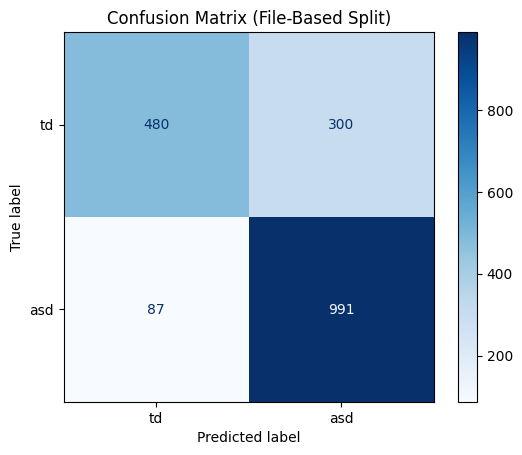

In [ ]:
# @title
import pandas as pd
import numpy as np
import glob
import os
import matplotlib.pyplot as plt
import warnings

# --- scikit-learn (ML) Imports ---
# Import train_test_split
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import (
    accuracy_score,
    classification_report,
    ConfusionMatrixDisplay
)
from sklearn.impute import SimpleImputer # Handles any potential missing values

# ========= CONFIGURATION =========

# 1. The main folder containing your 56 CSV files
base_folder = "/content/drive/MyDrive/Design_Project/Seg_DWT_data25sec"

# 3. The name of your "label" column in the CSVs
TARGET_COLUMN = 'Group'

# 4. How to map your text labels to numbers (1 = Autism, 0 = Control)
LABEL_MAP = {
    'asd': 1,
    'td': 0
}
# =================================

def load_data_from_file_list(list_of_files):
    """Loads and concatenates a list of CSV file paths."""
    all_dfs = []
    for file_path in list_of_files:
        try:
            df = pd.read_csv(file_path)
            all_dfs.append(df)
        except Exception as e:
            print(f"Error loading {file_path}: {e}")

    if not all_dfs:
        return pd.DataFrame()

    return pd.concat(all_dfs, ignore_index=True)

def run_80_20_file_split():
    """
    Loads all CSVs from the base_folder, splits the FILE LIST 80/20,
    and runs the model once.
    """
    warnings.filterwarnings("ignore")

    # --- STEP 1: Get list of all CSV files ---
    print(f"Finding all '*_LABELED.csv' files in: {base_folder}")

    glob_pattern = os.path.join(base_folder, "*_LABELED.csv")
    csv_files = glob.glob(glob_pattern)

    if not csv_files:
        print(f"Error: No '*_LABELED.csv' files found in {base_folder}")
        print("Please check the 'base_folder' path.")
        return

    print(f"Found {len(csv_files)} total files.")

    # --- STEP 2: Perform 80/20 Split on the FILE LIST ---
    print("Splitting file list 80/20...")

    train_files, test_files = train_test_split(
        csv_files,
        test_size=0.20,       # 20% of files for test
        random_state=42       # For reproducible split
    )

    print(f"Using {len(train_files)} files for TRAINING.")
    print(f"Using {len(test_files)} files for TESTING.")

    # --- STEP 3: Load Data from the file lists ---
    print("Loading training data...")
    train_df = load_data_from_file_list(train_files)

    print("Loading testing data...")
    test_df = load_data_from_file_list(test_files)

    if train_df.empty or test_df.empty:
        print("Error: No data loaded for train or test set. Exiting.")
        return

    print(f"Total training data shape (segments, features): {train_df.shape}")
    print(f"Total testing data shape (segments, features): {test_df.shape}")

    # --- STEP 4: Prepare Data (X and y) ---
    print("Preparing data...")

    # 1. Map text labels ('asd'/'td') to numbers (1/0)
    y_train = train_df[TARGET_COLUMN].map(LABEL_MAP)
    y_test = test_df[TARGET_COLUMN].map(LABEL_MAP)

    # 2. Get features by dropping the label
    X_train = train_df.drop(columns=[TARGET_COLUMN])
    X_test = test_df.drop(columns=[TARGET_COLUMN])

    # --- STEP 5: Preprocessing Pipeline ---
    print("Preprocessing and scaling...")

    # 1. Convert any text columns (like 'Gender') to numbers
    X_train = pd.get_dummies(X_train, drop_first=True)
    X_test = pd.get_dummies(X_test, drop_first=True)

    # 2. Align columns: Ensures test has same columns as train
    X_train, X_test = X_train.align(X_test, join='left', axis=1, fill_value=0)

    # 3. Handle any potential missing (NaN) values
    imputer = SimpleImputer(strategy='constant', fill_value=0)
    X_train = imputer.fit_transform(X_train)
    X_test = imputer.transform(X_test)

    # 4. Feature Scaling (CRITICAL!)
    scaler = StandardScaler()
    scaler.fit(X_train) # Fit ONLY on training data
    X_train_scaled = scaler.transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # --- STEP 6: Train the Model ---
    print("Training Random Forest model...")

    model = RandomForestClassifier(
        n_estimators=100,      # Using 100 trees for a robust model
        random_state=42,       # For reproducible results
        class_weight='balanced'
    )
    model.fit(X_train_scaled, y_train)

    # --- STEP 7: Test (Evaluate) ---
    print("Evaluating model on the 20% test files...")
    y_pred = model.predict(X_test_scaled)

    # Calculate metrics
    acc = accuracy_score(y_test, y_pred)
    report_string = classification_report(
        y_test,
        y_pred,
        target_names=[key for key, val in LABEL_MAP.items() if val == 0] +
                     [key for key, val in LABEL_MAP.items() if val == 1]
    )

    print(f"\n--- Final Model Results (80/20 File-Based Split) ---")
    print(f"Accuracy: {acc * 100:.2f}%")
    print("Classification Report:")
    print(report_string)

    # Plot and show the confusion matrix
    ConfusionMatrixDisplay.from_predictions(
        y_test,
        y_pred,
        display_labels=[key for key, val in LABEL_MAP.items() if val == 0] +
                         [key for key, val in LABEL_MAP.items() if val == 1],
        cmap='Blues'
    )
    plt.title("Confusion Matrix (File-Based Split)")
    plt.show()

# --- Run the main training function ---
if __name__ == "__main__":
    run_80_20_file_split() # Call the new function

 **80/20 split test on 5sec/4overlap + whole**

In [ ]:
# @title
import pandas as pd
import numpy as np
import glob
import os
import matplotlib.pyplot as plt
import warnings

# --- scikit-learn (ML) Imports ---
# Import train_test_split
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import (
    accuracy_score,
    classification_report,
    ConfusionMatrixDisplay
)
from sklearn.impute import SimpleImputer # Handles any potential missing values

# ========= CONFIGURATION =========

# 1. The main folder containing your 56 CSV files
base_folder = "/content/drive/MyDrive/Design_Project/Seg_DWT_data25sec"

# 2. The folder with the corresponding "whole" data files
additional_data_folder = "/content/drive/MyDrive/Design_Project/Whole_eeg"

# 3. The name of your "label" column in the CSVs
TARGET_COLUMN = 'Group'

# 4. How to map your text labels to numbers (1 = Autism, 0 = Control)
LABEL_MAP = {
    'asd': 1,
    'td': 0
}
# =================================

def load_data_from_file_list(list_of_files, additional_folder):
    """
    Loads and concatenates a list of CSV file paths.
    Also finds and merges corresponding files from 'additional_folder'.
    """
    all_dfs = []
    for file_path in list_of_files:
        try:
            # 1. Load the main features file
            df_main = pd.read_csv(file_path)

            # 2. Construct the path for the additional file
            file_name = os.path.basename(file_path)
            base_name = file_name.replace("_features_LABELED.csv", "")
            additional_file_name = f"{base_name}_whole.csv"
            additional_file_path = os.path.join(additional_folder, additional_file_name)

            # 3. Load the additional file if it exists
            if os.path.exists(additional_file_path):
                df_additional = pd.read_csv(additional_file_path)

                # 4. Prepare for join: Drop the target column from the additional file
                #    (if it exists) to avoid conflicts.
                df_additional_features = df_additional.drop(columns=[TARGET_COLUMN], errors='ignore')

                # --- FIX: Rename additional columns to guarantee uniqueness ---
                # This prevents the "InvalidIndexError"
                num_cols = len(df_additional_features.columns)
                new_cols = [f"add_feat_{i}" for i in range(num_cols)]
                df_additional_features.columns = new_cols
                # --- End Fix ---

                # 5. Combine side-by-side (axis=1).
                #    This assumes rows are in the same order in both files.
                combined_df = pd.concat([df_main, df_additional_features], axis=1)
                all_dfs.append(combined_df)

            else:
                print(f"Warning: No corresponding file found at {additional_file_path}")
                print(f"         Skipping main file: {file_path}")

        except Exception as e:
            print(f"Error loading or combining {file_path}: {e}")

    if not all_dfs:
        return pd.DataFrame()

    return pd.concat(all_dfs, ignore_index=True)

def run_80_20_file_split():
    """
    Loads all CSVs from the base_folder, splits the FILE LIST 80/20,
    loads corresponding data, and runs the model once.
    """
    warnings.filterwarnings("ignore")

    # --- STEP 1: Get list of all CSV files ---
    print(f"Finding all '*_features_LABELED.csv' files in: {base_folder}")

    # Updated glob pattern to be more specific
    glob_pattern = os.path.join(base_folder, "*_features_LABELED.csv")
    csv_files = glob.glob(glob_pattern)

    if not csv_files:
        print(f"Error: No '*_features_LABELED.csv' files found in {base_folder}")
        print("Please check the 'base_folder' path and file naming.")
        return

    print(f"Found {len(csv_files)} total files.")

    # --- STEP 2: Perform 80/20 Split on the FILE LIST ---
    print("Splitting file list 80/20...")

    train_files, test_files = train_test_split(
        csv_files,
        test_size=0.20,       # 20% of files for test
        random_state=42       # For reproducible split
    )

    print(f"Using {len(train_files)} files for TRAINING.")
    print(f"Using {len(test_files)} files for TESTING.")

    # --- STEP 3: Load Data from the file lists ---
    print("Loading training data (main + additional)...")
    train_df = load_data_from_file_list(train_files, additional_data_folder)

    print("Loading testing data (main + additional)...")
    test_df = load_data_from_file_list(test_files, additional_data_folder)

    if train_df.empty or test_df.empty:
        print("Error: No data loaded for train or test set. Exiting.")
        return

    print(f"Total training data shape (segments, features): {train_df.shape}")
    print(f"Total testing data shape (segments, features): {test_df.shape}")

    # --- STEP 4: Prepare Data (X and y) ---
    print("Preparing data...")

    # 1. Map text labels ('asd'/'td') to numbers (1/0)
    y_train = train_df[TARGET_COLUMN].map(LABEL_MAP)
    y_test = test_df[TARGET_COLUMN].map(LABEL_MAP)

    # 2. Get features by dropping the label
    X_train = train_df.drop(columns=[TARGET_COLUMN])
    X_test = test_df.drop(columns=[TARGET_COLUMN])

    # --- STEP 5: Preprocessing Pipeline ---
    print("Preprocessing and scaling...")

    # 1. Convert any text columns (like 'Gender') to numbers
    X_train = pd.get_dummies(X_train, drop_first=True)
    X_test = pd.get_dummies(X_test, drop_first=True)

    # 2. Align columns: Ensures test has same columns as train
    X_train, X_test = X_train.align(X_test, join='left', axis=1, fill_value=0)

    # 3. Handle any potential missing (NaN) values
    imputer = SimpleImputer(strategy='constant', fill_value=0)
    X_train = imputer.fit_transform(X_train)
    X_test = imputer.transform(X_test)

    # 4. Feature Scaling (CRITICAL!)
    scaler = StandardScaler()
    scaler.fit(X_train) # Fit ONLY on training data
    X_train_scaled = scaler.transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # --- STEP 6: Train the Model ---
    print("Training Random Forest model...")

    model = RandomForestClassifier(
        n_estimators=100,      # Using 100 trees for a robust model
        random_state=42,       # For reproducible results
        class_weight='balanced'
    )
    model.fit(X_train_scaled, y_train)

    # --- STEP 7: Test (Evaluate) ---
    print("Evaluating model on the 20% test files...")
    y_pred = model.predict(X_test_scaled)

    # Calculate metrics
    acc = accuracy_score(y_test, y_pred)
    report_string = classification_report(
        y_test,
        y_pred,
        target_names=[key for key, val in LABEL_MAP.items() if val == 0] +
                     [key for key, val in LABEL_MAP.items() if val == 1]
    )

    print(f"\n--- Final Model Results (80/20 File-Based Split) ---")
    print(f"Accuracy: {acc * 100:.2f}%")
    print("Classification Report:")
    print(report_string)

    # Plot and show the confusion matrix
    ConfusionMatrixDisplay.from_predictions(
        y_test,
        y_pred,
        display_labels=[key for key, val in LABEL_MAP.items() if val == 0] +
                         [key for key, val in LABEL_MAP.items() if val == 1],
        cmap='Blues'
    )
    plt.title("Confusion Matrix (File-Based Split)")
    plt.show()

# --- Run the main training function ---
if __name__ == "__main__":
    run_80_20_file_split() # Call the new function

Finding all '*_features_LABELED.csv' files in: /content/drive/MyDrive/Design_Project/Seg_DWT_data25sec
Error: No '*_features_LABELED.csv' files found in /content/drive/MyDrive/Design_Project/Seg_DWT_data25sec
Please check the 'base_folder' path and file naming.


In [ ]:
# @title
!pip install mne
import numpy as np
import pandas as pd
import pywt
from scipy.stats import entropy as shannon_entropy
import warnings
import mne
import glob
import os
import re

# ========= CONFIGURATION =========

# 1. Source of the clean .set files
input_folder = "/content/drive/MyDrive/Design_Project/cleaned_output_data"

# 2. The metadata file with patient info
metadata_file = "/content/drive/MyDrive/Design_Project/metadata.csv"

# 3. The FINAL output folder for the labeled CSVs
output_folder = "/content/drive/MyDrive/Design_Project/Seg_DWT_label_5+4"

# 4. Metadata columns to add from the .csv
METADATA_COLS = ['AgeMonths', 'Group', 'Gender', 'SRS_Total']

# 5. Segmentation Settings (from your last script)
SEGMENT_DURATION_SEC = 5
OVERLAP_DURATION_SEC = 4

# 6. DWT Settings
wavelet = 'db4'
dwt_level = 4
band_names = ['Delta_Theta', 'Alpha', 'Beta', 'Gamma_1', 'Gamma_2']

# =================================

def calculate_shannon_entropy(data, n_bins=10):
    counts, _ = np.histogram(data, bins=n_bins)
    probabilities = counts / len(data)
    probabilities = probabilities[probabilities > 0]
    return shannon_entropy(probabilities, base=2)

def run_feature_extraction_and_labeling():
    """
    Main function to run the combined process.
    """
    warnings.filterwarnings("ignore")

    # --- 1. SETUP ---
    # Create the final output folder if it doesn't exist
    os.makedirs(output_folder, exist_ok=True)
    print(f"Output folder is ready at: {output_folder}")

    # --- 2. LOAD METADATA ONCE ---
    try:
        meta = pd.read_csv(metadata_file)
        meta['ParticipantID'] = meta['ParticipantID'].astype(int)
        print(f"Successfully loaded metadata for {len(meta)} participants.")
    except FileNotFoundError:
        print(f"❌ ERROR: Metadata file not found at: {metadata_file}")
        return
    except KeyError:
        print(f"❌ ERROR: 'ParticipantID' column not found in {metadata_file}.")
        return

    # --- 3. GET LIST OF EEG FILES ---
    files = sorted(glob.glob(os.path.join(input_folder, "*.set")))
    print(f"Found {len(files)} EEG files to process.")

    success_count = 0
    fail_count = 0

    # --- 4. LOOP AND PROCESS EACH FILE ---
    for file_path in files:
        base_name = os.path.basename(file_path)
        print(f"\n===============================")
        print(f"Processing: {base_name}")
        print(f"===============================")

        try:
            # --- A. Extract Patient ID & Get Metadata ---
            match = re.match(r"(\d+)", base_name)
            if not match:
                print(f"  SKIPPING: Cannot extract patient ID from filename: {base_name}")
                fail_count += 1
                continue

            patient_id = int(match.group(1))

            row = meta[meta['ParticipantID'] == patient_id]
            if row.empty:
                print(f"  SKIPPING: No metadata found in {metadata_file} for ID: {patient_id}")
                fail_count += 1
                continue

            patient_metadata = row.iloc[0]

            # --- B. Load EEG ---
            raw_clean = mne.io.read_raw_eeglab(file_path, preload=True)
            ch_names = raw_clean.info['ch_names']
            print(f"  Loaded EEG data, {len(ch_names)} channels.")

            # --- C. Downsample & Segment ---
            raw_clean.resample(256)
            epochs = mne.make_fixed_length_epochs(
                raw_clean,
                duration=SEGMENT_DURATION_SEC,
                overlap=OVERLAP_DURATION_SEC,
                preload=True
            )
            print(f"  Created {len(epochs)} segments.")

            # --- D. DWT & Feature Extraction ---
            all_rows = []
            for i, segment_data in enumerate(epochs):
                row_features = {}
                for ch_index, ch_name in enumerate(ch_names):
                    ch_data = segment_data[ch_index]
                    coeffs = pywt.wavedec(ch_data, wavelet, level=dwt_level)

                    for band_index, band_name in enumerate(band_names):
                        band_coeffs = coeffs[band_index]
                        row_features[f"{ch_name}_{band_name}_Entropy"] = calculate_shannon_entropy(band_coeffs)

                all_rows.append(row_features)

            print(f"  Feature extraction complete for {len(all_rows)} segments.")

            # --- E. Create DataFrame and ADD METADATA ---
            df = pd.DataFrame(all_rows)

            print(f"  Adding metadata columns...")
            for col in METADATA_COLS:
                if col in patient_metadata:
                    df[col] = patient_metadata[col]
                else:
                    print(f"  WARNING: Metadata column '{col}' not found. Skipping this column.")

            # --- F. Save FINAL Labeled File ---
            subject_name = base_name.replace(".set", "")
            output_filename = f"{subject_name}_features_LABELED.csv"
            output_path = os.path.join(output_folder, output_filename)

            df.to_csv(output_path, index=False)
            print(f"  ✅ Saved labeled file to {output_folder}")
            print(f"  Shape: {df.shape}")
            success_count += 1

        except Exception as e:
            print(f"  ❌ UNEXPECTED ERROR processing file {base_name}: {e}")
            fail_count += 1

    print("\n--- All Done! ---")
    print(f"Successfully processed and labeled: {success_count} files.")
    print(f"Failed or skipped: {fail_count} files.")

# --- Run the main function ---
if __name__ == "__main__":
    run_feature_extraction_and_labeling()

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.4/7.4 MB 89.7 MB/s eta 0:00:00
Output folder is ready at: /content/drive/MyDrive/Design_Project/Seg_DWT_label_5+4
Successfully loaded metadata for 56 participants.
Found 56 EEG files to process.

Processing: 10Abby_Resting_cleanedICACLEAN_subject.set
Reading /content/drive/MyDrive/Design_Project/cleaned_output_data/10Abby_Resting_cleanedICACLEAN_subject.fdt
Reading 0 ... 81920  =      0.000 ...   160.000 secs...
  Loaded EEG data, 59 channels.
Not setting metadata
156 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 156 events and 1280 original time points ...
0 bad epochs dropped
  Created 156 segments.
  Feature extraction complete for 156 segments.
  Adding metadata columns...
  ✅ Saved labeled file to /content/drive/MyDrive/Design_Project/Seg_DWT_label_5+4
  Shape: (156, 297)

Processing: 11Abby_Resting_cleanedICACLEAN_subject.set
Reading /content/drive/MyDrive/Design_Pr

Finding all '*_LABELED.csv' files in: /content/drive/MyDrive/Design_Project/Seg_DWT_label_5+4
Found 56 total files.
Splitting file list 80/20...
Using 44 files for TRAINING.
Using 12 files for TESTING.
Loading training data...
Loading testing data...
Total training data shape (segments, features): (6864, 617)
Total testing data shape (segments, features): (1858, 617)
Preparing data...
Preprocessing and scaling...
Training Random Forest model...
Evaluating model on the 20% test files...

--- Final Model Results (80/20 File-Based Split) ---
Accuracy: 79.17%
Classification Report:
              precision    recall  f1-score   support

          td       0.85      0.62      0.71       780
         asd       0.77      0.92      0.84      1078

    accuracy                           0.79      1858
   macro avg       0.81      0.77      0.77      1858
weighted avg       0.80      0.79      0.78      1858



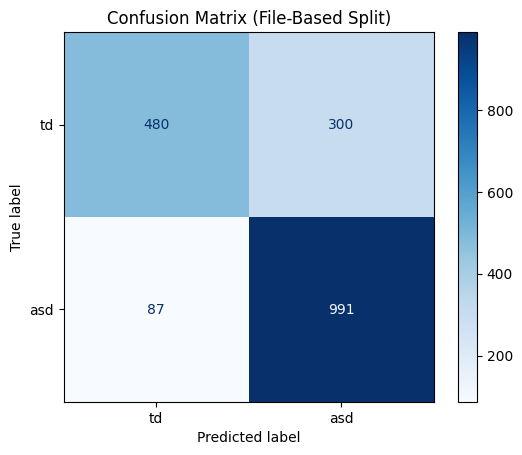

In [ ]:
# @title
import pandas as pd
import numpy as np
import glob
import os
import matplotlib.pyplot as plt
import warnings

# --- scikit-learn (ML) Imports ---
# Import train_test_split
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import (
    accuracy_score,
    classification_report,
    ConfusionMatrixDisplay
)
from sklearn.impute import SimpleImputer # Handles any potential missing values

# ========= CONFIGURATION =========

# 1. The main folder containing your 56 CSV files
base_folder = "/content/drive/MyDrive/Design_Project/Seg_DWT_label_5+4"

# 3. The name of your "label" column in the CSVs
TARGET_COLUMN = 'Group'

# 4. How to map your text labels to numbers (1 = Autism, 0 = Control)
LABEL_MAP = {
    'asd': 1,
    'td': 0
}
# =================================

def load_data_from_file_list(list_of_files):
    """Loads and concatenates a list of CSV file paths."""
    all_dfs = []
    for file_path in list_of_files:
        try:
            df = pd.read_csv(file_path)
            all_dfs.append(df)
        except Exception as e:
            print(f"Error loading {file_path}: {e}")

    if not all_dfs:
        return pd.DataFrame()

    return pd.concat(all_dfs, ignore_index=True)

def run_80_20_file_split():
    """
    Loads all CSVs from the base_folder, splits the FILE LIST 80/20,
    and runs the model once.
    """
    warnings.filterwarnings("ignore")

    # --- STEP 1: Get list of all CSV files ---
    print(f"Finding all '*_LABELED.csv' files in: {base_folder}")

    glob_pattern = os.path.join(base_folder, "*_LABELED.csv")
    csv_files = glob.glob(glob_pattern)

    if not csv_files:
        print(f"Error: No '*_LABELED.csv' files found in {base_folder}")
        print("Please check the 'base_folder' path.")
        return

    print(f"Found {len(csv_files)} total files.")

    # --- STEP 2: Perform 80/20 Split on the FILE LIST ---
    print("Splitting file list 80/20...")

    train_files, test_files = train_test_split(
        csv_files,
        test_size=0.20,       # 20% of files for test
        random_state=42       # For reproducible split
    )

    print(f"Using {len(train_files)} files for TRAINING.")
    print(f"Using {len(test_files)} files for TESTING.")

    # --- STEP 3: Load Data from the file lists ---
    print("Loading training data...")
    train_df = load_data_from_file_list(train_files)

    print("Loading testing data...")
    test_df = load_data_from_file_list(test_files)

    if train_df.empty or test_df.empty:
        print("Error: No data loaded for train or test set. Exiting.")
        return

    print(f"Total training data shape (segments, features): {train_df.shape}")
    print(f"Total testing data shape (segments, features): {test_df.shape}")

    # --- STEP 4: Prepare Data (X and y) ---
    print("Preparing data...")

    # 1. Map text labels ('asd'/'td') to numbers (1/0)
    y_train = train_df[TARGET_COLUMN].map(LABEL_MAP)
    y_test = test_df[TARGET_COLUMN].map(LABEL_MAP)

    # 2. Get features by dropping the label
    X_train = train_df.drop(columns=[TARGET_COLUMN])
    X_test = test_df.drop(columns=[TARGET_COLUMN])

    # --- STEP 5: Preprocessing Pipeline ---
    print("Preprocessing and scaling...")

    # 1. Convert any text columns (like 'Gender') to numbers
    X_train = pd.get_dummies(X_train, drop_first=True)
    X_test = pd.get_dummies(X_test, drop_first=True)

    # 2. Align columns: Ensures test has same columns as train
    X_train, X_test = X_train.align(X_test, join='left', axis=1, fill_value=0)

    # 3. Handle any potential missing (NaN) values
    imputer = SimpleImputer(strategy='constant', fill_value=0)
    X_train = imputer.fit_transform(X_train)
    X_test = imputer.transform(X_test)

    # 4. Feature Scaling (CRITICAL!)
    scaler = StandardScaler()
    scaler.fit(X_train) # Fit ONLY on training data
    X_train_scaled = scaler.transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # --- STEP 6: Train the Model ---
    print("Training Random Forest model...")

    model = RandomForestClassifier(
        n_estimators=100,      # Using 100 trees for a robust model
        random_state=42,       # For reproducible results
        class_weight='balanced'
    )
    model.fit(X_train_scaled, y_train)

    # --- STEP 7: Test (Evaluate) ---
    print("Evaluating model on the 20% test files...")
    y_pred = model.predict(X_test_scaled)

    # Calculate metrics
    acc = accuracy_score(y_test, y_pred)
    report_string = classification_report(
        y_test,
        y_pred,
        target_names=[key for key, val in LABEL_MAP.items() if val == 0] +
                     [key for key, val in LABEL_MAP.items() if val == 1]
    )

    print(f"\n--- Final Model Results (80/20 File-Based Split) ---")
    print(f"Accuracy: {acc * 100:.2f}%")
    print("Classification Report:")
    print(report_string)

    # Plot and show the confusion matrix
    ConfusionMatrixDisplay.from_predictions(
        y_test,
        y_pred,
        display_labels=[key for key, val in LABEL_MAP.items() if val == 0] +
                         [key for key, val in LABEL_MAP.items() if val == 1],
        cmap='Blues'
    )
    plt.title("Confusion Matrix (File-Based Split)")
    plt.show()

# --- Run the main training function ---
if __name__ == "__main__":
    run_80_20_file_split() # Call the new function

Finding all '*_LABELED.csv' files in: /content/drive/MyDrive/Design_Project/Seg_DWT_label_5+4
Found 56 total files.
Splitting file list 80/20...
Using 44 files for TRAINING.
Using 12 files for TESTING.
Loading training data...
Loading testing data...
Total training data shape (segments, features): (6864, 617)
Total testing data shape (segments, features): (1858, 617)
Preparing data...
Preprocessing and scaling...
Training SVM model...
Evaluating model on the 20% test files...

--- Final Model Results (80/20 File-Based Split, SVM) ---
Accuracy: 77.45%
Classification Report:
              precision    recall  f1-score   support

          td       0.83      0.58      0.68       780
         asd       0.75      0.92      0.83      1078

    accuracy                           0.77      1858
   macro avg       0.79      0.75      0.75      1858
weighted avg       0.79      0.77      0.77      1858



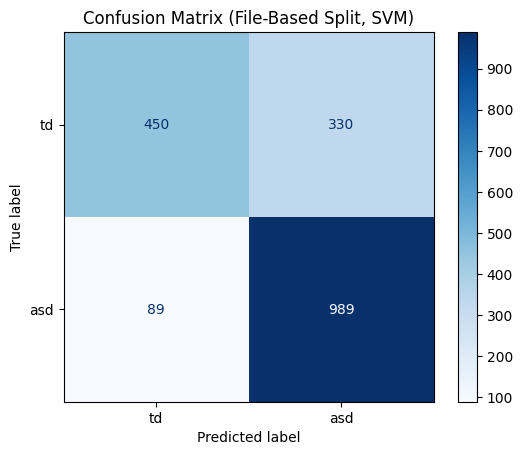

In [ ]:
# @title
import pandas as pd
import numpy as np
import glob
import os
import matplotlib.pyplot as plt
import warnings

# --- scikit-learn (ML) Imports ---
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.metrics import (
    accuracy_score,
    classification_report,
    ConfusionMatrixDisplay
)
from sklearn.impute import SimpleImputer # Handles any potential missing values

# ========= CONFIGURATION =========

# 1. The main folder containing your 56 CSV files
base_folder = "/content/drive/MyDrive/Design_Project/Seg_DWT_label_5+4"

# 3. The name of your "label" column in the CSVs
TARGET_COLUMN = 'Group'

# 4. How to map your text labels to numbers (1 = Autism, 0 = Control)
LABEL_MAP = {
    'asd': 1,
    'td': 0
}
# =================================

def load_data_from_file_list(list_of_files):
    """Loads and concatenates a list of CSV file paths."""
    all_dfs = []
    for file_path in list_of_files:
        try:
            df = pd.read_csv(file_path)
            all_dfs.append(df)
        except Exception as e:
            print(f"Error loading {file_path}: {e}")

    if not all_dfs:
        return pd.DataFrame()

    return pd.concat(all_dfs, ignore_index=True)

def run_80_20_file_split():
    """
    Loads all CSVs from the base_folder, splits the FILE LIST 80/20,
    and runs the model once.
    """
    warnings.filterwarnings("ignore")

    # --- STEP 1: Get list of all CSV files ---
    print(f"Finding all '*_LABELED.csv' files in: {base_folder}")

    glob_pattern = os.path.join(base_folder, "*_LABELED.csv")
    csv_files = glob.glob(glob_pattern)

    if not csv_files:
        print(f"Error: No '*_LABELED.csv' files found in {base_folder}")
        print("Please check the 'base_folder' path.")
        return

    print(f"Found {len(csv_files)} total files.")

    # --- STEP 2: Perform 80/20 Split on the FILE LIST ---
    print("Splitting file list 80/20...")

    train_files, test_files = train_test_split(
        csv_files,
        test_size=0.20,       # 20% of files for test
        random_state=42       # For reproducible split
    )

    print(f"Using {len(train_files)} files for TRAINING.")
    print(f"Using {len(test_files)} files for TESTING.")

    # --- STEP 3: Load Data from the file lists ---
    print("Loading training data...")
    train_df = load_data_from_file_list(train_files)

    print("Loading testing data...")
    test_df = load_data_from_file_list(test_files)

    if train_df.empty or test_df.empty:
        print("Error: No data loaded for train or test set. Exiting.")
        return

    print(f"Total training data shape (segments, features): {train_df.shape}")
    print(f"Total testing data shape (segments, features): {test_df.shape}")

    # --- STEP 4: Prepare Data (X and y) ---
    print("Preparing data...")

    # 1. Map text labels ('asd'/'td') to numbers (1/0)
    y_train = train_df[TARGET_COLUMN].map(LABEL_MAP)
    y_test = test_df[TARGET_COLUMN].map(LABEL_MAP)

    # 2. Get features by dropping the label
    X_train = train_df.drop(columns=[TARGET_COLUMN])
    X_test = test_df.drop(columns=[TARGET_COLUMN])

    # --- STEP 5: Preprocessing Pipeline ---
    print("Preprocessing and scaling...")

    # 1. Convert any text columns (like 'Gender') to numbers
    X_train = pd.get_dummies(X_train, drop_first=True)
    X_test = pd.get_dummies(X_test, drop_first=True)

    # 2. Align columns: Ensures test has same columns as train
    X_train, X_test = X_train.align(X_test, join='left', axis=1, fill_value=0)

    # 3. Handle any potential missing (NaN) values
    imputer = SimpleImputer(strategy='constant', fill_value=0)
    X_train = imputer.fit_transform(X_train)
    X_test = imputer.transform(X_test)

    # 4. Feature Scaling
    scaler = StandardScaler()
    scaler.fit(X_train) # Fit ONLY on training data
    X_train_scaled = scaler.transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # --- STEP 6: Train the Model ---
    print("Training SVM model...")

    model = SVC(
        kernel='rbf',
        probability=True,
        class_weight='balanced',
        C=1.0,
        gamma='scale',
        random_state=42
    )
    model.fit(X_train_scaled, y_train)

    # --- STEP 7: Test (Evaluate) ---
    print("Evaluating model on the 20% test files...")
    y_pred = model.predict(X_test_scaled)

    # Calculate metrics
    acc = accuracy_score(y_test, y_pred)
    report_string = classification_report(
        y_test,
        y_pred,
        target_names=[key for key, val in LABEL_MAP.items() if val == 0] +
                     [key for key, val in LABEL_MAP.items() if val == 1],
        zero_division=0
    )

    print(f"\n--- Final Model Results (80/20 File-Based Split, SVM) ---")
    print(f"Accuracy: {acc * 100:.2f}%")
    print("Classification Report:")
    print(report_string)

    # Plot and show the confusion matrix
    ConfusionMatrixDisplay.from_predictions(
        y_test,
        y_pred,
        display_labels=[key for key, val in LABEL_MAP.items() if val == 0] +
                         [key for key, val in LABEL_MAP.items() if val == 1],
        cmap='Blues'
    )
    plt.title("Confusion Matrix (File-Based Split, SVM)")
    plt.show()

# --- Run the main training function ---
if __name__ == "__main__":
    run_80_20_file_split() # Call the new function


# Trying Microstate shit

In [ ]:
!pip install -q pycrostates

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 169.9/169.9 kB 3.4 MB/s eta 0:00:00


All imports successful!
Loading clean EEG data from: /content/drive/MyDrive/Design_Project/cleaned_output_data/16Abby_Resting_cleanedICACLEAN_subject.set
Reading /content/drive/MyDrive/Design_Project/cleaned_output_data/16Abby_Resting_cleanedICACLEAN_subject.fdt
Reading 0 ... 81920  =      0.000 ...   160.000 secs...
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
Data loaded and average reference applied.
Finding 6 template microstate maps (A, B, C, D)...

--- VISUAL 1: The 4 Template Maps ---


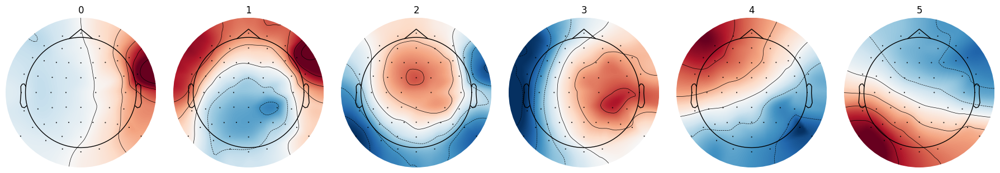


Labeling the entire recording with the 4 maps...

--- VISUAL 2: First 10 Seconds of Labeled Data ---


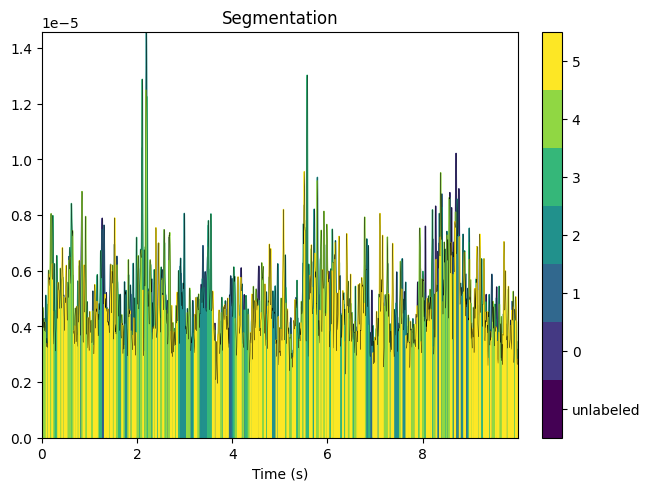


--- TEMPORARY OUTPUT: Microstate Features ---

1. Global Explained Variance (GEV): 43.22%
   (This is the 'goodness of fit'. It shows how well these 4 maps explain the total data.)

2. Coverage (Time Spent in Each State):
   - State 0 (Map 0): 15.99% of the time
   - State 1 (Map 1): 14.93% of the time
   - State 2 (Map 2): 15.52% of the time
   - State 3 (Map 3): 16.65% of the time
   - State 4 (Map 4): 19.15% of the time
   - State 5 (Map 5): 17.75% of the time

3. Mean Life Span (Average Duration of Each State):
   - State 0 (Map 0): 12.15 ms
   - State 1 (Map 1): 11.55 ms
   - State 2 (Map 2): 11.59 ms
   - State 3 (Map 3): 12.04 ms
   - State 4 (Map 4): 12.73 ms
   - State 5 (Map 5): 12.57 ms

4. Transition Matrix (Chance of switching from A -> B):
   - State 0 → State 1: 18.39% chance
   - State 0 → State 2: 17.68% chance
   - State 0 → State 3: 18.96% chance
   - State 0 → State 4: 25.95% chance
   - State 0 → State 5: 19.01% chance
   - State 1 → State 0: 16.38% chance
   - St

Traceback (most recent call last):
  File "/tmp/ipython-input-4018166878.py", line 107, in <cell line: 0>
    print(f"   - Occurrence (transitions per second): {params['occurrence']}")
                                                       ~~~~~~^^^^^^^^^^^^^^
KeyError: 'occurrence'


In [ ]:
# @title
# First, try to import everything
try:
    import mne
    import numpy as np
    import matplotlib.pyplot as plt
    import os
    import warnings
    from pycrostates.cluster import ModKMeans

    # --- FIX: Updated imports for current pycrostates API ---
    # These functions are now methods on the segmentation object, not standalone imports
    print("All imports successful!")

except ImportError as e:
    print("---")
    print(f"ERROR: Import failed - {e}")
    print("Please install pycrostates by running:")
    print("!pip install -q pycrostates")
    print("---")
    raise

# --- Configuration ---
# Your .fdt file path
file_path_fdt = "/content/drive/MyDrive/Design_Project/cleaned_output_data/16Abby_Resting_cleanedICACLEAN_subject.fdt"
# We need to tell MNE to load the .set file, not the .fdt
file_path_set = file_path_fdt.replace(".fdt", ".set")
N_CLUSTERS = 6 # The 4 canonical microstates (A, B, C, D)

# --- Main ---
warnings.filterwarnings("ignore")

try:
    print(f"Loading clean EEG data from: {file_path_set}")
    raw = mne.io.read_raw_eeglab(file_path_set, preload=True)

    # --- 1. Pre-process for Microstates ---
    # Microstate analysis MUST be done on an average reference.
    # We apply it to our loaded (already clean) data.
    raw.set_eeg_reference('average')
    print("Data loaded and average reference applied.")

    # --- 2. Find the 4 Template Maps (Clustering) ---
    print(f"Finding {N_CLUSTERS} template microstate maps (A, B, C, D)...")
    # n_jobs=-1 uses all available cores to speed this up
    # n_init=10 runs the clustering 10 times and picks the best result
    kmeans = ModKMeans(n_clusters=N_CLUSTERS, random_state=42, n_init=10, max_iter=100)
    kmeans.fit(raw, n_jobs=-1)

    # --- 3. PLOT 1: Show the Template Maps ---
    print("\n--- VISUAL 1: The 4 Template Maps ---")
    kmeans.plot()  # Updated method name
    plt.show()

    # --- 4. Label the Data (Segmentation) ---
    print("\nLabeling the entire recording with the 4 maps...")

    # Use the .predict() method
    segmentation = kmeans.predict(raw)

    # --- 5. PLOT 2: Show the Labeled Data ---
    print("\n--- VISUAL 2: First 10 Seconds of Labeled Data ---")
    # This plots the "string" of microstates over the real EEG
    segmentation.plot(
        tmin=0,
        tmax=10,
        cmap='viridis' # Use a standard colormap
    )
    plt.show()

    # --- 6. Show the "Temp Output" (Features) ---
    print("\n--- TEMPORARY OUTPUT: Microstate Features ---")

    # --- FIX: All metrics are now methods on the segmentation object ---

    # 1. GEV (Goodness of Fit)
    # GEV is now computed differently - it's available from the cluster object
    gev = kmeans.GEV_  # This attribute stores the GEV after fitting
    print(f"\n1. Global Explained Variance (GEV): {gev * 100:.2f}%")
    print("   (This is the 'goodness of fit'. It shows how well these 4 maps explain the total data.)")

    # 2. Coverage (%)
    # The keys are now in format: '0_timecov', '1_timecov', etc.
    params = segmentation.compute_parameters()

    print(f"\n2. Coverage (Time Spent in Each State):")
    for i in range(N_CLUSTERS):
        timecov = params[f'{i}_timecov']
        print(f"   - State {i} (Map {i}): {timecov * 100:.2f}% of the time")

    # 3. Duration (ms)
    print(f"\n3. Mean Life Span (Average Duration of Each State):")
    for i in range(N_CLUSTERS):
        meandur = params[f'{i}_meandurs']
        print(f"   - State {i} (Map {i}): {meandur * 1000:.2f} ms") # Convert sec to ms

    # 4. Transition Matrix (%)
    transition_mat = segmentation.compute_transition_matrix()
    print(f"\n4. Transition Matrix (Chance of switching from A -> B):")
    # Print a simple version
    for i in range(N_CLUSTERS):
        for j in range(N_CLUSTERS):
            if i == j: continue # Don't show A -> A
            print(f"   - State {i} → State {j}: {transition_mat[i, j] * 100:.2f}% chance")

    # --- BONUS: Additional Metrics ---
    print(f"\n5. BONUS - Additional Metrics:")
    print(f"   - Occurrence (transitions per second): {params['occurrence']}")
    print(f"   - Total number of segments: {len(segmentation._labels)}")

except FileNotFoundError:
    print(f"\n❌ ERROR: File not found at: {file_path_set}")
    print("Please check the file path and your Google Drive connection.")
except Exception as e:
    print(f"\n❌ An unexpected error occurred: {e}")
    import traceback
    traceback.print_exc()  # Show full error for debugging

In [ ]:
!pip install -q pycrostates
import pycrostates.metrics
print(dir(pycrostates.metrics))

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 169.9/169.9 kB 3.8 MB/s eta 0:00:00
['__all__', '__annotations__', '__builtins__', '__cached__', '__doc__', '__file__', '__loader__', '__name__', '__package__', '__path__', '__spec__', 'calinski_harabasz', 'calinski_harabasz_score', 'davies_bouldin', 'davies_bouldin_score', 'dunn', 'dunn_score', 'silhouette', 'silhouette_score']


In [ ]:
# @title
import mne
import warnings
import os

# --- Configuration ---
# Change this to the path of your .set file
# I'm using one from our previous examples
file_path_set = "/content/drive/MyDrive/Design_Project/dataset/1Abby_Resting.set"
# ---------------------

# Suppress common warnings
warnings.filterwarnings("ignore")

try:
    # 1. Load the raw file
    # We use preload=False because we only want the metadata (info)
    # This is very fast and uses almost no memory.
    raw = mne.io.read_raw_eeglab(file_path_set, preload=False)

    # 2. Get the info dictionary
    info = raw.info

    # 3. Get the list of channel names
    channel_names = info['ch_names']

    # 4. Get the total number of channels
    num_channels = info['nchan']
    # You could also just do: num_channels = len(channel_names)

    # 5. Print the results
    print(f"--- Channel Information for: {os.path.basename(file_path_set)} ---")
    print(f"\nTotal Number of Channels: {num_channels}")
    print("\nList of Channel Names:")
    print(channel_names)

except FileNotFoundError:
    print(f"\n❌ ERROR: File not found at: {file_path_set}")
    print("Please check the file path.")
except Exception as e:
    print(f"\n❌ An unexpected error occurred: {e}")

Reading /content/drive/MyDrive/Design_Project/dataset/1Abby_Resting.fdt
--- Channel Information for: 1Abby_Resting.set ---

Total Number of Channels: 56

List of Channel Names:
['Fp1', 'AF7', 'AF3', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC1', 'C1', 'C3', 'C5', 'TP7', 'CP1', 'P1', 'P5', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCz', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2']


**Finding top 20 channels**

Found 56 .set files

10Abby_Resting_cleanedICACLEAN_subject.set -> 59 channels
11Abby_Resting_cleanedICACLEAN_subject.set -> 60 channels
12Abby_Resting_cleanedICACLEAN_subject.set -> 61 channels
13Abby_Resting_cleanedICACLEAN_subject.set -> 63 channels
14Abby_Resting_cleanedICACLEAN_subject.set -> 55 channels
15Abby_Resting_cleanedICACLEAN_subject.set -> 59 channels
16Abby_Resting_cleanedICACLEAN_subject.set -> 55 channels
17Abby_Resting_cleanedICACLEAN_subject.set -> 59 channels
18Abby_Resting_cleanedICACLEAN_subject.set -> 59 channels
19Abby_Resting_cleanedICACLEAN_subject.set -> 62 channels
1Abby_Resting_cleanedICACLEAN_subject.set -> 56 channels
20Abby_Resting_cleanedICACLEAN_subject.set -> 62 channels
21Abby_Resting_cleanedICACLEAN_subject.set -> 61 channels
22Abby_Resting_cleanedICACLEAN_subject.set -> 55 channels
23Abby_Resting_cleanedICACLEAN_subject.set -> 59 channels
24Abby_Resting_cleanedICACLEAN_subject.set -> 62 channels
25Abby_Resting_cleanedICACLEAN_subject.set -> 62 cha

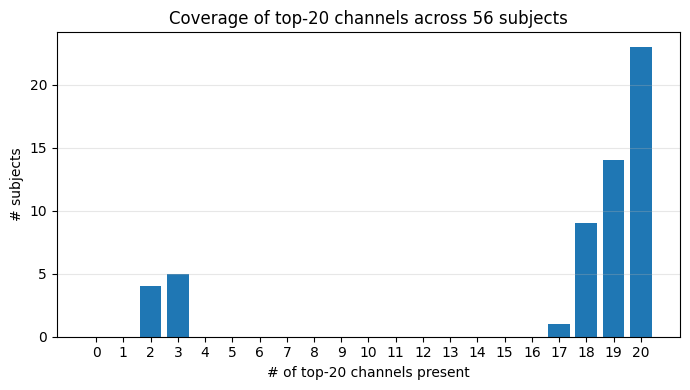

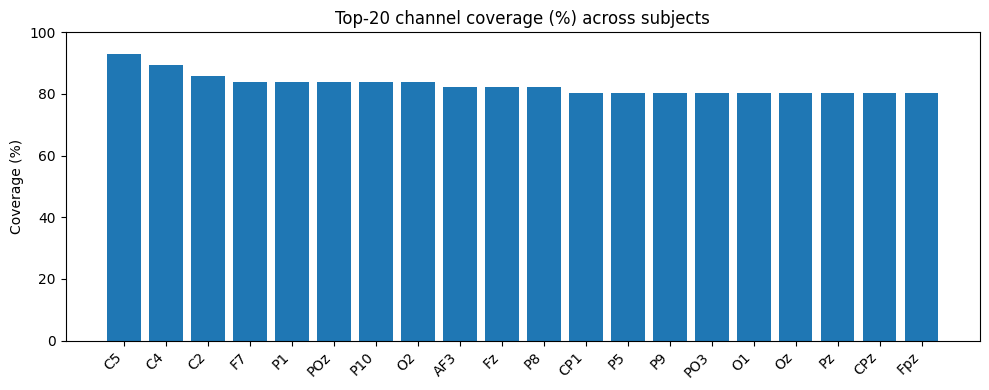


Example: extracting top-20 channels from 10Abby_Resting_cleanedICACLEAN_subject.set (missing -> NaN)
  C5     -> present
  C4     -> present
  C2     -> present
  F7     -> present
  P1     -> present
  POz    -> present
  P10    -> present
  O2     -> present
  AF3    -> present
  Fz     -> present
  P8     -> present
  CP1    -> present
  P5     -> present
  P9     -> present
  PO3    -> present
  O1     -> present
  Oz     -> present
  Pz     -> present
  CPz    -> present
  Fpz    -> present

Extracted array shape: (20, 81921)
Sampling frequency (Hz): 512.0
Time duration (s): 160.001953125


In [ ]:
# @title
# Full corrected script — pick top-20 channels and extract per-subject arrays (missing -> NaN)
import os
import glob
import re
import warnings
from collections import Counter
import numpy as np
import mne
import matplotlib.pyplot as plt

warnings.filterwarnings("ignore")
plt.rcParams.update({'figure.max_open_warning': 0})

# ---------------- CONFIG ----------------
FOLDER = "/content/drive/MyDrive/Design_Project/cleaned_output_data"
TOP_K = 20
# ----------------------------------------

# 1) Gather .set files (case-insensitive)
set_files = sorted(glob.glob(os.path.join(FOLDER, "*.set")) + glob.glob(os.path.join(FOLDER, "*.SET")))
if len(set_files) == 0:
    # try pairing .fdt to .set
    fdt_files = sorted(glob.glob(os.path.join(FOLDER, "*.fdt")) + glob.glob(os.path.join(FOLDER, "*.FDT")))
    for f in fdt_files:
        candidate = os.path.splitext(f)[0] + ".set"
        if os.path.exists(candidate):
            set_files.append(candidate)

print(f"Found {len(set_files)} .set files\n")

if len(set_files) == 0:
    raise SystemExit("No .set files found in folder. Mount Drive or check path.")

# 2) Read channel lists and build counter
counter = Counter()
all_channel_sets = []
successful_files = []

for fp in set_files:
    fname = os.path.basename(fp)
    try:
        raw = mne.io.read_raw_eeglab(fp, preload=False, verbose=False)
        chs = [c.strip() for c in raw.info.get('ch_names', [])]
        if len(chs) == 0:
            print(f"Warning: no channels found in {fname}")
            continue
        counter.update(chs)
        all_channel_sets.append(set(chs))
        successful_files.append(fp)
        print(f"{fname} -> {len(chs)} channels")
    except Exception as e:
        print(f"{fname} -> ERROR: {e}")

total_subjects = len(all_channel_sets)
print(f"\nSuccessfully processed subjects: {total_subjects}\n")

if total_subjects == 0:
    raise SystemExit("No subject channel info available after processing.")

# 3) Choose top-K channels by frequency
topk = [ch for ch, _ in counter.most_common(TOP_K)]
print(f"Top-{TOP_K} channels (most common across subjects):")
print(topk)
print("\nCoverage per top channel:")
for ch in topk:
    print(f"  {ch:6s} : {counter[ch]:2d} / {total_subjects}  ({counter[ch]/total_subjects*100:.1f}%)")

# 4) Per-subject presence of top-K, report missing
present_counts = []
print("\nPer-subject top-K presence (first 10 subjects shown):")
for idx, chset in enumerate(all_channel_sets):
    present = [ch for ch in topk if ch in chset]
    missing = sorted(list(set(topk) - set(present)))
    present_counts.append(len(present))
    if idx < 10:  # print first 10 to avoid huge verbosity
        print(f" Subject {idx+1:02d}: {len(present)}/{TOP_K} present. Missing: {missing}")
print("...")
print(f"\nSummary across all subjects: mean present = {np.mean(present_counts):.2f}, "
      f"min = {np.min(present_counts)}, max = {np.max(present_counts)}")

# 5) Plot histogram: how many of top-K are present per subject
plt.figure(figsize=(7,4))
plt.hist(present_counts, bins=range(0, TOP_K+2), align='left', rwidth=0.8)
plt.xlabel(f"# of top-{TOP_K} channels present")
plt.ylabel("# subjects")
plt.title(f"Coverage of top-{TOP_K} channels across {total_subjects} subjects")
plt.xticks(range(0, TOP_K+1))
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

# 6) Optional: plot top-channel coverage bar
plt.figure(figsize=(10,4))
coverage_percent = [counter[ch]/total_subjects*100 for ch in topk]
plt.bar(range(len(topk)), coverage_percent)
plt.xticks(range(len(topk)), topk, rotation=45, ha='right')
plt.ylabel('Coverage (%)')
plt.ylim(0, 100)
plt.title('Top-20 channel coverage (%) across subjects')
plt.tight_layout()
plt.show()

# 7) Example extraction: build (20 x n_samples) array for one example subject (first successful file).
#    Missing channels remain NaN. This demonstrates how to extract the matrix for later processing.
example_fp = successful_files[0]
print(f"\nExample: extracting top-{TOP_K} channels from {os.path.basename(example_fp)} (missing -> NaN)")

raw = mne.io.read_raw_eeglab(example_fp, preload=True, verbose=False)
sfreq = raw.info['sfreq']
n_samples = raw.n_times

# prepare array: rows = channels in topk order, cols = timepoints
arr = np.full((TOP_K, n_samples), np.nan, dtype=float)

for i, ch in enumerate(topk):
    if ch in raw.ch_names:
        # use new API: pick by name and get_data() returns ndarray (n_ch, n_times)
        data = raw.copy().pick([ch]).get_data()  # shape (1, n_samples)
        arr[i, :] = data.reshape(-1)
    else:
        # keep NaN row for missing channel
        pass

# sanity print
nan_counts = np.isnan(arr).sum(axis=1)
for ch, nancnt in zip(topk, nan_counts):
    present_flag = "present" if nancnt == 0 else f"missing({nancnt} NaNs)"
    print(f"  {ch:6s} -> {present_flag}")

print("\nExtracted array shape:", arr.shape)
print("Sampling frequency (Hz):", sfreq)
print("Time duration (s):", n_samples / sfreq)


In [ ]:
!pip install eeglabio

***Getting Data top 20 channels***

In [ ]:
# @title
"""
CHANNEL STANDARDIZATION FOR ALL SUBJECTS
=========================================
This script processes ALL .set files and standardizes them to the same 20 channels.
Missing channels are interpolated from neighboring channels.
"""

import os
import mne
import numpy as np
from glob import glob
from tqdm import tqdm
import warnings

warnings.filterwarnings("ignore")

# ============================================================================
# CONFIGURATION
# ============================================================================
MASTER_CHANNEL_LIST = [
    'C5', 'C4', 'C2', 'F7', 'P1', 'POz', 'P10', 'O2', 'AF3', 'Fz',
    'P8', 'CP1', 'P5', 'P9', 'PO3', 'O1', 'Oz', 'Pz', 'CPz', 'Fpz'
]

INPUT_FOLDER = "/content/drive/MyDrive/Design_Project/dataset"
OUTPUT_FOLDER = "/content/drive/MyDrive/Design_Project/standardized_data2"

# Create output folder
os.makedirs(OUTPUT_FOLDER, exist_ok=True)

# ============================================================================
# FIND ALL FILES
# ============================================================================
all_files = glob(os.path.join(INPUT_FOLDER, "*.set"))
print("="*70)
print("CHANNEL STANDARDIZATION")
print("="*70)
print(f"\nInput folder: {INPUT_FOLDER}")
print(f"Output folder: {OUTPUT_FOLDER}")
print(f"Found {len(all_files)} .set files to process\n")

if len(all_files) == 0:
    raise FileNotFoundError(f"No .set files found in {INPUT_FOLDER}")

# ============================================================================
# PROCESS EACH FILE
# ============================================================================
summary = []

for file_path in tqdm(all_files, desc="Standardizing files"):
    try:
        # Extract subject ID
        subject_id = os.path.basename(file_path).replace(".set", "")

        # ---------------- LOAD ORIGINAL FILE ----------------
        raw_orig = mne.io.read_raw_eeglab(file_path, preload=True, verbose=False)
        original_channels = raw_orig.ch_names.copy()
        n_original = len(original_channels)

        # ---------------- CREATE NEW RAW WITH MASTER CHANNELS ----------------
        sfreq = raw_orig.info['sfreq']
        n_times = raw_orig.n_times

        # Create data array: rows=20 channels, cols=n_times
        data = np.zeros((len(MASTER_CHANNEL_LIST), n_times))

        # Map existing channels from original to new array
        missing_channels = []
        present_channels = []

        for idx, ch in enumerate(MASTER_CHANNEL_LIST):
            if ch in raw_orig.ch_names:
                ch_idx = raw_orig.ch_names.index(ch)
                data[idx, :] = raw_orig.get_data(picks=[ch])[0]
                present_channels.append(ch)
            else:
                # Leave zeros, will interpolate
                missing_channels.append(ch)

        # ---------------- CREATE INFO AND RAW OBJECT ----------------
        info = mne.create_info(
            ch_names=MASTER_CHANNEL_LIST,
            sfreq=sfreq,
            ch_types='eeg'
        )
        raw_new = mne.io.RawArray(data, info)

        # Set standard montage (10-20 system) for accurate interpolation
        montage = mne.channels.make_standard_montage('standard_1020')
        raw_new.set_montage(montage, match_case=False, verbose=False)

        # ---------------- INTERPOLATE MISSING CHANNELS ----------------
        if missing_channels:
            raw_new.info['bads'] = missing_channels
            raw_new.interpolate_bads(reset_bads=False, verbose=False)

        # ---------------- SAVE STANDARDIZED FILE ----------------
        output_file = os.path.join(OUTPUT_FOLDER, f"{subject_id}_standardized.fif")
        raw_new.save(output_file, overwrite=True, verbose=False)

        # Store summary info
        summary.append({
            'subject_id': subject_id,
            'original_channels': n_original,
            'standardized_channels': len(MASTER_CHANNEL_LIST),
            'present': len(present_channels),
            'interpolated': len(missing_channels),
            'missing_list': ', '.join(missing_channels) if missing_channels else 'None'
        })

    except Exception as e:
        print(f"\n❌ Error processing {os.path.basename(file_path)}: {e}")
        summary.append({
            'subject_id': subject_id,
            'original_channels': 'ERROR',
            'standardized_channels': 'ERROR',
            'present': 'ERROR',
            'interpolated': 'ERROR',
            'missing_list': str(e)
        })

# ============================================================================
# SUMMARY REPORT
# ============================================================================
print("\n" + "="*70)
print("STANDARDIZATION SUMMARY")
print("="*70)

import pandas as pd
df_summary = pd.DataFrame(summary)

print(f"\nTotal files processed: {len(df_summary)}")
print(f"Successful: {len(df_summary[df_summary['original_channels'] != 'ERROR'])}")
print(f"Failed: {len(df_summary[df_summary['original_channels'] == 'ERROR'])}")

print("\n" + "-"*70)
print("DETAILED REPORT")
print("-"*70)
print(df_summary.to_string(index=False))

# Save summary to CSV
summary_csv = os.path.join(OUTPUT_FOLDER, "standardization_summary.csv")
df_summary.to_csv(summary_csv, index=False)
print(f"\n✓ Summary saved to: {summary_csv}")

# Statistics
if len(df_summary[df_summary['original_channels'] != 'ERROR']) > 0:
    successful_df = df_summary[df_summary['original_channels'] != 'ERROR']
    print("\n" + "-"*70)
    print("STATISTICS")
    print("-"*70)
    print(f"Average original channels: {successful_df['original_channels'].astype(int).mean():.1f}")
    print(f"Average interpolated channels: {successful_df['interpolated'].astype(int).mean():.1f}")

    # Most commonly missing channels
    all_missing = []
    for missing_str in successful_df['missing_list']:
        if missing_str != 'None':
            all_missing.extend(missing_str.split(', '))

    if all_missing:
        from collections import Counter
        missing_counts = Counter(all_missing)
        print(f"\nMost commonly missing channels:")
        for ch, count in missing_counts.most_common(5):
            print(f"  - {ch}: missing in {count} subjects")

print("\n" + "="*70)
print("✓ STANDARDIZATION COMPLETE!")
print("="*70)
print(f"\nStandardized files saved in: {OUTPUT_FOLDER}")
print(f"All files now have {len(MASTER_CHANNEL_LIST)} channels in the same order.")
print(f"\nNext step: Run the microstate pipeline using these standardized files!")
print("="*70)

CHANNEL STANDARDIZATION

Input folder: /content/drive/MyDrive/Design_Project/dataset
Output folder: /content/drive/MyDrive/Design_Project/standardized_data2
Found 56 .set files to process



Standardizing files: 100%|██████████| 56/56 [02:03<00:00,  2.21s/it]


STANDARDIZATION SUMMARY

Total files processed: 56
Successful: 56
Failed: 0

----------------------------------------------------------------------
DETAILED REPORT
----------------------------------------------------------------------
    subject_id  original_channels  standardized_channels  present  interpolated                                                                  missing_list
 8Abby_Resting                 60                     20       18             2                                                                      PO3, CPz
 5Abby_Resting                 52                     20       18             2                                                                        C2, Pz
 3Abby_Resting                 55                     20       19             1                                                                            C2
 9Abby_Resting                 54                     20       20             0                                                     

Opening raw data file /content/drive/MyDrive/Design_Project/standardized_data/30Abby_Resting_cleanedICACLEAN_subject_standardized.fif...
    Range : 0 ... 81920 =      0.000 ...   160.000 secs
Ready.
Reading 0 ... 81920  =      0.000 ...   160.000 secs...
<Raw | 30Abby_Resting_cleanedICACLEAN_subject_standardized.fif, 20 x 81921 (160.0 s), ~12.5 MiB, data loaded>
Channels: ['C5', 'C4', 'C2', 'F7', 'P1', 'POz', 'P10', 'O2', 'AF3', 'Fz', 'P8', 'CP1', 'P5', 'P9', 'PO3', 'O1', 'Oz', 'Pz', 'CPz', 'Fpz']
Sampling frequency: 512.0


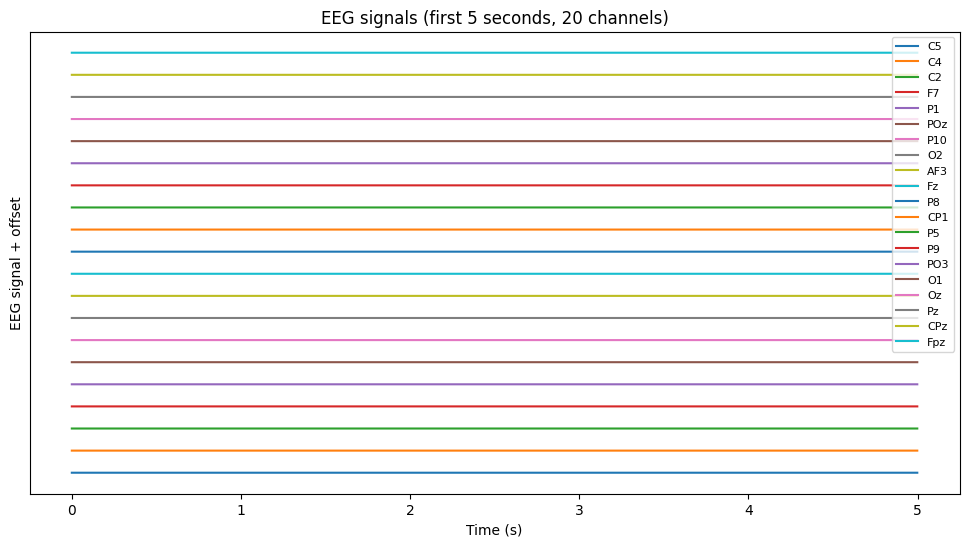

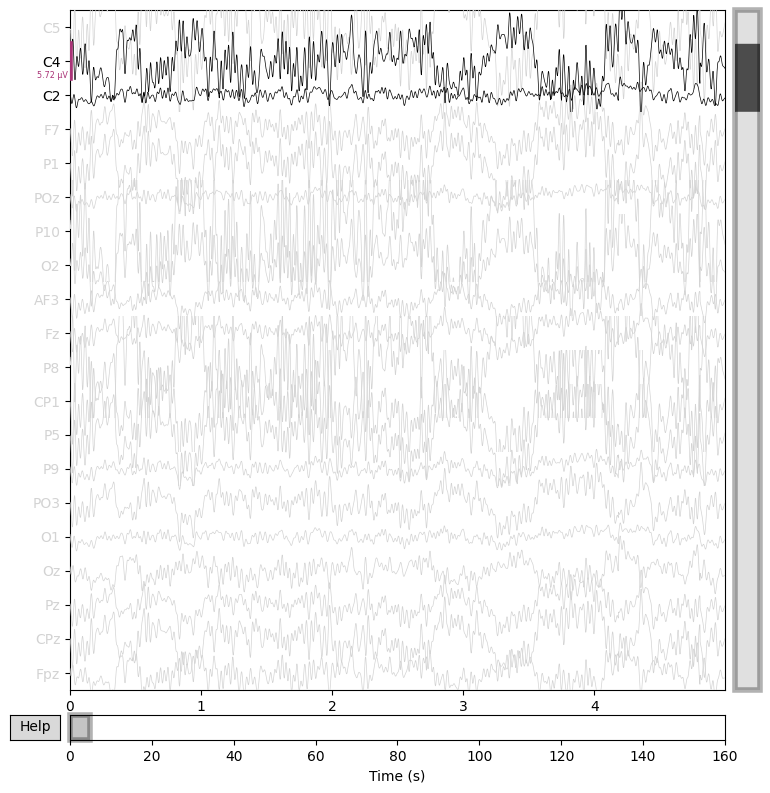

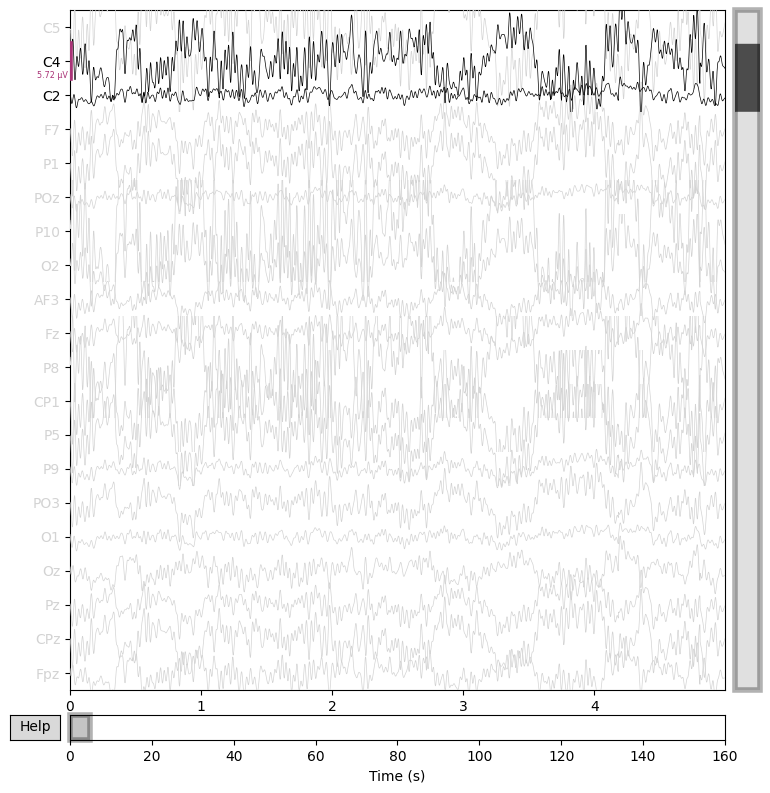

In [ ]:
# @title
import mne
import matplotlib.pyplot as plt

# ---------------- LOAD THE .FIF FILE ----------------
fif_file = "/content/drive/MyDrive/Design_Project/standardized_data/30Abby_Resting_cleanedICACLEAN_subject_standardized.fif"
raw = mne.io.read_raw_fif(fif_file, preload=True)
print(raw)
print("Channels:", raw.info['ch_names'])
print("Sampling frequency:", raw.info['sfreq'])

# ---------------- SIMPLE MATPLOTLIB PLOT ----------------
# Example: plot first 5 seconds of EEG from all 20 channels
sfreq = raw.info['sfreq']
data, times = raw[:, 0:int(5*sfreq)]  # first 5 seconds
plt.figure(figsize=(12, 6))
for i in range(len(raw.ch_names)):
    plt.plot(times, data[i, :] + i*50, label=raw.ch_names[i])  # offset for visibility
plt.xlabel("Time (s)")
plt.ylabel("EEG signal + offset")
plt.title("EEG signals (first 5 seconds, 20 channels)")
plt.yticks([])
plt.legend(loc='upper right', fontsize=8)
plt.show()

# ---------------- MNE INTERACTIVE PLOT ----------------
# This gives scrolling, zoom, channel selection
raw.plot(n_channels=20, duration=5, scalings='auto', title="Standardized EEG (20 channels)")


<Raw | 11Abby_Resting_standardized.fif, 20 x 81921 (160.0 s), ~12.5 MiB, data loaded>
Channels: ['C5', 'C4', 'C2', 'F7', 'P1', 'POz', 'P10', 'O2', 'AF3', 'Fz', 'P8', 'CP1', 'P5', 'P9', 'PO3', 'O1', 'Oz', 'Pz', 'CPz', 'Fpz']
Sampling frequency: 512.0


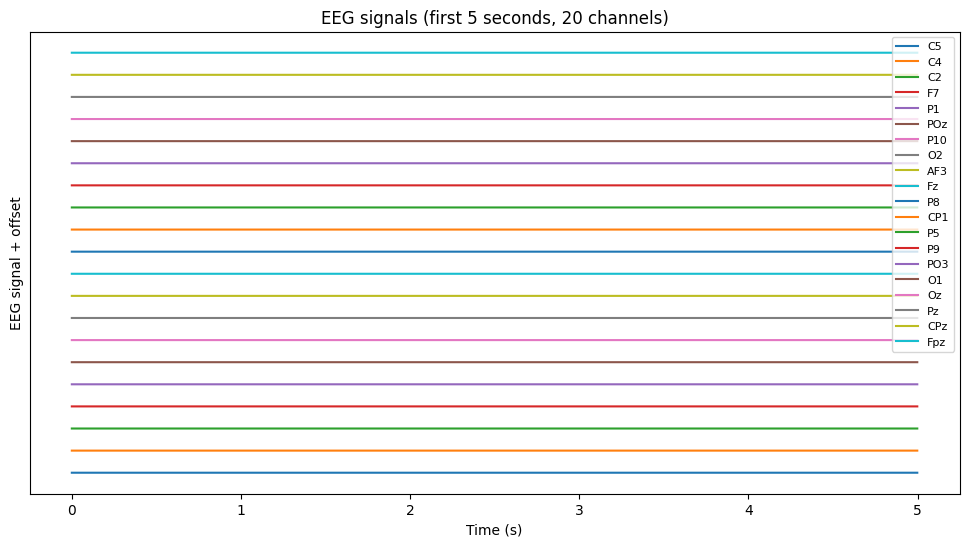

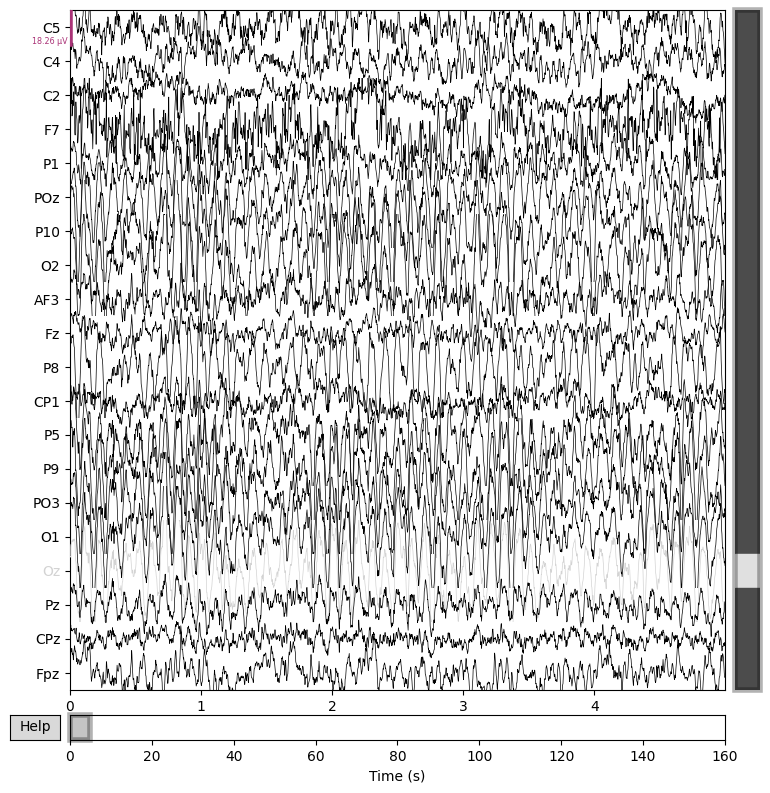

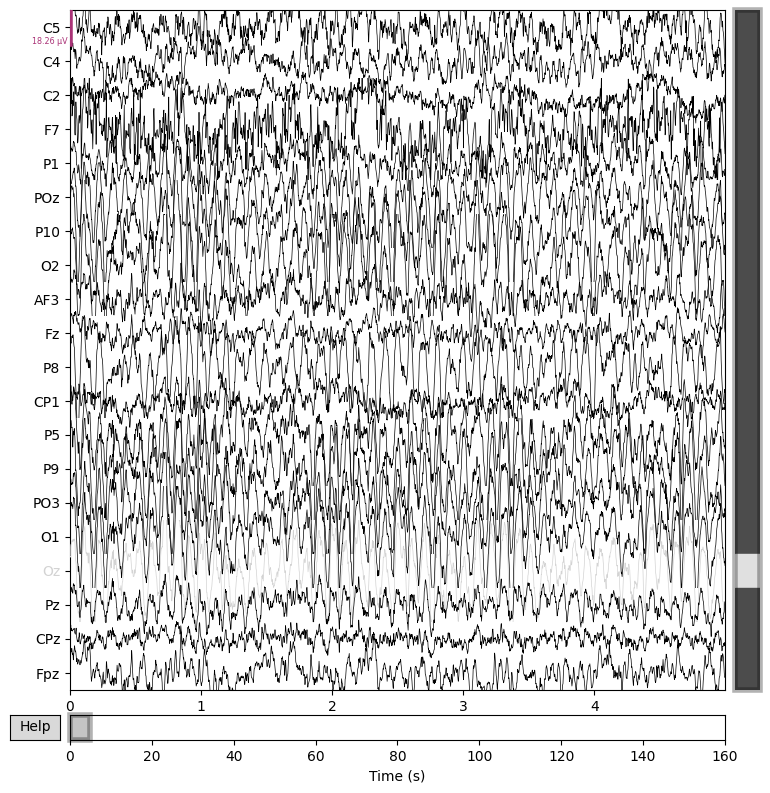

In [ ]:
# @title
import mne
import matplotlib.pyplot as plt

# ---------------- LOAD THE .FIF FILE ----------------
fif_file = "/content/drive/MyDrive/Design_Project/standardized_data2/11Abby_Resting_standardized.fif"
raw = mne.io.read_raw_fif(fif_file, preload=True)
print(raw)
print("Channels:", raw.info['ch_names'])
print("Sampling frequency:", raw.info['sfreq'])

# ---------------- SIMPLE MATPLOTLIB PLOT ----------------
# Example: plot first 5 seconds of EEG from all 20 channels
sfreq = raw.info['sfreq']
data, times = raw[:, 0:int(5*sfreq)]  # first 5 seconds
plt.figure(figsize=(12, 6))
for i in range(len(raw.ch_names)):
    plt.plot(times, data[i, :] + i*50, label=raw.ch_names[i])  # offset for visibility
plt.xlabel("Time (s)")
plt.ylabel("EEG signal + offset")
plt.title("EEG signals (first 5 seconds, 20 channels)")
plt.yticks([])
plt.legend(loc='upper right', fontsize=8)
plt.show()

# ---------------- MNE INTERACTIVE PLOT ----------------
# This gives scrolling, zoom, channel selection
raw.plot(n_channels=25, duration=5, scalings='auto', title="Standardized EEG (20 channels)")


<Raw | 11Abby_Resting_cleanedICACLEAN_subject_standardized.fif, 20 x 81921 (160.0 s), ~12.5 MiB, data loaded>
Channels: ['C5', 'C4', 'C2', 'F7', 'P1', 'POz', 'P10', 'O2', 'AF3', 'Fz', 'P8', 'CP1', 'P5', 'P9', 'PO3', 'O1', 'Oz', 'Pz', 'CPz', 'Fpz']
Sampling frequency: 512.0


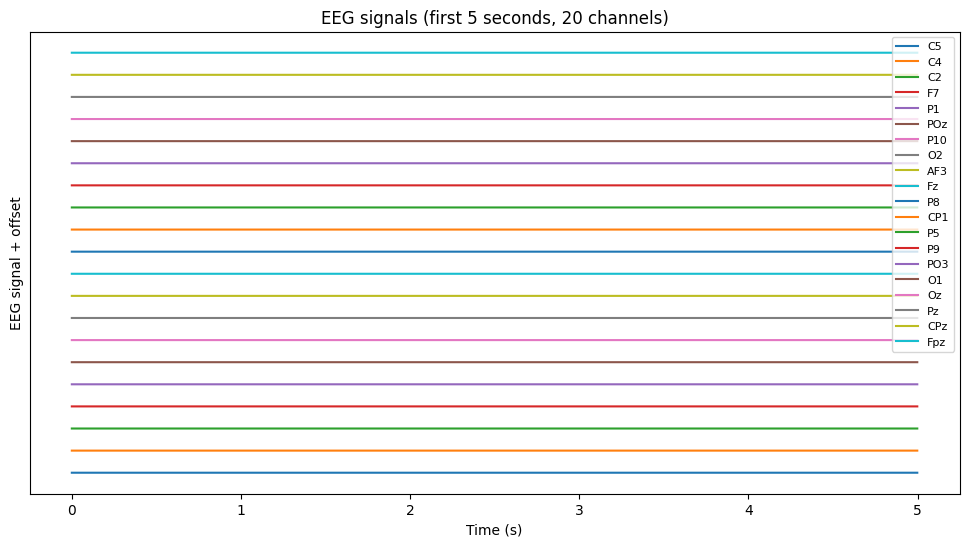

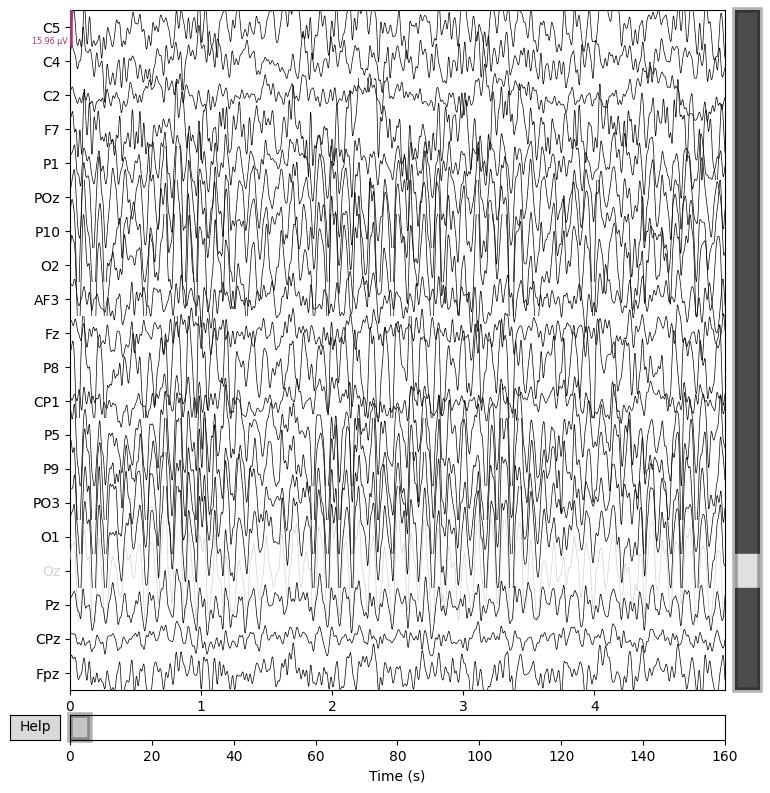

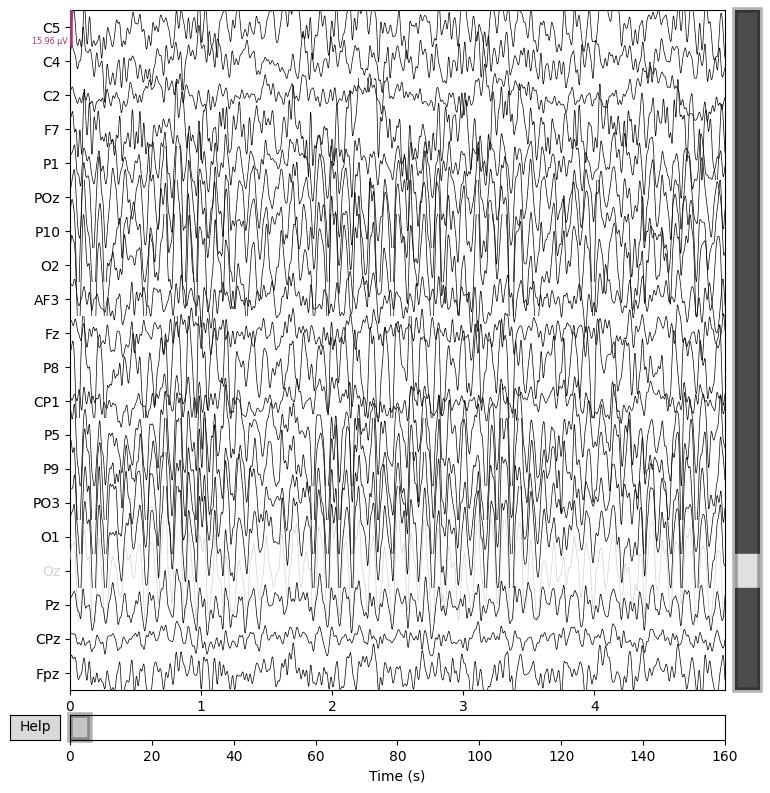

In [ ]:
# @title
import mne
import matplotlib.pyplot as plt

# ---------------- LOAD THE .FIF FILE ----------------
fif_file = "/content/drive/MyDrive/Design_Project/standardized_data/11Abby_Resting_cleanedICACLEAN_subject_standardized.fif"
raw = mne.io.read_raw_fif(fif_file, preload=True)
print(raw)
print("Channels:", raw.info['ch_names'])
print("Sampling frequency:", raw.info['sfreq'])

# ---------------- SIMPLE MATPLOTLIB PLOT ----------------
# Example: plot first 5 seconds of EEG from all 20 channels
sfreq = raw.info['sfreq']
data, times = raw[:, 0:int(5*sfreq)]  # first 5 seconds
plt.figure(figsize=(12, 6))
for i in range(len(raw.ch_names)):
    plt.plot(times, data[i, :] + i*50, label=raw.ch_names[i])  # offset for visibility
plt.xlabel("Time (s)")
plt.ylabel("EEG signal + offset")
plt.title("EEG signals (first 5 seconds, 20 channels)")
plt.yticks([])
plt.legend(loc='upper right', fontsize=8)
plt.show()

# ---------------- MNE INTERACTIVE PLOT ----------------
# This gives scrolling, zoom, channel selection
raw.plot(n_channels=25, duration=5, scalings='auto', title="Standardized EEG (20 channels)")


# Doing Microstate

Loading standardized EEG data from: /content/drive/MyDrive/Design_Project/standardized_data2/20Abby_Resting_standardized.fif
Original channels: ['C5', 'C4', 'C2', 'F7', 'P1', 'POz', 'P10', 'O2', 'AF3', 'Fz', 'P8', 'CP1', 'P5', 'P9', 'PO3', 'O1', 'Oz', 'Pz', 'CPz', 'Fpz']
Master channels used: ['C5', 'C4', 'C2', 'F7', 'P1', 'POz', 'P10', 'O2', 'AF3', 'Fz', 'P8', 'CP1', 'P5', 'P9', 'PO3', 'O1', 'Oz', 'Pz', 'CPz', 'Fpz']
Average reference applied.

Clustering to find 4 microstate maps...

--- VISUAL 1: Template Microstate Maps ---


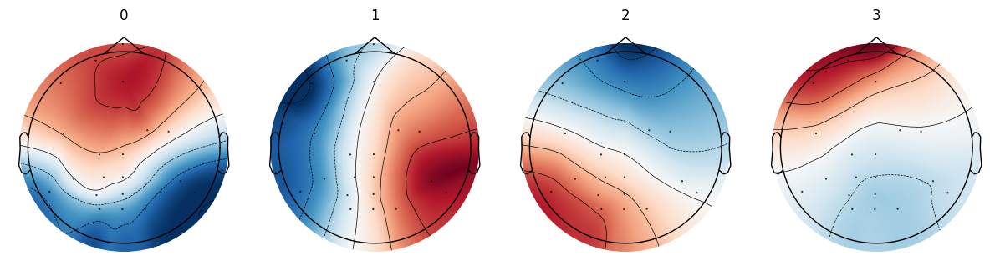


Labeling EEG data with microstate maps...

--- VISUAL 2: Microstate Labels (first 10 sec) ---


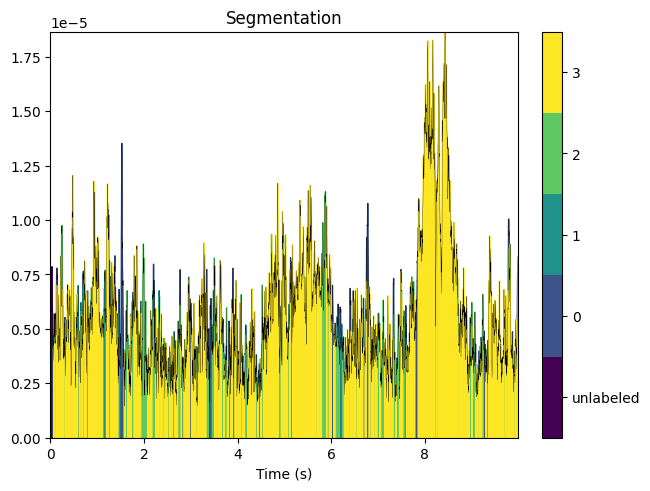


--- Microstate Metrics ---
1. Global Explained Variance (GEV): 63.57%

2. Coverage per state:
   State 0: 25.57%
   State 1: 19.72%
   State 2: 24.36%
   State 3: 30.34%

3. Mean Life Span (Duration) per state:
   State 0: 11.80 ms
   State 1: 8.90 ms
   State 2: 9.67 ms
   State 3: 12.00 ms

4. Transition probabilities (off-diagonal only):
   State 0 → State 1: 31.42%
   State 0 → State 2: 29.57%
   State 0 → State 3: 39.01%
   State 1 → State 0: 30.62%
   State 1 → State 2: 38.19%
   State 1 → State 3: 31.19%
   State 2 → State 0: 26.66%
   State 2 → State 1: 33.91%
   State 2 → State 3: 39.42%
   State 3 → State 0: 32.34%
   State 3 → State 1: 26.87%
   State 3 → State 2: 40.79%

5. Additional metrics:
   - Occurrence metric not available in this pycrostates version.
   - Total number of microstate segments: 81921


In [ ]:
# @title
# -----------------------------
# Full Microstate Analysis Script
# -----------------------------

# Install packages if needed
# !pip install mne pycrostates matplotlib numpy

import mne
import os
import warnings
import matplotlib.pyplot as plt
from pycrostates.cluster import ModKMeans

warnings.filterwarnings("ignore")
plt.rcParams.update({'figure.max_open_warning': 0})

# -------------------
# CONFIG
# -------------------
MASTER_CHANNEL_LIST = [
    'C5', 'C4', 'C2', 'F7', 'P1', 'POz', 'P10', 'O2', 'AF3', 'Fz',
    'P8', 'CP1', 'P5', 'P9', 'PO3', 'O1', 'Oz', 'Pz', 'CPz', 'Fpz'
]

# Path to standardized .fif file
file_path_fif = "/content/drive/MyDrive/Design_Project/standardized_data2/20Abby_Resting_standardized.fif"

# Number of microstate clusters (canonical: 4)
N_CLUSTERS = 4

# -------------------
# LOAD DATA
# -------------------
print(f"Loading standardized EEG data from: {file_path_fif}")
raw = mne.io.read_raw_fif(file_path_fif, preload=True)
print("Original channels:", raw.ch_names)

# -------------------
# Keep only master channels
# -------------------
raw.pick_channels(MASTER_CHANNEL_LIST)
print("Master channels used:", raw.ch_names)

# -------------------
# Apply average reference
# -------------------
raw.set_eeg_reference('average')
print("Average reference applied.")

# -------------------
# Clustering: Find Microstate Template Maps
# -------------------
print(f"\nClustering to find {N_CLUSTERS} microstate maps...")
kmeans = ModKMeans(n_clusters=N_CLUSTERS, random_state=42, n_init=10, max_iter=100)
kmeans.fit(raw, n_jobs=-1)

# -------------------
# PLOT 1: Template Microstate Maps
# -------------------
print("\n--- VISUAL 1: Template Microstate Maps ---")
kmeans.plot()
plt.show()

# -------------------
# Label the Data (Segmentation)
# -------------------
print("\nLabeling EEG data with microstate maps...")
segmentation = kmeans.predict(raw)

# -------------------
# PLOT 2: Labeled Microstate Data (first 10 seconds)
# -------------------
print("\n--- VISUAL 2: Microstate Labels (first 10 sec) ---")
segmentation.plot(tmin=0, tmax=10, cmap='viridis')
plt.show()

# -------------------
# Compute Microstate Metrics
# -------------------
print("\n--- Microstate Metrics ---")

# 1. GEV (Global Explained Variance)
gev = kmeans.GEV_
print(f"1. Global Explained Variance (GEV): {gev*100:.2f}%")

# 2. Coverage (time spent in each state)
params = segmentation.compute_parameters()
print("\n2. Coverage per state:")
for i in range(N_CLUSTERS):
    print(f"   State {i}: {params[f'{i}_timecov']*100:.2f}%")

# 3. Mean Duration
print("\n3. Mean Life Span (Duration) per state:")
for i in range(N_CLUSTERS):
    print(f"   State {i}: {params[f'{i}_meandurs']*1000:.2f} ms")  # sec → ms

# 4. Transition Matrix
transition_mat = segmentation.compute_transition_matrix()
print("\n4. Transition probabilities (off-diagonal only):")
for i in range(N_CLUSTERS):
    for j in range(N_CLUSTERS):
        if i != j:
            print(f"   State {i} → State {j}: {transition_mat[i,j]*100:.2f}%")

# 5. Bonus Metrics
# 5. Bonus Metrics (safe version)
print("\n5. Additional metrics:")
# Check if key exists first
if 'occurrence' in params:
    print(f"   - Occurrence (transitions/sec): {params['occurrence']}")
else:
    print("   - Occurrence metric not available in this pycrostates version.")
print(f"   - Total number of microstate segments: {len(segmentation._labels)}")


PART 1: INDIVIDUAL MICROSTATE ANALYSIS

Found 47 standardized files

This step creates individual microstate maps for EACH subject.
Useful for quality control, but takes time and creates many plots.
Run individual analysis? (y/n): n

Skipping individual analysis...

PART 2: GROUP-LEVEL CLUSTERING

Loading all subjects for group-level clustering...


Loading files: 100%|██████████| 47/47 [00:07<00:00,  5.95it/s]



Concatenating all subjects...
Total epochs for clustering: 7506
Total subjects: 47

Running group-level Modified K-Means clustering...
(This may take several minutes...)

✓ Group-level clustering complete!
  Global Explained Variance (GEV): 58.15%

Plotting group-level microstate templates...


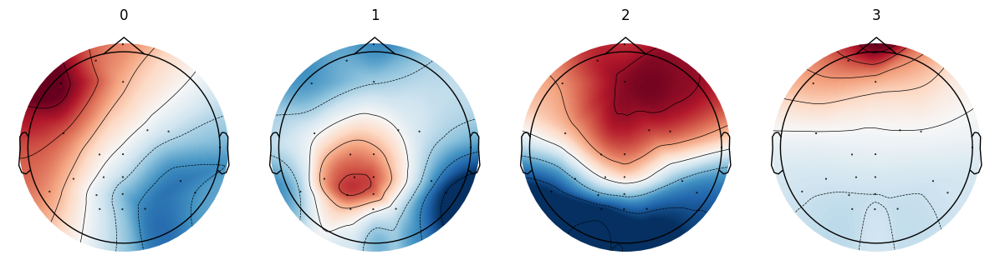

<Figure size 640x480 with 0 Axes>


✓ Group templates saved to: /content/drive/MyDrive/Design_Project/Microstate_2/group_templates.fif

PART 3: BACKFITTING + FEATURE EXTRACTION


Extracting features:   0%|          | 0/47 [00:00<?, ?it/s]

[_base.predict] WARNING: The channels PO3, CPz are set as bad in the instance but were selected. They will be used for prediction.


Extracting features:   2%|▏         | 1/47 [00:00<00:35,  1.29it/s]

[_base.predict] WARNING: The channels C2, Pz are set as bad in the instance but were selected. They will be used for prediction.


Extracting features:   4%|▍         | 2/47 [00:01<00:30,  1.46it/s]

[_base.predict] WARNING: The channel C2 is set as bad in the instance but was selected. It will be used for prediction.


Extracting features:  13%|█▎        | 6/47 [00:04<00:24,  1.70it/s]

[_base.predict] WARNING: The channels Fz, Fpz are set as bad in the instance but were selected. They will be used for prediction.


Extracting features:  17%|█▋        | 8/47 [00:05<00:20,  1.87it/s]

[_base.predict] WARNING: The channels C5, P5 are set as bad in the instance but were selected. They will be used for prediction.


Extracting features:  19%|█▉        | 9/47 [00:05<00:17,  2.12it/s]

[_base.predict] WARNING: The channel C4 is set as bad in the instance but was selected. It will be used for prediction.


Extracting features:  21%|██▏       | 10/47 [00:05<00:15,  2.32it/s]

[_base.predict] WARNING: The channel C2 is set as bad in the instance but was selected. It will be used for prediction.


Extracting features:  30%|██▉       | 14/47 [00:07<00:14,  2.31it/s]

[_base.predict] WARNING: The channels C4, CP1 are set as bad in the instance but were selected. They will be used for prediction.


Extracting features:  32%|███▏      | 15/47 [00:08<00:17,  1.83it/s]

[_base.predict] WARNING: The channel Oz is set as bad in the instance but was selected. It will be used for prediction.


Extracting features:  36%|███▌      | 17/47 [00:09<00:14,  2.12it/s]

[_base.predict] WARNING: The channel Oz is set as bad in the instance but was selected. It will be used for prediction.


Extracting features:  45%|████▍     | 21/47 [00:11<00:12,  2.00it/s]

[_base.predict] WARNING: The channels CP1, CPz are set as bad in the instance but were selected. They will be used for prediction.


Extracting features:  49%|████▉     | 23/47 [00:12<00:14,  1.64it/s]

[_base.predict] WARNING: The channels C4, P8 are set as bad in the instance but were selected. They will be used for prediction.


Extracting features:  51%|█████     | 24/47 [00:13<00:14,  1.60it/s]

[_base.predict] WARNING: The channel C5 is set as bad in the instance but was selected. It will be used for prediction.


Extracting features:  53%|█████▎    | 25/47 [00:13<00:14,  1.52it/s]

[_base.predict] WARNING: The channels C2, AF3 are set as bad in the instance but were selected. They will be used for prediction.


Extracting features:  70%|███████   | 33/47 [00:19<00:07,  1.84it/s]

[_base.predict] WARNING: The channel PO3 is set as bad in the instance but was selected. It will be used for prediction.


Extracting features:  77%|███████▋  | 36/47 [00:20<00:04,  2.27it/s]

[_base.predict] WARNING: The channel C2 is set as bad in the instance but was selected. It will be used for prediction.


Extracting features:  79%|███████▊  | 37/47 [00:20<00:04,  2.38it/s]

[_base.predict] WARNING: The channel Fpz is set as bad in the instance but was selected. It will be used for prediction.


Extracting features:  83%|████████▎ | 39/47 [00:21<00:03,  2.31it/s]

[_base.predict] WARNING: The channel P9 is set as bad in the instance but was selected. It will be used for prediction.


Extracting features:  87%|████████▋ | 41/47 [00:22<00:02,  2.67it/s]

[_base.predict] WARNING: The channel O1 is set as bad in the instance but was selected. It will be used for prediction.


Extracting features:  89%|████████▉ | 42/47 [00:23<00:02,  2.26it/s]

[_base.predict] WARNING: The channel O1 is set as bad in the instance but was selected. It will be used for prediction.


Extracting features:  91%|█████████▏| 43/47 [00:23<00:01,  2.47it/s]

[_base.predict] WARNING: The channel C2 is set as bad in the instance but was selected. It will be used for prediction.


Extracting features:  94%|█████████▎| 44/47 [00:23<00:01,  2.64it/s]

[_base.predict] WARNING: The channels C2, P9 are set as bad in the instance but were selected. They will be used for prediction.


Extracting features:  96%|█████████▌| 45/47 [00:23<00:00,  2.70it/s]

[_base.predict] WARNING: The channels C4, C2, Pz are set as bad in the instance but were selected. They will be used for prediction.


Extracting features:  98%|█████████▊| 46/47 [00:24<00:00,  2.25it/s]

[_base.predict] WARNING: The channel P5 is set as bad in the instance but was selected. It will be used for prediction.


Extracting features: 100%|██████████| 47/47 [00:24<00:00,  1.88it/s]


SAVING RESULTS

✓ Features saved to: /content/drive/MyDrive/Design_Project/Microstate_2/microstate_features.csv
✓ Summary saved to: /content/drive/MyDrive/Design_Project/Microstate_2/analysis_summary.txt

ANALYSIS COMPLETE - RESULTS SUMMARY

Total subjects processed: 47
Group-level GEV: 58.15%
Features per subject: 35

----------------------------------------------------------------------
SAMPLE DATA (First 3 subjects)
----------------------------------------------------------------------
      subject_id  coverage_state_0  coverage_state_1  coverage_state_2  coverage_state_3  duration_ms_state_0  duration_ms_state_1  duration_ms_state_2  duration_ms_state_3  occurrences_state_0  occurrences_state_1  occurrences_state_2  occurrences_state_3  gev_state_0  gev_state_1  gev_state_2  gev_state_3  mean_corr_state_0  mean_corr_state_1  mean_corr_state_2  mean_corr_state_3  transition_0_to_1  transition_0_to_2  transition_0_to_3  transition_1_to_0  transition_1_to_2  transition_1_to_3  trans

In [ ]:
# @title
"""
COMPLETE MICROSTATE ANALYSIS PIPELINE
======================================
Part 1: Individual microstate analysis for each subject (for visualization/QC)
Part 2: Group-level clustering (universal templates)
Part 3: Backfitting + Feature extraction (ML-ready dataset)
"""

import mne
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import warnings
from pycrostates.cluster import ModKMeans
from glob import glob
from tqdm import tqdm

warnings.filterwarnings("ignore")
plt.rcParams.update({'figure.max_open_warning': 0})

# ============================================================================
# CONFIGURATION
# ============================================================================
MASTER_CHANNEL_LIST = [
    'C5', 'C4', 'C2', 'F7', 'P1', 'POz', 'P10', 'O2', 'AF3', 'Fz',
    'P8', 'CP1', 'P5', 'P9', 'PO3', 'O1', 'Oz', 'Pz', 'CPz', 'Fpz'
]

# Paths
STANDARDIZED_FOLDER = "/content/drive/MyDrive/Design_Project/standardized_data2"
OUTPUT_FOLDER = "/content/drive/MyDrive/Design_Project/Microstate_2"
INDIVIDUAL_PLOTS_FOLDER = os.path.join(OUTPUT_FOLDER, "individual_plots")

# Parameters
N_CLUSTERS = 4  # A, B, C, D
REFERENCE = 'average'

# Create output folders
os.makedirs(OUTPUT_FOLDER, exist_ok=True)
os.makedirs(INDIVIDUAL_PLOTS_FOLDER, exist_ok=True)

# ============================================================================
# PART 1: INDIVIDUAL MICROSTATE ANALYSIS (Optional - for QC/visualization)
# ============================================================================
print("="*70)
print("PART 1: INDIVIDUAL MICROSTATE ANALYSIS")
print("="*70)

# Find all standardized files
all_files = glob(os.path.join(STANDARDIZED_FOLDER, "*_standardized.fif"))
print(f"\nFound {len(all_files)} standardized files")

if len(all_files) == 0:
    raise FileNotFoundError(f"No *_standardized.fif files found in {STANDARDIZED_FOLDER}")

# Ask user if they want to run individual analysis
print("\nThis step creates individual microstate maps for EACH subject.")
print("Useful for quality control, but takes time and creates many plots.")
run_individual = input("Run individual analysis? (y/n): ").lower().strip() == 'y'

individual_results = []

if run_individual:
    print("\nRunning individual microstate analysis...")

    for file_path in tqdm(all_files[:5], desc="Analyzing subjects"):  # Limit to first 5 for demo
        try:
            subject_id = os.path.basename(file_path).replace("_standardized.fif", "")

            # Load data
            raw = mne.io.read_raw_fif(file_path, preload=True, verbose=False)
            raw.pick_channels(MASTER_CHANNEL_LIST)
            raw.set_eeg_reference(REFERENCE, verbose=False)

            # Individual clustering
            kmeans_ind = ModKMeans(n_clusters=N_CLUSTERS, random_state=42, n_init=10, max_iter=100)
            kmeans_ind.fit(raw, n_jobs=-1)

            # Plot and save
            fig = kmeans_ind.plot()
            plt.suptitle(f"Individual Microstates - {subject_id}", y=1.02)
            plt.savefig(
                os.path.join(INDIVIDUAL_PLOTS_FOLDER, f"{subject_id}_maps.png"),
                dpi=150, bbox_inches='tight'
            )
            plt.close()

            # Store GEV
            individual_results.append({
                'subject_id': subject_id,
                'individual_gev': kmeans_ind.GEV_ * 100
            })

        except Exception as e:
            print(f"\nWarning: Error processing {subject_id}: {e}")

    print(f"\n✓ Individual plots saved to: {INDIVIDUAL_PLOTS_FOLDER}")
else:
    print("\nSkipping individual analysis...")

# ============================================================================
# PART 2: GROUP-LEVEL CLUSTERING (Universal Templates)
# ============================================================================
print("\n" + "="*70)
print("PART 2: GROUP-LEVEL CLUSTERING")
print("="*70)

print("\nLoading all subjects for group-level clustering...")
all_epochs_list = []

for file_path in tqdm(all_files, desc="Loading files"):
    try:
        raw = mne.io.read_raw_fif(file_path, preload=True, verbose=False)
        raw.pick_channels(MASTER_CHANNEL_LIST)
        raw.set_eeg_reference(REFERENCE, verbose=False)

        # CRITICAL: Reset 'bads' list to allow concatenation
        # (After interpolation, all channels are good)
        raw.info['bads'] = []

        # Create 1-second epochs to manage memory
        events = mne.make_fixed_length_events(raw, duration=1.0)
        epochs = mne.Epochs(raw, events, tmin=0, tmax=1.0, baseline=None,
                           preload=True, verbose=False)
        all_epochs_list.append(epochs)
    except Exception as e:
        print(f"\nWarning: Could not load {os.path.basename(file_path)}: {e}")

# Concatenate all epochs
print("\nConcatenating all subjects...")
all_epochs = mne.concatenate_epochs(all_epochs_list, verbose=False)
print(f"Total epochs for clustering: {len(all_epochs)}")
print(f"Total subjects: {len(all_epochs_list)}")

# Run group-level clustering
print("\nRunning group-level Modified K-Means clustering...")
print("(This may take several minutes...)")

group_kmeans = ModKMeans(n_clusters=N_CLUSTERS, random_state=42, n_init=10, max_iter=100)
group_kmeans.fit(all_epochs, n_jobs=-1)

print(f"\n✓ Group-level clustering complete!")
print(f"  Global Explained Variance (GEV): {group_kmeans.GEV_ * 100:.2f}%")

# Plot and save group templates
print("\nPlotting group-level microstate templates...")
fig = group_kmeans.plot()
plt.suptitle("Group-Level Microstate Templates (All Subjects)", y=1.02)
plt.savefig(os.path.join(OUTPUT_FOLDER, "group_templates.png"), dpi=300, bbox_inches='tight')
plt.show()

# Save group templates
group_templates_path = os.path.join(OUTPUT_FOLDER, "group_templates.fif")
group_kmeans.save(group_templates_path)
print(f"\n✓ Group templates saved to: {group_templates_path}")

# ============================================================================
# PART 3: BACKFITTING + FEATURE EXTRACTION
# ============================================================================
print("\n" + "="*70)
print("PART 3: BACKFITTING + FEATURE EXTRACTION")
print("="*70)

all_features = []

for file_path in tqdm(all_files, desc="Extracting features"):
    try:
        subject_id = os.path.basename(file_path).replace("_standardized.fif", "")

        # Load subject
        raw = mne.io.read_raw_fif(file_path, preload=True, verbose=False)
        raw.pick_channels(MASTER_CHANNEL_LIST)
        raw.set_eeg_reference(REFERENCE, verbose=False)

        # Backfit with group templates
        segmentation = group_kmeans.predict(raw, factor=0)

        # Extract parameters
        params = segmentation.compute_parameters()
        transition_mat = segmentation.compute_transition_matrix()

        # Build feature dictionary
        features = {'subject_id': subject_id}

        # Coverage (% time in each state)
        for i in range(N_CLUSTERS):
            features[f'coverage_state_{i}'] = params[f'{i}_timecov'] * 100

        # Mean duration (ms)
        for i in range(N_CLUSTERS):
            features[f'duration_ms_state_{i}'] = params[f'{i}_meandurs'] * 1000

        # Occurrences
        for i in range(N_CLUSTERS):
            features[f'occurrences_state_{i}'] = params[f'{i}_occurrences']

        # GEV per state
        for i in range(N_CLUSTERS):
            features[f'gev_state_{i}'] = params[f'{i}_gev'] * 100

        # Mean correlation per state
        for i in range(N_CLUSTERS):
            features[f'mean_corr_state_{i}'] = params[f'{i}_mean_corr']

        # Transition probabilities (off-diagonal only)
        for i in range(N_CLUSTERS):
            for j in range(N_CLUSTERS):
                if i != j:
                    features[f'transition_{i}_to_{j}'] = transition_mat[i, j] * 100

        # Additional metrics
        features['unlabeled_percent'] = params['unlabeled'] * 100
        features['total_segments'] = len(segmentation._labels)
        features['group_gev'] = group_kmeans.GEV_ * 100

        all_features.append(features)

    except Exception as e:
        print(f"\nWarning: Error processing {subject_id}: {e}")

# ============================================================================
# SAVE RESULTS
# ============================================================================
print("\n" + "="*70)
print("SAVING RESULTS")
print("="*70)

# Create DataFrame
df_features = pd.DataFrame(all_features)

# Save to CSV
csv_path = os.path.join(OUTPUT_FOLDER, "microstate_features.csv")
df_features.to_csv(csv_path, index=False)
print(f"\n✓ Features saved to: {csv_path}")

# Save detailed summary
summary_path = os.path.join(OUTPUT_FOLDER, "analysis_summary.txt")
with open(summary_path, 'w') as f:
    f.write("="*70 + "\n")
    f.write("MICROSTATE ANALYSIS SUMMARY\n")
    f.write("="*70 + "\n\n")
    f.write(f"Total subjects processed: {len(df_features)}\n")
    f.write(f"Number of microstates: {N_CLUSTERS}\n")
    f.write(f"Group-level GEV: {group_kmeans.GEV_ * 100:.2f}%\n\n")

    f.write("Feature Categories:\n")
    f.write(f"  - Coverage features: {N_CLUSTERS}\n")
    f.write(f"  - Duration features: {N_CLUSTERS}\n")
    f.write(f"  - Occurrence features: {N_CLUSTERS}\n")
    f.write(f"  - GEV per state: {N_CLUSTERS}\n")
    f.write(f"  - Mean correlation per state: {N_CLUSTERS}\n")
    f.write(f"  - Transition probabilities: {N_CLUSTERS * (N_CLUSTERS - 1)}\n")
    f.write(f"  - Additional metrics: 3\n")
    f.write(f"\nTotal features per subject: {len(df_features.columns) - 1}\n\n")

    f.write("-"*70 + "\n")
    f.write("DESCRIPTIVE STATISTICS\n")
    f.write("-"*70 + "\n\n")
    f.write(df_features.describe().to_string())

print(f"✓ Summary saved to: {summary_path}")

# ============================================================================
# DISPLAY RESULTS
# ============================================================================
print("\n" + "="*70)
print("ANALYSIS COMPLETE - RESULTS SUMMARY")
print("="*70)

print(f"\nTotal subjects processed: {len(df_features)}")
print(f"Group-level GEV: {group_kmeans.GEV_ * 100:.2f}%")
print(f"Features per subject: {len(df_features.columns) - 1}")

print("\n" + "-"*70)
print("SAMPLE DATA (First 3 subjects)")
print("-"*70)
print(df_features.head(3).to_string())

print("\n" + "-"*70)
print("COVERAGE STATISTICS (% time in each state)")
print("-"*70)
for i in range(N_CLUSTERS):
    col = f'coverage_state_{i}'
    print(f"State {i}: Mean={df_features[col].mean():.2f}%, SD={df_features[col].std():.2f}%")

print("\n" + "-"*70)
print("DURATION STATISTICS (ms)")
print("-"*70)
for i in range(N_CLUSTERS):
    col = f'duration_ms_state_{i}'
    print(f"State {i}: Mean={df_features[col].mean():.2f}ms, SD={df_features[col].std():.2f}ms")

print("\n" + "="*70)
print("FILES GENERATED")
print("="*70)
print(f"1. Group templates plot: {OUTPUT_FOLDER}/group_templates.png")
print(f"2. Group templates data: {group_templates_path}")
print(f"3. Feature dataset (CSV): {csv_path}")
print(f"4. Analysis summary: {summary_path}")
if run_individual:
    print(f"5. Individual plots: {INDIVIDUAL_PLOTS_FOLDER}/")

print("\n" + "="*70)
print("NEXT STEPS")
print("="*70)
print("1. Load the CSV file into your ML pipeline")
print("2. Add clinical labels (control/patient, diagnosis, etc.)")
print("3. Train classification/regression models")
print("4. Analyze which microstate features are most predictive")
print("="*70)

Loading master subject list from: /content/drive/MyDrive/Design_Project/microstate_results/microstate_features.csv
Found 47 total subjects in microstate file.
Splitting subject list 80/20...
Using 37 subjects for TRAINING.
Using 10 subjects for TESTING.

Loading training data (main + additional + microstate)...

Loading testing data (main + additional + microstate)...

Total training data: (1739, 667)
Total testing data: (466, 662)
Preprocessing and scaling...
Training SVM model...
Evaluating model...

--- Final Model Results (SVM) ---
Accuracy: 65.67%
Classification Report:
              precision    recall  f1-score   support

          td       0.83      0.40      0.54       235
         asd       0.60      0.92      0.73       231

    accuracy                           0.66       466
   macro avg       0.72      0.66      0.63       466
weighted avg       0.72      0.66      0.63       466



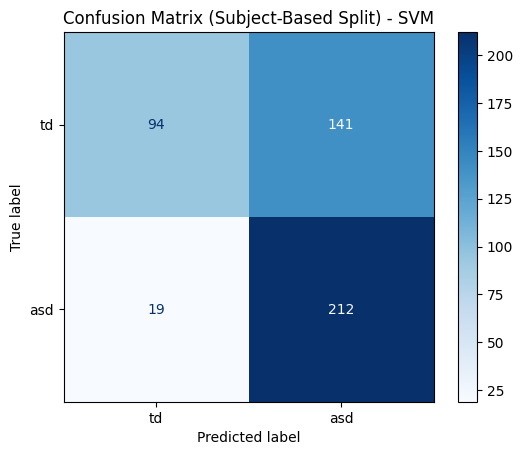

In [ ]:
# @title
import pandas as pd
import numpy as np
import glob
import os
import matplotlib.pyplot as plt
import warnings

# --- scikit-learn (ML) Imports ---
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.metrics import (
    accuracy_score,
    classification_report,
    ConfusionMatrixDisplay
)
from sklearn.impute import SimpleImputer # Handles any potential missing values

# ========= CONFIGURATION =========

# 1. The folder with the main segmented, LABELED files
base_folder = "/content/drive/MyDrive/Design_Project/Final_label2"

# 2. The folder with the corresponding "whole" data files
additional_data_folder = "/content/drive/MyDrive/Design_Project/Whole_eeg"

# 3. The new microstate features file (This is now the "master" list)
microstate_csv_path = "/content/drive/MyDrive/Design_Project/microstate_results/microstate_features.csv"

# 4. The name of your "label" column in the CSVs
TARGET_COLUMN = 'Group'

# 5. How to map your text labels to numbers (1 = Autism, 0 = Control)
LABEL_MAP = {
    'asd': 1,
    'td': 0
}
# =================================

def load_and_merge_data(subject_df, base_folder, additional_folder):
    all_subject_segments = []

    for _, microstate_row in subject_df.iterrows():
        try:
            subject_id = microstate_row['subject_id']

            main_file_name = f"{subject_id}_features_LABELED.csv"
            additional_file_name = f"{subject_id}_whole.csv"

            main_file_path = os.path.join(base_folder, main_file_name)
            additional_file_path = os.path.join(additional_data_folder, additional_file_name)

            if not os.path.exists(main_file_path):
                print(f"Warning: Could not find main file: {main_file_name}. Skipping subject {subject_id}.")
                continue
            if not os.path.exists(additional_file_path):
                print(f"Warning: Could not find additional file: {additional_file_name}. Skipping subject {subject_id}.")
                continue

            df_main = pd.read_csv(main_file_path)
            df_additional = pd.read_csv(additional_file_path)

            n_segments = len(df_main)
            if n_segments == 0:
                print(f"Warning: File {main_file_path} is empty. Skipping.")
                continue

            df_additional_features = df_additional.drop(columns=[TARGET_COLUMN], errors='ignore')
            num_cols = len(df_additional_features.columns)
            new_cols = [f"add_feat_{i}" for i in range(num_cols)]
            df_additional_features.columns = new_cols

            df_main.reset_index(drop=True, inplace=True)
            df_additional_features.reset_index(drop=True, inplace=True)

            df_segments = pd.concat([df_main, df_additional_features], axis=1)

            microstate_features = microstate_row.drop('subject_id')
            df_microstate_broadcast = pd.DataFrame([microstate_features] * n_segments)
            df_microstate_broadcast.reset_index(drop=True, inplace=True)

            combined_df = pd.concat([df_segments, df_microstate_broadcast], axis=1)
            all_subject_segments.append(combined_df)

        except Exception as e:
            print(f"Error processing subject {subject_id}: {e}")

    if not all_subject_segments:
        return pd.DataFrame()

    return pd.concat(all_subject_segments, ignore_index=True)


def run_split_by_subject():
    warnings.filterwarnings("ignore")

    print(f"Loading master subject list from: {microstate_csv_path}")
    try:
        df_microstate = pd.read_csv(microstate_csv_path)
    except Exception as e:
        print(f"FATAL ERROR: Could not load microstate CSV: {e}")
        return

    print(f"Found {len(df_microstate)} total subjects in microstate file.")

    print("Splitting subject list 80/20...")

    train_subjects_df, test_subjects_df = train_test_split(
        df_microstate,
        test_size=0.20,
        random_state=42
    )

    print(f"Using {len(train_subjects_df)} subjects for TRAINING.")
    print(f"Using {len(test_subjects_df)} subjects for TESTING.")

    print("\nLoading training data (main + additional + microstate)...")
    train_df = load_and_merge_data(train_subjects_df, base_folder, additional_data_folder)

    print("\nLoading testing data (main + additional + microstate)...")
    test_df = load_and_merge_data(test_subjects_df, base_folder, additional_data_folder)

    if train_df.empty or test_df.empty:
        print("\nError: No data loaded. Exiting.")
        return

    print(f"\nTotal training data: {train_df.shape}")
    print(f"Total testing data: {test_df.shape}")

    y_train = train_df[TARGET_COLUMN].map(LABEL_MAP)
    y_test = test_df[TARGET_COLUMN].map(LABEL_MAP)

    X_train = train_df.drop(columns=[TARGET_COLUMN])
    X_test = test_df.drop(columns=[TARGET_COLUMN])

    print("Preprocessing and scaling...")

    X_train = pd.get_dummies(X_train, drop_first=True)
    X_test = pd.get_dummies(X_test, drop_first=True)

    X_train, X_test = X_train.align(X_test, join='left', axis=1, fill_value=0)

    imputer = SimpleImputer(strategy='constant', fill_value=0)
    X_train = imputer.fit_transform(X_train)
    X_test = imputer.transform(X_test)

    scaler = StandardScaler()
    scaler.fit(X_train)
    X_train_scaled = scaler.transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    print("Training SVM model...")

    model = SVC(
        kernel='rbf',
        probability=True,
        class_weight='balanced',
        C=1.0,
        gamma='scale',
        random_state=42
    )
    model.fit(X_train_scaled, y_train)

    print("Evaluating model...")
    y_pred = model.predict(X_test_scaled)

    acc = accuracy_score(y_test, y_pred)

    report_string = classification_report(
        y_test,
        y_pred,
        target_names=[key for key, val in LABEL_MAP.items() if val == 0] +
                     [key for key, val in LABEL_MAP.items() if val == 1],
        zero_division=0
    )

    print(f"\n--- Final Model Results (SVM) ---")
    print(f"Accuracy: {acc * 100:.2f}%")
    print("Classification Report:")
    print(report_string)

    ConfusionMatrixDisplay.from_predictions(
        y_test,
        y_pred,
        display_labels=[key for key, val in LABEL_MAP.items() if val == 0] +
                         [key for key, val in LABEL_MAP.items() if val == 1],
        cmap='Blues'
    )
    plt.title("Confusion Matrix (Subject-Based Split) - SVM")
    plt.show()


if __name__ == "__main__":
    run_split_by_subject()
